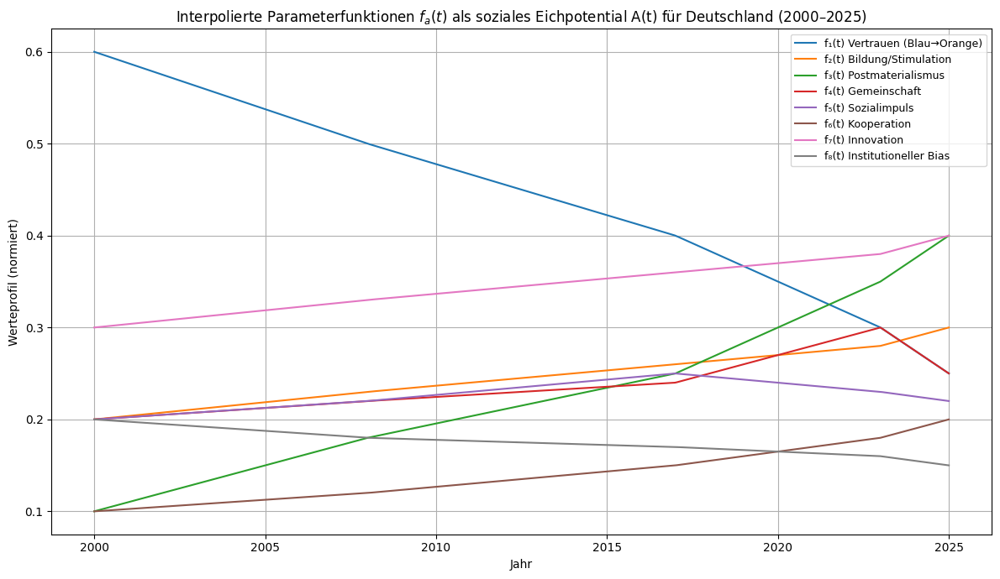

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Zeitachse (Jahre)
years = np.array([2000, 2008, 2017, 2023, 2025])

# Interpolierte Funktionen f1 bis f8 basierend auf gesellschaftlichen Trends
f1_vals = [0.6, 0.5, 0.4, 0.3, 0.25]   # Vertrauen
f2_vals = [0.2, 0.23, 0.26, 0.28, 0.3]  # Bildung/Stimulation
f3_vals = [0.1, 0.18, 0.25, 0.35, 0.4]  # Postmaterialismus
f4_vals = [0.2, 0.22, 0.24, 0.30, 0.25] # Gemeinschaft/Covid peak
f5_vals = [0.2, 0.22, 0.25, 0.23, 0.22] # Sozialimpuls
f6_vals = [0.1, 0.12, 0.15, 0.18, 0.2]  # Kooperation
f7_vals = [0.3, 0.33, 0.36, 0.38, 0.4]  # Innovation
f8_vals = [0.2, 0.18, 0.17, 0.16, 0.15] # institutioneller Bias

# Interpolationsfunktionen
f1 = interp1d(years, f1_vals, kind='linear', fill_value='extrapolate')
f2 = interp1d(years, f2_vals, kind='linear', fill_value='extrapolate')
f3 = interp1d(years, f3_vals, kind='linear', fill_value='extrapolate')
f4 = interp1d(years, f4_vals, kind='linear', fill_value='extrapolate')
f5 = interp1d(years, f5_vals, kind='linear', fill_value='extrapolate')
f6 = interp1d(years, f6_vals, kind='linear', fill_value='extrapolate')
f7 = interp1d(years, f7_vals, kind='linear', fill_value='extrapolate')
f8 = interp1d(years, f8_vals, kind='linear', fill_value='extrapolate')

# Zeitbereich zum Plotten
t_plot = np.linspace(2000, 2025, 500)

# Plot
plt.figure(figsize=(12, 7))
plt.plot(t_plot, f1(t_plot), label="f₁(t) Vertrauen (Blau→Orange)")
plt.plot(t_plot, f2(t_plot), label="f₂(t) Bildung/Stimulation")
plt.plot(t_plot, f3(t_plot), label="f₃(t) Postmaterialismus")
plt.plot(t_plot, f4(t_plot), label="f₄(t) Gemeinschaft")
plt.plot(t_plot, f5(t_plot), label="f₅(t) Sozialimpuls")
plt.plot(t_plot, f6(t_plot), label="f₆(t) Kooperation")
plt.plot(t_plot, f7(t_plot), label="f₇(t) Innovation")
plt.plot(t_plot, f8(t_plot), label="f₈(t) Institutioneller Bias")

plt.title("Interpolierte Parameterfunktionen $f_a(t)$ als soziales Eichpotential A(t) für Deutschland (2000–2025)")
plt.xlabel("Jahr")
plt.ylabel("Werteprofil (normiert)")
plt.grid(True)
plt.legend(loc="upper right", fontsize=9)
plt.tight_layout()

plt.show()


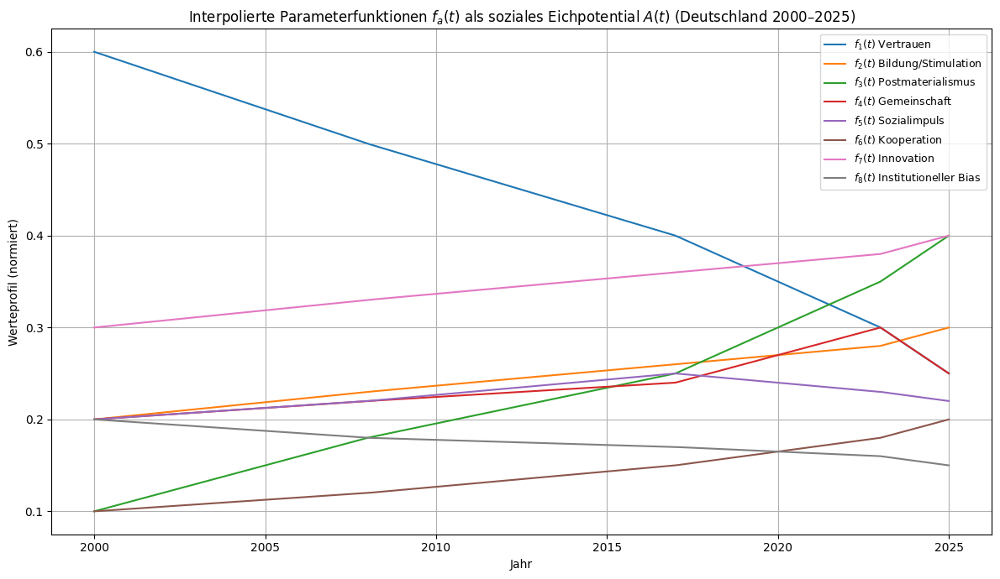

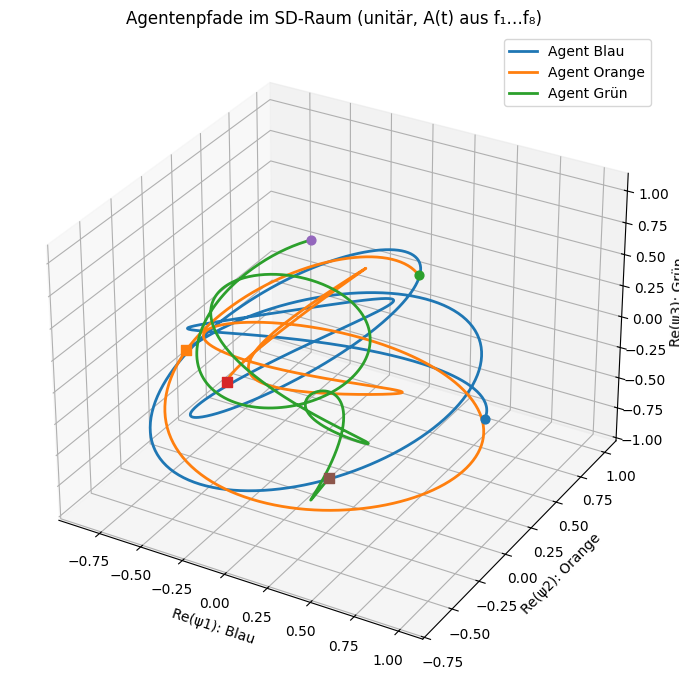

Pancharatnam-Phasen (rad):  A=-2.2898, B=-1.7291, C=-2.2860
Pancharatnam-Phasen (deg):  A=-131.20, B=-99.07, C=-130.98
Open-path Berry-Summen (rad):  A=-5.0123, B=-0.3762, C=5.3890
Open-path Berry-Summen (deg):  A=-287.18, B=-21.55, C=308.76


In [ ]:
# -*- coding: utf-8 -*-
# Schrödingergleichung mit extern vorgegebenen Parameterfunktionen f1..f8
# + Plot der f_a(t) und der Agentenpfade
#
# Hinweise (für die Ausführungsumgebung):
# - Es wird ausschließlich matplotlib verwendet (kein seaborn).
# - Es werden keine spezifischen Farben gesetzt.
# - Zeitachse angepasst auf 2000–2025 (entspricht den f_a(t)-Daten).

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp
from numpy.linalg import norm

# =====================================
# 0) Parameterfunktionen f1..f8 (vom Nutzer vorgegeben)
# =====================================
years = np.array([2000, 2008, 2017, 2023, 2025], dtype=float)

f1_vals = np.array([0.6, 0.5, 0.4, 0.3, 0.25], dtype=float)   # Vertrauen
f2_vals = np.array([0.2, 0.23, 0.26, 0.28, 0.3 ], dtype=float)  # Bildung/Stimulation
f3_vals = np.array([0.1, 0.18, 0.25, 0.35, 0.4 ], dtype=float)  # Postmaterialismus
f4_vals = np.array([0.2, 0.22, 0.24, 0.30, 0.25], dtype=float) # Gemeinschaft/Covid peak
f5_vals = np.array([0.2, 0.22, 0.25, 0.23, 0.22], dtype=float) # Sozialimpuls
f6_vals = np.array([0.1, 0.12, 0.15, 0.18, 0.2 ], dtype=float)  # Kooperation
f7_vals = np.array([0.3, 0.33, 0.36, 0.38, 0.4 ], dtype=float)  # Innovation
f8_vals = np.array([0.2, 0.18, 0.17, 0.16, 0.15], dtype=float) # institutioneller Bias

# Interpolationsfunktionen (linear, mit Extrapolation)
f1 = interp1d(years, f1_vals, kind='linear', fill_value='extrapolate')
f2 = interp1d(years, f2_vals, kind='linear', fill_value='extrapolate')
f3 = interp1d(years, f3_vals, kind='linear', fill_value='extrapolate')
f4 = interp1d(years, f4_vals, kind='linear', fill_value='extrapolate')
f5 = interp1d(years, f5_vals, kind='linear', fill_value='extrapolate')
f6 = interp1d(years, f6_vals, kind='linear', fill_value='extrapolate')
f7 = interp1d(years, f7_vals, kind='linear', fill_value='extrapolate')
f8 = interp1d(years, f8_vals, kind='linear', fill_value='extrapolate')

def f_components(t: float) -> np.ndarray:
    """Rückgabe der 8 Komponenten f_a(t) als numpy-Array."""
    return np.array([
        float(f1(t)), float(f2(t)), float(f3(t)), float(f4(t)),
        float(f5(t)), float(f6(t)), float(f7(t)), float(f8(t))
    ], dtype=float)

# =====================================
# 1) Plot der Parameterfunktionen
# =====================================
t_plot = np.linspace(2000, 2025, 500)
fa_stack = np.array([f_components(t) for t in t_plot])

plt.figure(figsize=(12, 7))
labels_f = [
    r"$f_1(t)$ Vertrauen",
    r"$f_2(t)$ Bildung/Stimulation",
    r"$f_3(t)$ Postmaterialismus",
    r"$f_4(t)$ Gemeinschaft",
    r"$f_5(t)$ Sozialimpuls",
    r"$f_6(t)$ Kooperation",
    r"$f_7(t)$ Innovation",
    r"$f_8(t)$ Institutioneller Bias",
]
for i in range(8):
    plt.plot(t_plot, fa_stack[:, i], label=labels_f[i])
plt.title(r"Interpolierte Parameterfunktionen $f_a(t)$ als soziales Eichpotential $A(t)$ (Deutschland 2000–2025)")
plt.xlabel("Jahr")
plt.ylabel("Werteprofil (normiert)")
plt.grid(True)
plt.legend(loc="upper right", fontsize=9)
plt.tight_layout()
plt.show()

# =====================================
# 2) SU(3)-Generatoren (Gell-Mann-Matrizen)
# =====================================
λ1 = np.array([[0,1,0],[1,0,0],[0,0,0]], complex)
λ2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], complex)
λ3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], complex)
λ4 = np.array([[0,0,1],[0,0,0],[1,0,0]], complex)
λ5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], complex)
λ6 = np.array([[0,0,0],[0,0,1],[0,1,0]], complex)
λ7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], complex)
λ8 = (1/np.sqrt(3)) * np.diag([1,1,-2])
generators = [λ1,λ2,λ3,λ4,λ5,λ6,λ7,λ8]

# =====================================
# 3) Hamiltonian H(t) = g * A(t) mit A(t) = Sum f_a(t) * λ_a
# =====================================
g = 1.0
def A_of_t(t: float) -> np.ndarray:
    fa = f_components(t)
    A = np.zeros((3,3), dtype=complex)
    for a in range(8):
        A = A + fa[a] * generators[a]
    return A

def H_of_t(t: float) -> np.ndarray:
    return g * A_of_t(t)

# =====================================
# 4) Schrödingerdynamik: dψ/dt = -i H(t) ψ
# =====================================
def schrodinger_rhs(t, psi_flat):
    psi = psi_flat[:3] + 1j*psi_flat[3:]
    H = H_of_t(t)
    dpsi = -1j * H @ psi
    return np.concatenate([dpsi.real, dpsi.imag])

# Zeitachse (auf 2000–2025 angepasst)
t0, t1 = 2000.0, 2025.0
t_eval = np.linspace(t0, t1, 800)

# Startzustände (Basisvektoren)
psiA0 = np.array([1,0,0], complex)  # Blau
psiB0 = np.array([0,1,0], complex)  # Orange
psiC0 = np.array([0,0,1], complex)  # Grün

def evolve(psi0: np.ndarray):
    y0 = np.concatenate([psi0.real, psi0.imag])
    sol = solve_ivp(
        schrodinger_rhs, [t0, t1], y0, t_eval=t_eval,
        rtol=1e-8, atol=1e-10, method='DOP853'
    )
    psi_t = sol.y[:3, :] + 1j*sol.y[3:, :]
    # Norm erhalten (numerische Stabilisierung)
    norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    psi_t = psi_t / norms
    return sol.t, psi_t.T

tA, pathA = evolve(psiA0)
tB, pathB = evolve(psiB0)
tC, pathC = evolve(psiC0)

# =====================================
# 5) Phasen (Pancharatnam & Open-path Berry-artig)
# =====================================
def pancharatnam_phase(psi_path: np.ndarray) -> float:
    z = np.vdot(psi_path[0], psi_path[-1])
    return float(np.angle(z))

def berry_like_open_phase(psi_path: np.ndarray) -> float:
    ph = 0.0
    for k in range(len(psi_path)-1):
        z = np.vdot(psi_path[k], psi_path[k+1])
        if abs(z) > 1e-12:
            ph += float(np.angle(z))
    return ph

pan_A = pancharatnam_phase(pathA); berr_A = berry_like_open_phase(pathA)
pan_B = pancharatnam_phase(pathB); berr_B = berry_like_open_phase(pathB)
pan_C = pancharatnam_phase(pathC); berr_C = berry_like_open_phase(pathC)

# =====================================
# 6) Visualisierung der Agentenpfade (3D, Realteile)
# =====================================
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')

for path, lab in [(pathA, 'Agent Blau'), (pathB, 'Agent Orange'), (pathC, 'Agent Grün')]:
    X, Y, Z = path.real.T
    ax.plot(X, Y, Z, lw=2, label=lab)
    ax.scatter(X[0], Y[0], Z[0], s=40, marker='o')
    ax.scatter(X[-1], Y[-1], Z[-1], s=60, marker='s')

ax.set_xlabel('Re(ψ1): Blau')
ax.set_ylabel('Re(ψ2): Orange')
ax.set_zlabel('Re(ψ3): Grün')
ax.set_title('Agentenpfade im SD-Raum (unitär, A(t) aus f₁…f₈)')
ax.legend()
plt.tight_layout()
plt.show()

# =====================================
# 7) Phasen-Output & kleine Übersichtstabelle
# =====================================
print("Pancharatnam-Phasen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(pan_A, pan_B, pan_C))
print("Pancharatnam-Phasen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([pan_A, pan_B, pan_C])
))
print("Open-path Berry-Summen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(berr_A, berr_B, berr_C))
print("Open-path Berry-Summen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([berr_A, berr_B, berr_C])
))

# Tabelle der f_a(t) an einigen Stützstellen (optional zur Kontrolle)
t_dense = np.linspace(2000, 2025, 10)
df_params = pd.DataFrame({
    "Jahr": t_dense,
    "f1": f1(t_dense),
    "f2": f2(t_dense),
    "f3": f3(t_dense),
    "f4": f4(t_dense),
    "f5": f5(t_dense),
    "f6": f6(t_dense),
    "f7": f7(t_dense),
    "f8": f8(t_dense),
})


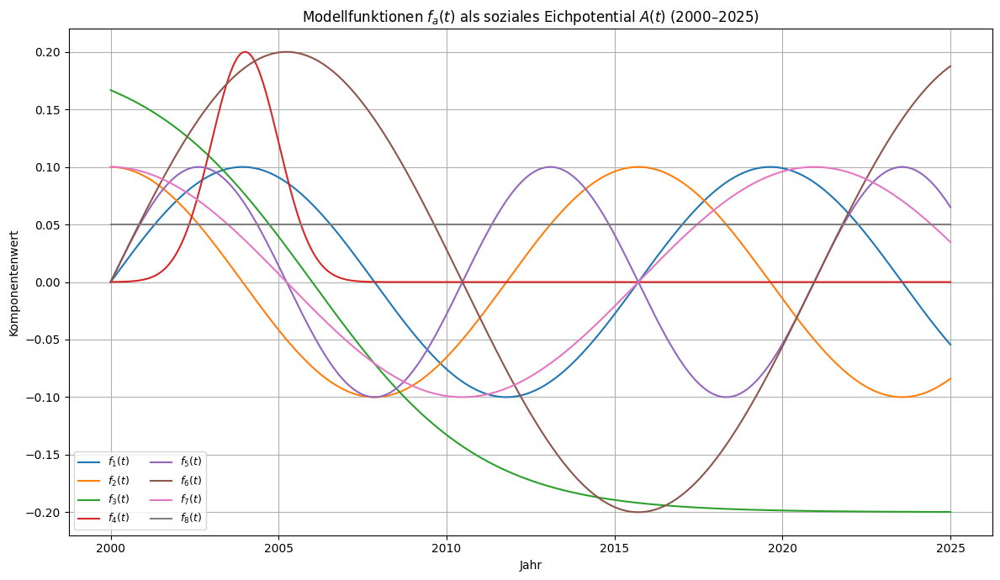

Pancharatnam-Phasen (rad):  A=-0.2129, B=-2.1043, C=2.3939
Pancharatnam-Phasen (deg):  A=-12.20, B=-120.56, C=137.16
Open-path Berry-Summen (rad):  A=-3.6567, B=1.4356, C=2.2211
Open-path Berry-Summen (deg):  A=-209.51, B=82.25, C=127.26


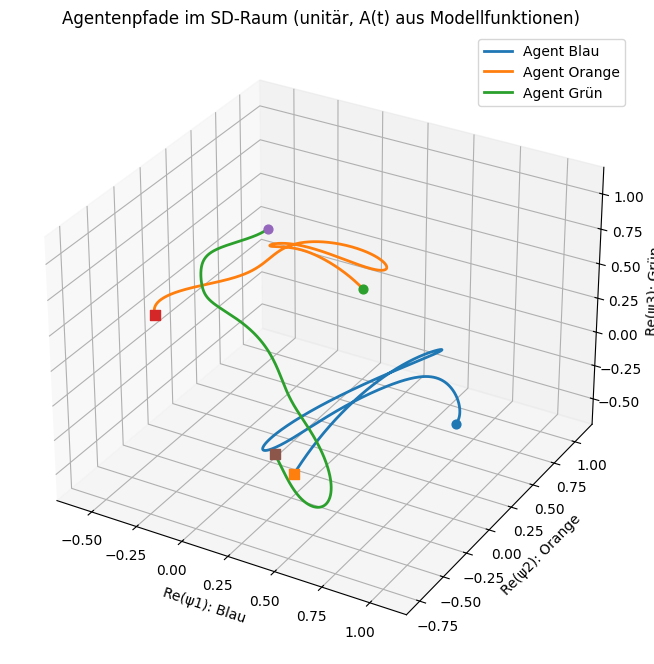

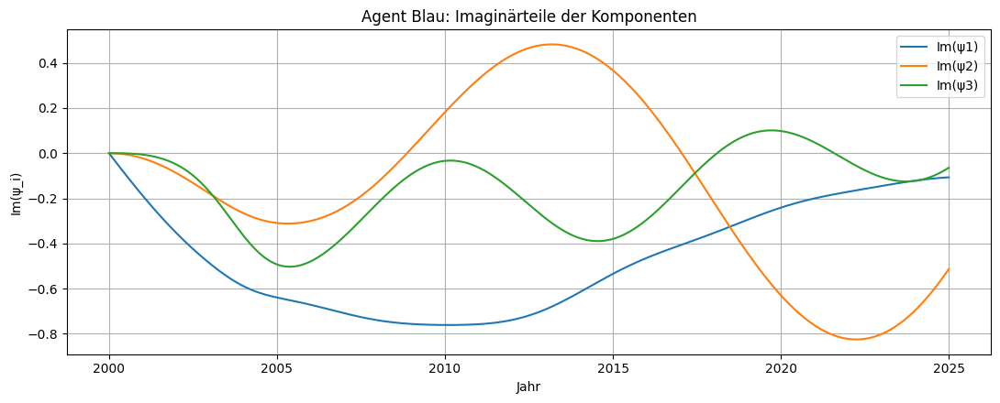

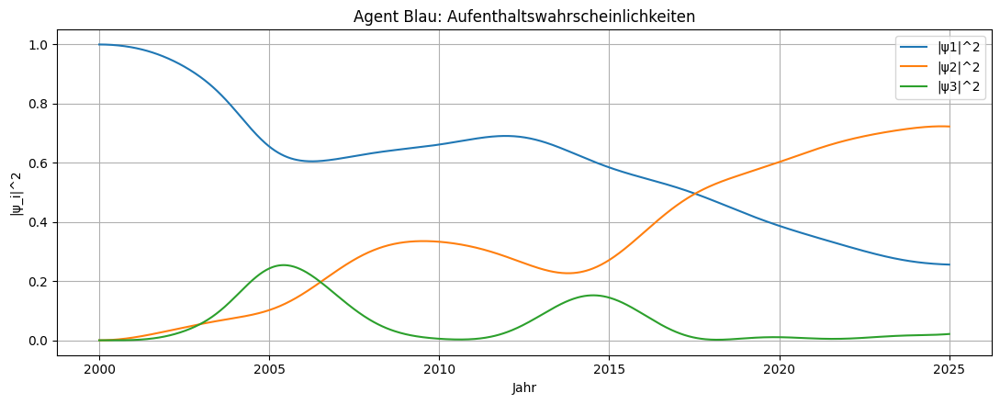

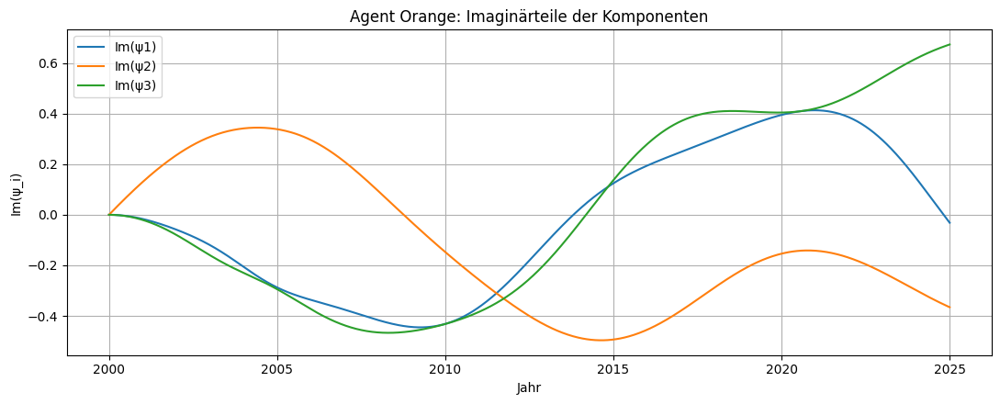

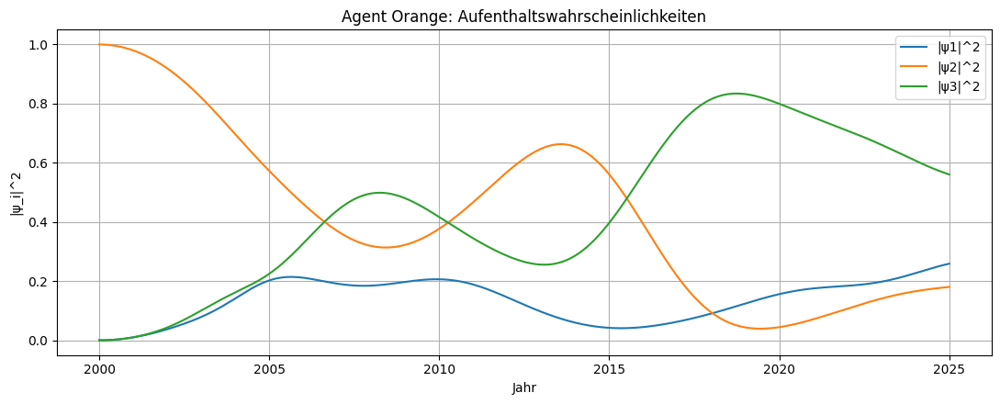

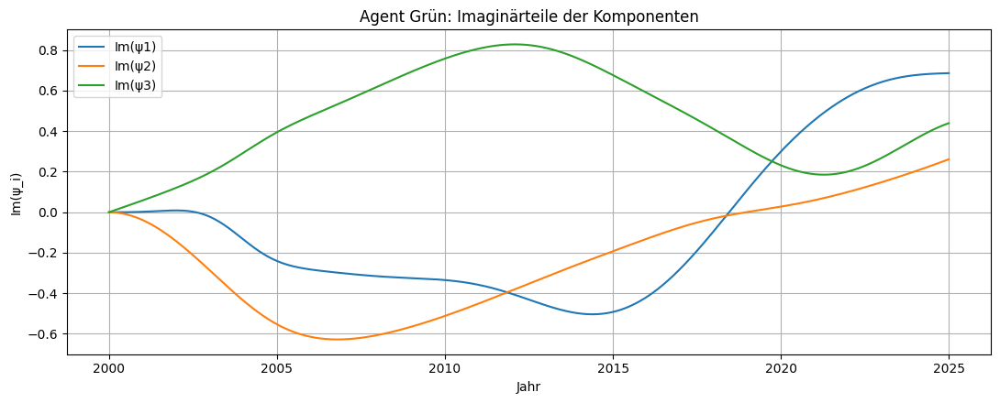

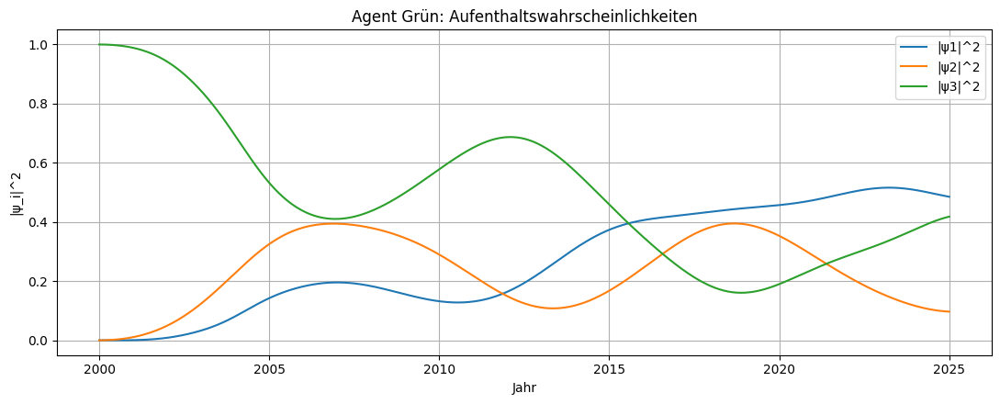

In [ ]:
# -*- coding: utf-8 -*-
# Schrödingergleichung mit den Modellfunktionen f1..f8
# Ausgabe:
# - Plot der f_a(t)
# - 3D-Agentenpfade (Re-Teile) mit gut sichtbarem z-Achsen-Label
# - Zeitreihen: Im(psi_i) und |psi_i|^2 für alle drei Agenten
#
# Plot-Regeln:
# - Nur matplotlib (kein seaborn)
# - Pro Chart eine Figure
# - Keine spezifischen Farben
# - Keine Datei-Exporte

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# =====================================
# 0) Modellfunktionen f1..f8
# =====================================
def f1(t): return 0.1 * np.sin(0.4 * t)
def f2(t): return 0.1 * np.cos(0.4 * t)
def f3(t): return -0.2 * np.tanh(0.2 * (t - 6))
def f4(t): return 0.2 * np.exp(-((t - 4) ** 2) / 2)
def f5(t): return 0.1 * np.sin(0.6 * t)
def f6(t): return 0.2 * np.sin(0.3 * t)
def f7(t): return 0.1 * np.cos(0.3 * t)
def f8(t): return 0.05

def f_components(t: float) -> np.ndarray:
    return np.array([f1(t), f2(t), f3(t), f4(t),
                     f5(t), f6(t), f7(t), f8(t)], dtype=float)

# =====================================
# 1) Plot der Parameterfunktionen
# =====================================
t_plot = np.linspace(0.0, 25.0, 800)
fa_stack = np.array([f_components(t) for t in t_plot])

plt.figure(figsize=(12, 7))
labels_f = [r"$f_1(t)$", r"$f_2(t)$", r"$f_3(t)$", r"$f_4(t)$",
            r"$f_5(t)$", r"$f_6(t)$", r"$f_7(t)$", r"$f_8(t)$"]
for i in range(8):
    plt.plot(t_plot + 2000.0, fa_stack[:, i], label=labels_f[i])
plt.title(r"Modellfunktionen $f_a(t)$ als soziales Eichpotential $A(t)$ (2000–2025)")
plt.xlabel("Jahr")
plt.ylabel("Komponentenwert")
plt.grid(True)
plt.legend(ncol=2, fontsize=9)
plt.tight_layout()
plt.show()

# =====================================
# 2) SU(3)-Generatoren (Gell-Mann)
# =====================================
λ1 = np.array([[0,1,0],[1,0,0],[0,0,0]], complex)
λ2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], complex)
λ3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], complex)
λ4 = np.array([[0,0,1],[0,0,0],[1,0,0]], complex)
λ5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], complex)
λ6 = np.array([[0,0,0],[0,0,1],[0,1,0]], complex)
λ7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], complex)
λ8 = (1/np.sqrt(3)) * np.diag([1,1,-2])
generators = [λ1,λ2,λ3,λ4,λ5,λ6,λ7,λ8]

# =====================================
# 3) Hamiltonian H(t) = g * A(t)
# =====================================
g = 1.0
def A_of_t(t: float) -> np.ndarray:
    fa = f_components(t)
    A = np.zeros((3,3), dtype=complex)
    for a in range(8):
        A = A + fa[a] * generators[a]
    return A

def H_of_t(t: float) -> np.ndarray:
    return g * A_of_t(t)

# =====================================
# 4) Schrödingerdynamik
# =====================================
def schrodinger_rhs(t, psi_flat):
    psi = psi_flat[:3] + 1j*psi_flat[3:]
    H = H_of_t(t)
    dpsi = -1j * H @ psi
    return np.concatenate([dpsi.real, dpsi.imag])

t0, t1 = 0.0, 25.0
t_eval = np.linspace(t0, t1, 800)

psiA0 = np.array([1,0,0], complex)
psiB0 = np.array([0,1,0], complex)
psiC0 = np.array([0,0,1], complex)

def evolve(psi0: np.ndarray, method: str = 'DOP853', renorm: bool = True):
    y0 = np.concatenate([psi0.real, psi0.imag])
    sol = solve_ivp(schrodinger_rhs, [t0, t1], y0, t_eval=t_eval,
                    rtol=1e-8, atol=1e-10, method=method)
    psi_t = sol.y[:3, :] + 1j*sol.y[3:, :]
    if renorm:
        psi_t = psi_t / np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    return sol.t, psi_t.T

tA, pathA = evolve(psiA0)
tB, pathB = evolve(psiB0)
tC, pathC = evolve(psiC0)

# =====================================
# 5) Phasen (Pancharatnam & Open-path Berry-artig)
# =====================================
def pancharatnam_phase(psi_path: np.ndarray) -> float:
    z = np.vdot(psi_path[0], psi_path[-1])
    return float(np.angle(z))

def berry_like_open_phase(psi_path: np.ndarray) -> float:
    ph = 0.0
    for k in range(len(psi_path)-1):
        z = np.vdot(psi_path[k], psi_path[k+1])
        if abs(z) > 1e-12:
            ph += float(np.angle(z))
    return ph

pan_A = pancharatnam_phase(pathA); berr_A = berry_like_open_phase(pathA)
pan_B = pancharatnam_phase(pathB); berr_B = berry_like_open_phase(pathB)
pan_C = pancharatnam_phase(pathC); berr_C = berry_like_open_phase(pathC)

print("Pancharatnam-Phasen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(pan_A, pan_B, pan_C))
print("Pancharatnam-Phasen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([pan_A, pan_B, pan_C])
))
print("Open-path Berry-Summen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(berr_A, berr_B, berr_C))
print("Open-path Berry-Summen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([berr_A, berr_B, berr_C])
))

# =====================================
# 6) 3D-Pfade (Re-Teile) – z-Achsen-Label sichtbar
# =====================================
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
for path, lab in [(pathA, 'Agent Blau'), (pathB, 'Agent Orange'), (pathC, 'Agent Grün')]:
    X, Y, Z = path.real.T
    ax.plot(X, Y, Z, lw=2, label=lab)
    ax.scatter(X[0], Y[0], Z[0], s=40, marker='o')
    ax.scatter(X[-1], Y[-1], Z[-1], s=60, marker='s')
ax.set_xlabel('Re(ψ1): Blau')
ax.set_ylabel('Re(ψ2): Orange')
ax.set_zlabel('Re(ψ3): Grün')
ax.set_title('Agentenpfade im SD-Raum (unitär, A(t) aus Modellfunktionen)')
ax.legend()
ax.margins(0.1)
plt.tight_layout(pad=2.0)
plt.show()

# =====================================
# 7) Zeitreihenplots für alle Agenten
# =====================================
def plot_imag_time(t, path, title_prefix):
    plt.figure(figsize=(11, 4.5))
    Im = path.imag
    plt.plot(t + 2000.0, Im[:,0], label="Im(ψ1)")
    plt.plot(t + 2000.0, Im[:,1], label="Im(ψ2)")
    plt.plot(t + 2000.0, Im[:,2], label="Im(ψ3)")
    plt.title(f"{title_prefix}: Imaginärteile der Komponenten")
    plt.xlabel("Jahr")
    plt.ylabel("Im(ψ_i)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_probs_time(t, path, title_prefix):
    plt.figure(figsize=(11, 4.5))
    P = np.abs(path)**2
    plt.plot(t + 2000.0, P[:,0], label="|ψ1|^2")
    plt.plot(t + 2000.0, P[:,1], label="|ψ2|^2")
    plt.plot(t + 2000.0, P[:,2], label="|ψ3|^2")
    plt.title(f"{title_prefix}: Aufenthaltswahrscheinlichkeiten")
    plt.xlabel("Jahr")
    plt.ylabel("|ψ_i|^2")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Agent Blau
plot_imag_time(tA, pathA, "Agent Blau")
plot_probs_time(tA, pathA, "Agent Blau")

# Agent Orange
plot_imag_time(tB, pathB, "Agent Orange")
plot_probs_time(tB, pathB, "Agent Orange")

# Agent Grün
plot_imag_time(tC, pathC, "Agent Grün")
plot_probs_time(tC, pathC, "Agent Grün")


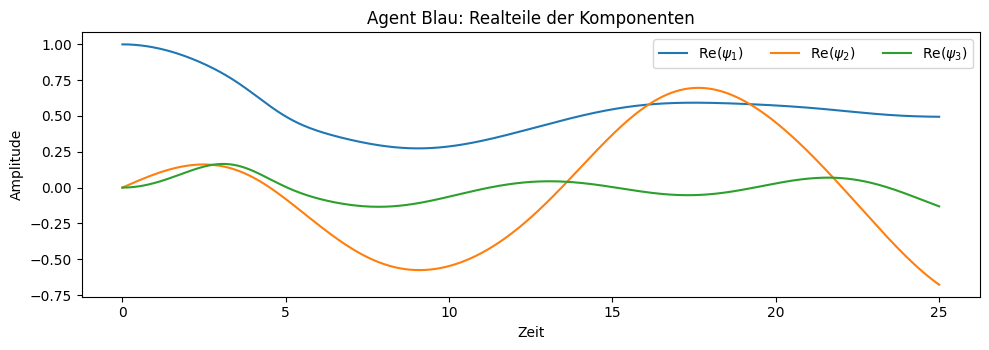

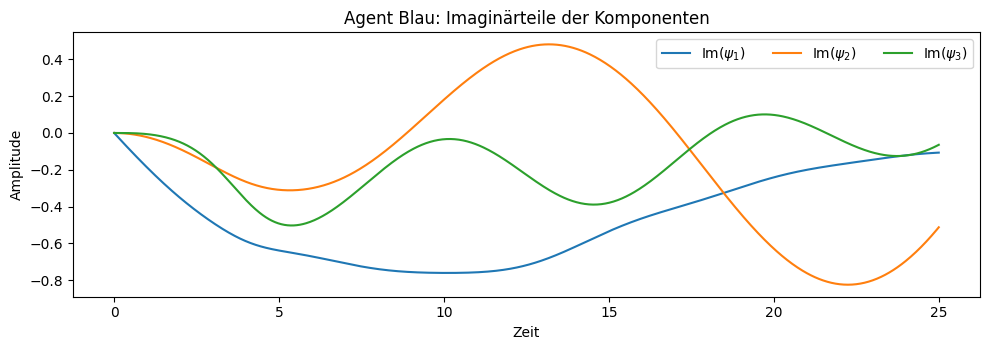

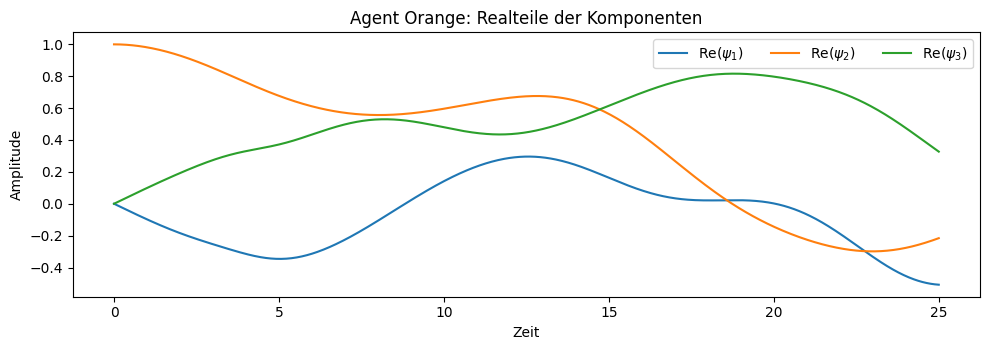

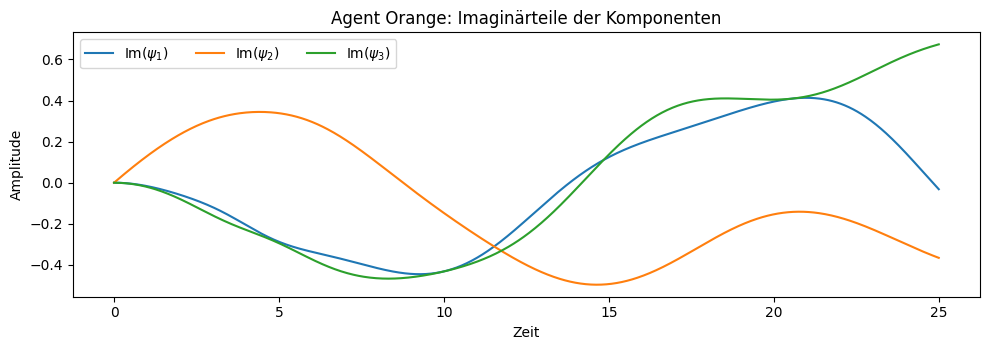

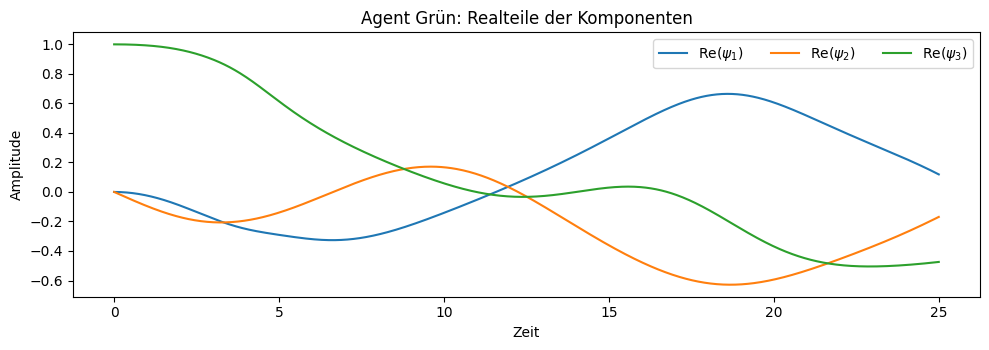

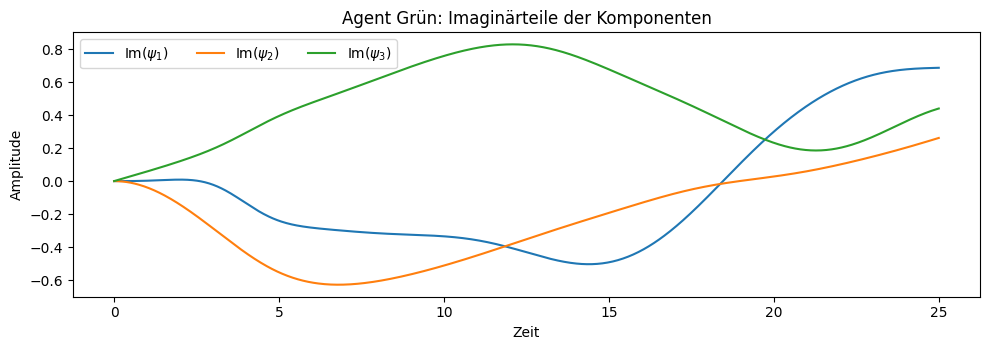

In [ ]:
def plot_agent_components(path, t_axis, title_prefix):
    # path: shape (T,3), komplex
    comp_labels = [r"$\psi_1$", r"$\psi_2$", r"$\psi_3$"]

    # Realteile
    plt.figure(figsize=(10,3.6))
    for j in range(3):
        plt.plot(t_axis, np.real(path[:, j]), label=fr"Re({comp_labels[j]})")
    plt.xlabel("Zeit"); plt.ylabel("Amplitude")
    plt.title(f"{title_prefix}: Realteile der Komponenten")
    plt.legend(ncol=3); plt.tight_layout(); plt.show()

    # Imaginärteile
    plt.figure(figsize=(10,3.6))
    for j in range(3):
        plt.plot(t_axis, np.imag(path[:, j]), label=fr"Im({comp_labels[j]})")
    plt.xlabel("Zeit"); plt.ylabel("Amplitude")
    plt.title(f"{title_prefix}: Imaginärteile der Komponenten")
    plt.legend(ncol=3); plt.tight_layout(); plt.show()

# Aufruf für die drei Agenten (nutzt deine vorhandenen Variablen tA/tB/tC ~ t_eval)
plot_agent_components(pathA, tA, "Agent Blau")
plot_agent_components(pathB, tB, "Agent Orange")
plot_agent_components(pathC, tC, "Agent Grün")


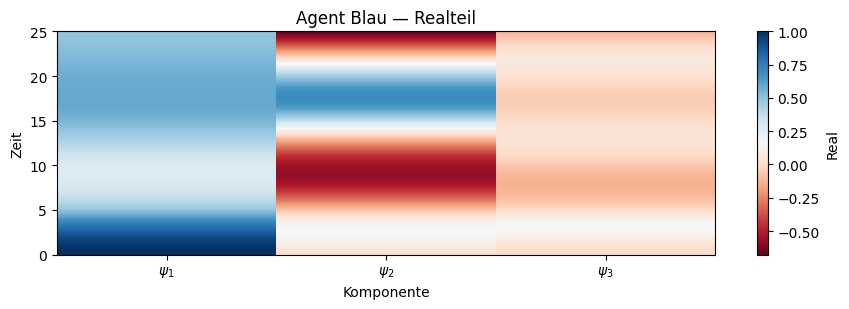

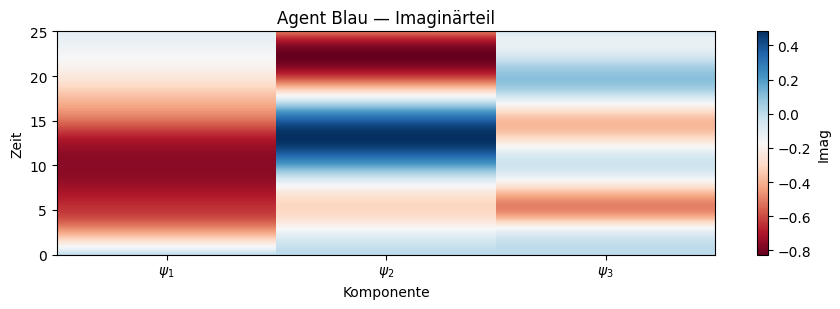

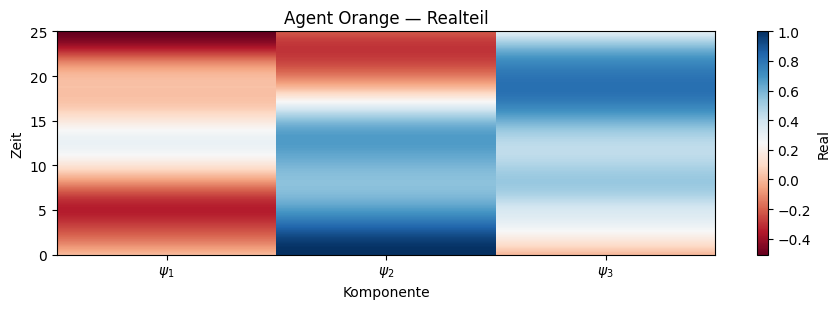

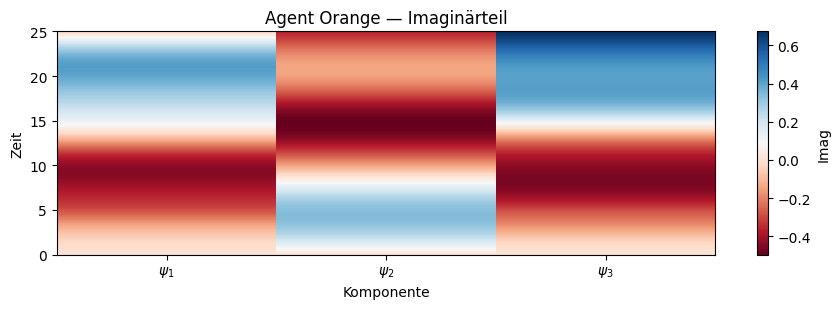

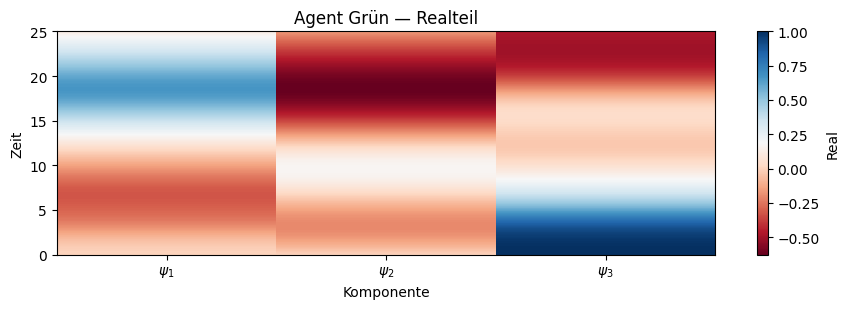

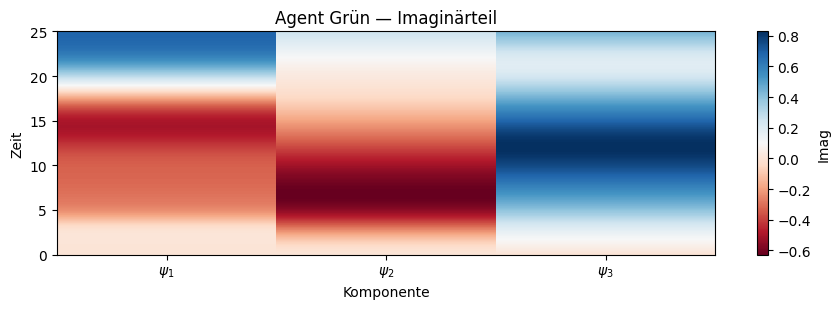

In [ ]:
def heatmap_agent(path, t_axis, title):
    # Matrix (T,3) -> zwei Heatmaps für Re/Im
    plt.figure(figsize=(9,3.2))
    plt.pcolormesh(np.arange(3), t_axis, np.real(path), shading="auto", cmap="RdBu")
    plt.colorbar(label="Real")
    plt.xticks([0,1,2],[r"$\psi_1$", r"$\psi_2$", r"$\psi_3$"])
    plt.xlabel("Komponente"); plt.ylabel("Zeit")
    plt.title(title + " — Realteil"); plt.tight_layout(); plt.show()

    plt.figure(figsize=(9,3.2))
    plt.pcolormesh(np.arange(3), t_axis, np.imag(path), shading="auto", cmap="RdBu")
    plt.colorbar(label="Imag")
    plt.xticks([0,1,2],[r"$\psi_1$", r"$\psi_2$", r"$\psi_3$"])
    plt.xlabel("Komponente"); plt.ylabel("Zeit")
    plt.title(title + " — Imaginärteil"); plt.tight_layout(); plt.show()

heatmap_agent(pathA, tA, "Agent Blau")
heatmap_agent(pathB, tB, "Agent Orange")
heatmap_agent(pathC, tC, "Agent Grün")


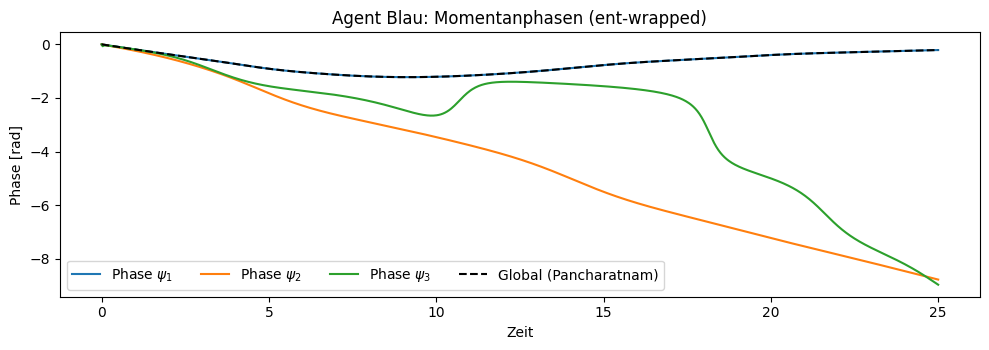

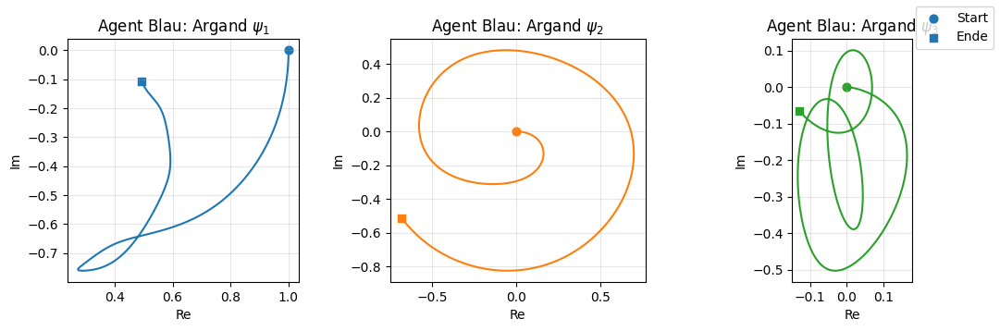

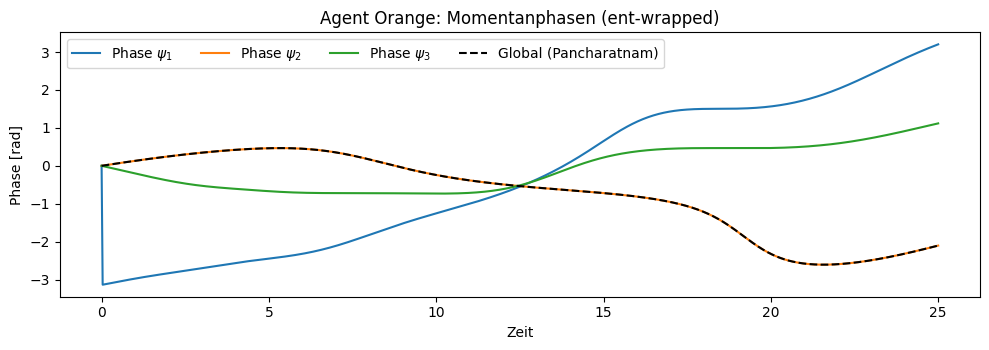

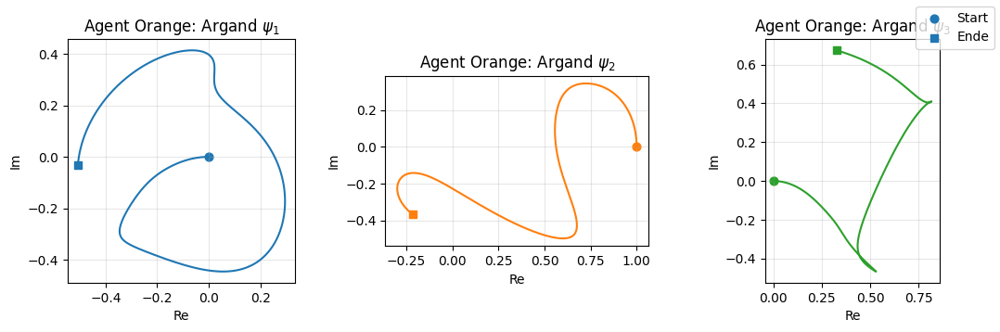

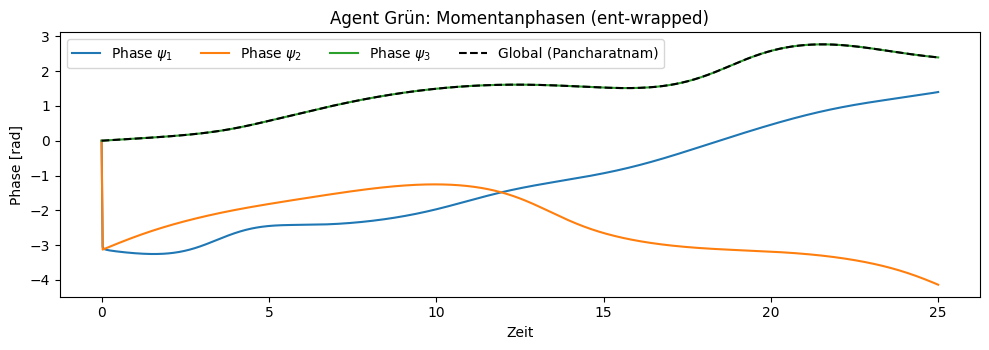

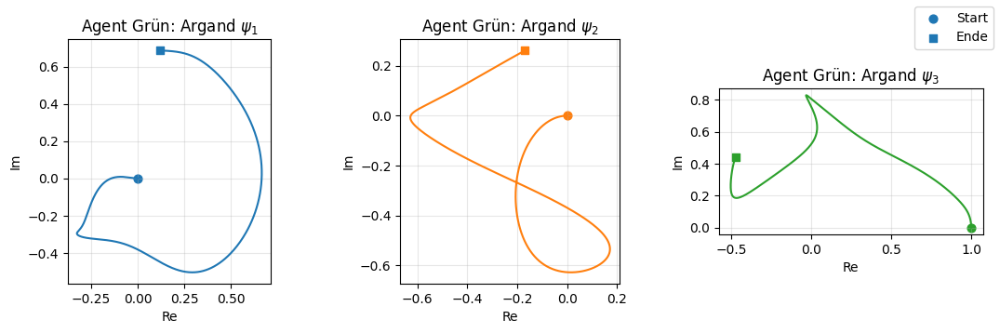

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def global_pancharatnam_phase(path):
    """
    Pancharatnam-Momentanphase φ_P(t) = arg(<ψ(0)|ψ(t)>), ent-wrapped.
    Liefert Array der Länge T.
    """
    phi = np.angle(np.vdot(path[0], path[0]))  # = 0
    phases = [0.0]
    for k in range(1, len(path)):
        z = np.vdot(path[0], path[k])
        phases.append(np.angle(z))
    phases = np.unwrap(np.array(phases))
    # Start bei 0
    return phases - phases[0]

def component_phases_unwrapped(path):
    """
    Unwrapped-Komponentenphasen (T,3), jeweils bei t0 auf 0 gesetzt.
    """
    ph = np.angle(path)                 # (T,3)
    phu = np.unwrap(ph, axis=0)         # ent-wrapped entlang der Zeit
    phu = phu - phu[0:1, :]             # bei 0 starten
    return phu

def plot_agent_phase_and_argand(path, t_axis, title_prefix, show_global=True, ds=1):
    """
    path: (T,3) komplex, t_axis: (T,)
    ds: optionales Downsampling für Argand-Pfade (z.B. ds=2 oder 3 bei sehr vielen Punkten)
    """
    comp_labels = [r"$\psi_1$", r"$\psi_2$", r"$\psi_3$"]
    colors = ["tab:blue", "tab:orange", "tab:green"]

    # -------- Momentanphasen --------
    phu = component_phases_unwrapped(path)  # (T,3)

    plt.figure(figsize=(10,3.6))
    for j in range(3):
        plt.plot(t_axis, phu[:, j], label=fr"Phase {comp_labels[j]}", color=colors[j])
    if show_global:
        phiP = global_pancharatnam_phase(path)
        plt.plot(t_axis, phiP, "k--", lw=1.5, label=r"Global (Pancharatnam)")
    plt.xlabel("Zeit")
    plt.ylabel("Phase [rad]")
    plt.title(f"{title_prefix}: Momentanphasen (ent-wrapped)")
    plt.legend(ncol=4)
    plt.tight_layout(); plt.show()

    # -------- Argand-Plots (Re vs. Im) je Komponente --------
    fig, axs = plt.subplots(1, 3, figsize=(11,3.6))
    for j, ax in enumerate(axs):
        z = path[::ds, j]  # optionales Downsampling
        ax.plot(np.real(z), np.imag(z), color=colors[j], lw=1.5)
        # Start- und Endpunkt markieren
        ax.scatter(np.real(z[0]),  np.imag(z[0]),  s=40, marker='o', color=colors[j], label="Start")
        ax.scatter(np.real(z[-1]), np.imag(z[-1]), s=40, marker='s', color=colors[j], label="Ende")
        ax.set_aspect('equal', adjustable='box')
        ax.set_xlabel("Re")
        ax.set_ylabel("Im")
        ax.set_title(f"{title_prefix}: Argand {comp_labels[j]}")
        ax.grid(True, alpha=0.3)
    # gemeinsame Legende
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper right")
    plt.tight_layout(); plt.show()

# ---- Aufrufe für die drei Agenten ----
plot_agent_phase_and_argand(pathA, tA, "Agent Blau",   show_global=True, ds=1)
plot_agent_phase_and_argand(pathB, tB, "Agent Orange", show_global=True, ds=1)
plot_agent_phase_and_argand(pathC, tC, "Agent Grün",   show_global=True, ds=1)


<>:73: SyntaxWarning: invalid escape sequence '\p'
<>:73: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipython-input-1351234276.py:73: SyntaxWarning: invalid escape sequence '\p'
  plt.title(f"{title_prefix}: RMS-Abstand der Komponentenphasen von $\phi_P$")


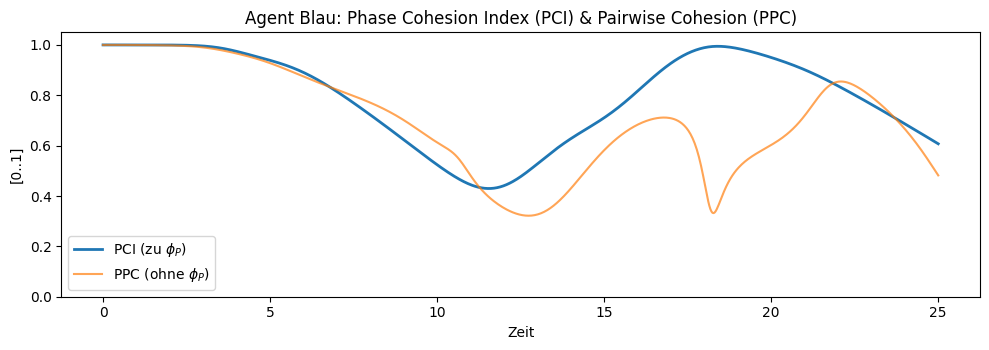

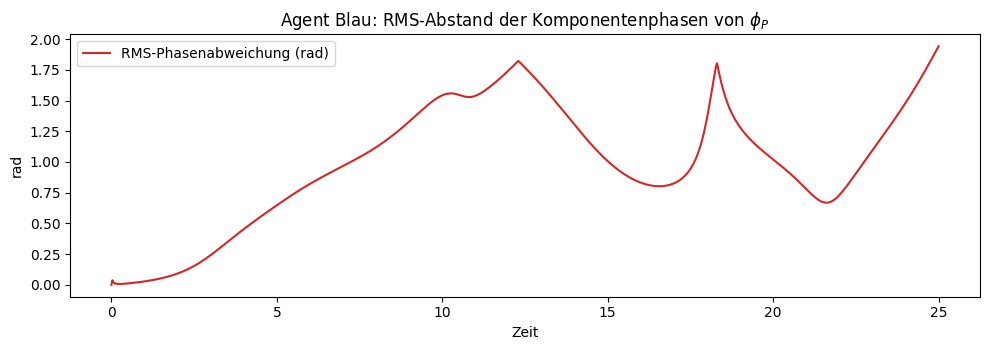

--- Agent Blau — Zusammenfassung ---
PCI      mean=0.796, min=0.430 @ 11.55, max=1.000 @ 0.00
PPC      mean=0.704, min=0.322 @ 12.73, max=1.000 @ 0.00
RMS(rad)  mean=0.995, min=0.000 @ 0.00, max=1.942 @ 25.00


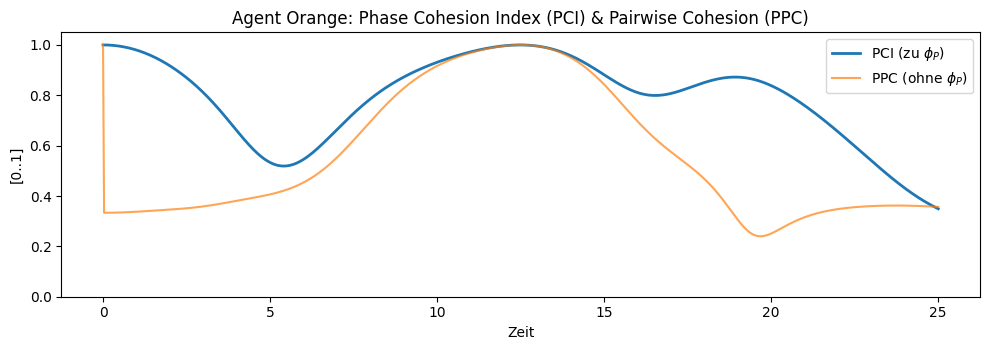

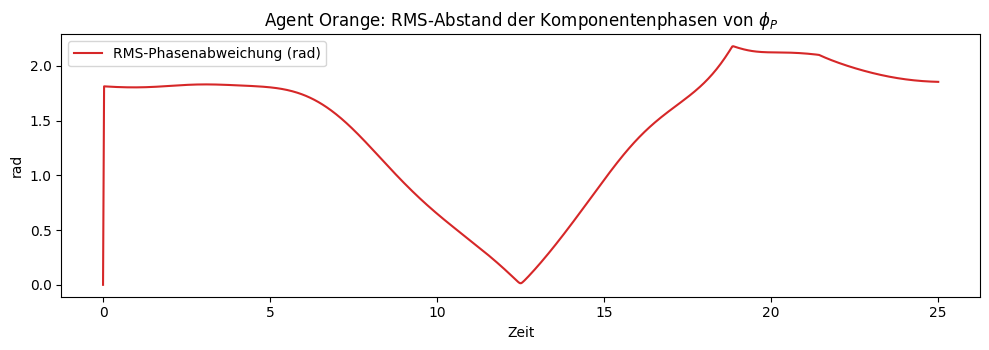

--- Agent Orange — Zusammenfassung ---
PCI      mean=0.790, min=0.349 @ 25.00, max=1.000 @ 0.00
PPC      mean=0.563, min=0.240 @ 19.68, max=1.000 @ 0.00
RMS(rad)  mean=1.449, min=0.000 @ 0.00, max=2.180 @ 18.87


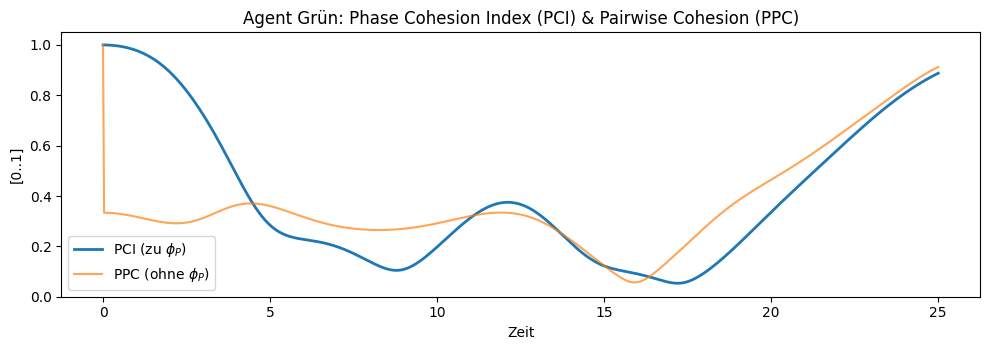

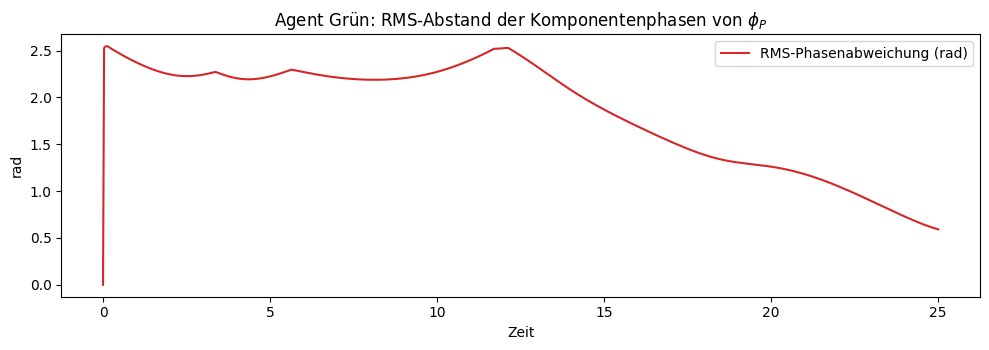

--- Agent Grün — Zusammenfassung ---
PCI      mean=0.395, min=0.053 @ 17.21, max=1.000 @ 0.00
PPC      mean=0.364, min=0.057 @ 15.89, max=1.000 @ 0.00
RMS(rad)  mean=1.846, min=0.000 @ 0.00, max=2.546 @ 0.13


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- Hilfsfunktionen ----------
def pancharatnam_phase_series(path):
    """φ_P(t) = arg(<ψ(0)|ψ(t)>), als Array (T,), NICHT ent-wrapped (zirkulär sinnvoll)."""
    z = np.array([np.vdot(path[0], path[k]) for k in range(len(path))], dtype=complex)
    return np.angle(z)

def component_phases(path):
    """Komponenten-Phasen θ_j(t), Array (T,3), im Bereich (-π,π]."""
    return np.angle(path)

def amp_weights(path, eps=1e-15):
    """Amplituden-Gewichte w_j(t) = |ψ_j|^2 / Sum, shape (T,3)."""
    p = np.abs(path)**2
    s = p.sum(axis=1, keepdims=True) + eps
    return p / s

def pci_from_path(path):
    """PCI(t) gemäß Definition, Array (T,)."""
    theta = component_phases(path)              # (T,3)
    phiP  = pancharatnam_phase_series(path)     # (T,)
    w     = amp_weights(path)                   # (T,3)
    # zirkuläre Differenzen θ_j - φ_P  (broadcast auf (T,3))
    dphi  = theta - phiP[:,None]
    # „Wickeln“ auf (-π,π] optional nicht nötig für exp(i*·); hier egal:
    z = (w * np.exp(1j*dphi)).sum(axis=1)       # (T,)
    return np.abs(z)

def ppc_from_path(path):
    """Pairwise Phase Cohesion (ohne Bezug auf φ_P): R = |mean_j e^{i θ_j}|, Array (T,)."""
    theta = component_phases(path)
    z = np.exp(1j*theta).mean(axis=1)           # (T,)
    return np.abs(z)

def rms_phase_spread(path):
    """RMS-Abweichung der ent-wrapped Phasen θ_j von φ_P in rad (klein = kohärent)."""
    theta = np.unwrap(np.angle(path), axis=0)           # (T,3)
    phiP  = np.unwrap(pancharatnam_phase_series(path))  # (T,)
    d = theta - phiP[:,None]                            # (T,3)
    d = (d + np.pi)%(2*np.pi) - np.pi                   # wrap zurück auf (-π,π]
    return np.sqrt((d**2).mean(axis=1))                 # (T,)

def summarize_curve(name, t_axis, y):
    return {
        "name": name,
        "mean": float(np.nanmean(y)),
        "min": float(np.nanmin(y)),
        "max": float(np.nanmax(y)),
        "t_at_min": float(t_axis[np.nanargmin(y)]),
        "t_at_max": float(t_axis[np.nanargmax(y)]),
    }

def plot_pci_block(path, t_axis, title_prefix):
    pci = pci_from_path(path)        # [0..1]
    ppc = ppc_from_path(path)        # [0..1]
    rms = rms_phase_spread(path)     # rad

    # --- Plot 1: PCI & PPC ---
    plt.figure(figsize=(10,3.6))
    plt.plot(t_axis, pci,  label=r"PCI (zu $\phi_P$)", lw=2)
    plt.plot(t_axis, ppc,  label=r"PPC (ohne $\phi_P$)", alpha=0.7)
    plt.ylim(0,1.05)
    plt.xlabel("Zeit"); plt.ylabel("[0..1]")
    plt.title(f"{title_prefix}: Phase Cohesion Index (PCI) & Pairwise Cohesion (PPC)")
    plt.legend(); plt.tight_layout(); plt.show()

    # --- Plot 2: RMS-Abweichung (rad) ---
    plt.figure(figsize=(10,3.6))
    plt.plot(t_axis, rms, color="tab:red", label="RMS-Phasenabweichung (rad)")
    plt.xlabel("Zeit"); plt.ylabel("rad")
    plt.title(f"{title_prefix}: RMS-Abstand der Komponentenphasen von $\phi_P$")
    plt.legend(); plt.tight_layout(); plt.show()

    # --- Konsolen-Zusammenfassung ---
    summ = [
        summarize_curve("PCI", t_axis, pci),
        summarize_curve("PPC", t_axis, ppc),
        summarize_curve("RMS(rad)", t_axis, rms),
    ]
    print(f"--- {title_prefix} — Zusammenfassung ---")
    for s in summ:
        print("{name:7s}  mean={mean:.3f}, min={min:.3f} @ {tmin:.2f}, max={max:.3f} @ {tmax:.2f}"
              .format(name=s["name"], mean=s["mean"], min=s["min"], tmin=s["t_at_min"], max=s["max"], tmax=s["t_at_max"]))

# ---- Aufrufe für Blau / Orange / Grün ----
plot_pci_block(pathA, tA, "Agent Blau")
plot_pci_block(pathB, tB, "Agent Orange")
plot_pci_block(pathC, tC, "Agent Grün")


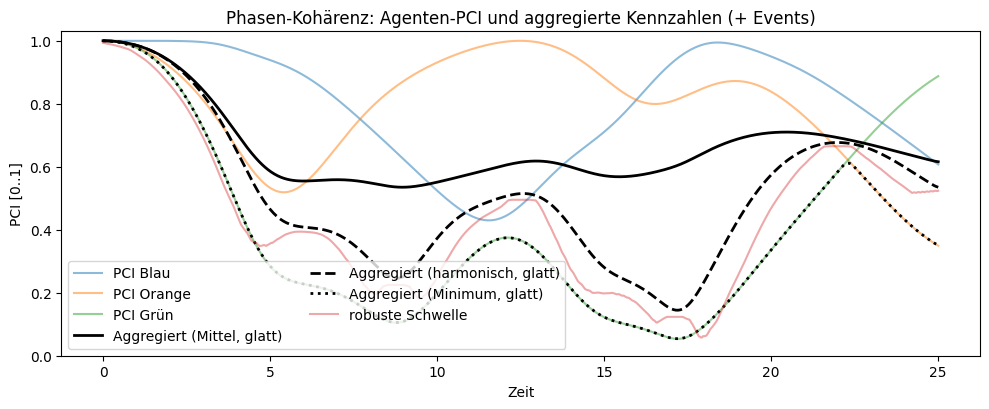

=== PCI-Einbruch-Events (harmonische Aggregation) ===


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------
# 1) PCI je Agent berechnen
# -------------------------------
PCI_A = pci_from_path(pathA)   # shape (T,)
PCI_B = pci_from_path(pathB)
PCI_C = pci_from_path(pathC)

# optionale Agenten-Gewichte (z.B. Größe/Einfluss der Teilpopulation)
wA, wB, wC = 1.0, 1.0, 1.0
Wsum = wA + wB + wC

# Aggregationen
PCI_mean_w   = (wA*PCI_A + wB*PCI_B + wC*PCI_C) / Wsum              # gewichtetes Mittel
PCI_harmonic = 3.0 / (1e-12 + 1.0/PCI_A + 1.0/PCI_B + 1.0/PCI_C)    # konservativer
PCI_min      = np.minimum(PCI_A, np.minimum(PCI_B, PCI_C))          # sehr konservativ

# -------------------------------
# 2) Glättung (optional)
# -------------------------------
def moving_avg(y, win=9):
    if win <= 1: return y
    k = win//2
    ypad = np.pad(y, (k,k), mode="edge")
    kern = np.ones(win)/win
    return np.convolve(ypad, kern, mode="valid")

SMOOTH_WIN = 11
A_mean_s   = moving_avg(PCI_mean_w,   SMOOTH_WIN)
A_harm_s   = moving_avg(PCI_harmonic, SMOOTH_WIN)
A_min_s    = moving_avg(PCI_min,      SMOOTH_WIN)

# -------------------------------
# 3) Robuste Event-Detektion
#    (Einbrüche relativ zu lokalem Median)
# -------------------------------
def detect_dips(t_axis, y, win=51, k_mad=2.5, min_duration=0.5):
    """
    y_low := y < (med - k_mad*MAD) innerhalb gleitendem Fenster 'win'.
    Zusammenfassen benachbarter Punkte zu Events; Events < min_duration verwerfen.
    Rückgabe: Liste von (t_start, t_end, y_min, t_at_min)
    """
    # robuster Hintergrund
    half = win//2
    y_med = np.copy(y)
    y_mad = np.zeros_like(y)
    for i in range(len(y)):
        lo = max(0, i-half); hi = min(len(y), i+half+1)
        seg = y[lo:hi]
        med = np.median(seg)
        mad = np.median(np.abs(seg - med)) + 1e-12
        y_med[i] = med
        y_mad[i] = mad

    thr = y_med - k_mad*y_mad
    is_dip = y < thr

    # Events zusammenfassen
    events = []
    in_evt, s_idx = False, 0
    for i, flag in enumerate(is_dip):
        if flag and not in_evt:
            in_evt, s_idx = True, i
        if (not flag or i==len(y)-1) and in_evt:
            e_idx = i if not flag else i  # inkl. letztem Punkt falls dip bis Ende
            t0, t1 = t_axis[s_idx], t_axis[e_idx]
            if (t1 - t0) >= min_duration:
                jmin = s_idx + np.argmin(y[s_idx:e_idx+1])
                events.append((t0, t1, float(y[jmin]), float(t_axis[jmin])))
            in_evt = False
    return events, thr

# Wähle Aggregation für Event-Detektion
t_axis = tA  # alle tA/tB/tC identisch; sonst angleichen
AGGR = A_harm_s   # harmonische (konservativ & stabil)

events, threshold = detect_dips(t_axis, AGGR, win=51, k_mad=2.5, min_duration=0.7)

# -------------------------------
# 4) Plot: Agenten-PCI + Aggregate + Events
# -------------------------------
plt.figure(figsize=(10,4.2))
plt.plot(t_axis, PCI_A, alpha=0.5, label="PCI Blau")
plt.plot(t_axis, PCI_B, alpha=0.5, label="PCI Orange")
plt.plot(t_axis, PCI_C, alpha=0.5, label="PCI Grün")
plt.plot(t_axis, A_mean_s,   'k-',  lw=2, label="Aggregiert (Mittel, glatt)")
plt.plot(t_axis, A_harm_s,   'k--', lw=2, label="Aggregiert (harmonisch, glatt)")
plt.plot(t_axis, A_min_s,    'k:',  lw=2, label="Aggregiert (Minimum, glatt)")

# Schwelle und Events einzeichnen
plt.plot(t_axis, threshold, color='tab:red', alpha=0.4, label="robuste Schwelle")
for (t0, t1, y_min, tmin) in events:
    plt.axvspan(t0, t1, color='tab:red', alpha=0.12)
    plt.plot([tmin], [y_min], 'v', color='tab:red', ms=7)

plt.ylim(0, 1.03)
plt.xlabel("Zeit"); plt.ylabel("PCI [0..1]")
plt.title("Phasen-Kohärenz: Agenten-PCI und aggregierte Kennzahlen (+ Events)")
plt.legend(ncol=2)
plt.tight_layout(); plt.show()

# -------------------------------
# 5) Event-Liste ausgeben (+ optional CSV)
# -------------------------------
print("=== PCI-Einbruch-Events (harmonische Aggregation) ===")
for i,(t0,t1,ymin,tmin) in enumerate(events, 1):
    print(f"{i:2d}:  von t={t0:.2f} bis t={t1:.2f}  |  Minimum {ymin:.3f} bei t={tmin:.2f}")

# Optional: als CSV speichern (Notebook-Ordner)
SAVE_CSV = False
if SAVE_CSV:
    import csv
    with open("pci_events.csv","w",newline="") as f:
        w = csv.writer(f)
        w.writerow(["event_id","t_start","t_end","pci_min","t_at_min"])
        for i,(t0,t1,ymin,tmin) in enumerate(events,1):
            w.writerow([i, t0, t1, ymin, tmin])
    print("→ pci_events.csv geschrieben.")


=== ZIELZUSTAND ANALYSE ===
Option 1: Symmetrische Superposition
Φ_sym = [0.57735027+0.j 0.57735027+0.j 0.57735027+0.j]
Abstand zu |0⟩: 0.577
Abstand zu |1⟩: 0.577
Abstand zu |2⟩: 0.577

Option 2: Komplexer Zustand
Φ_comp = [ 0.57735027+0.j          0.        +0.57735027j -0.57735027+0.j        ]
Abstand zu |0⟩: 0.577
Abstand zu |1⟩: 0.577
Abstand zu |2⟩: 0.577

Option 3: Gewichteter reeller Zustand
Φ_weight = [0.19611614+0.j 0.78446454+0.j 0.58834841+0.j]
Abstand zu |0⟩: 0.196
Abstand zu |1⟩: 0.784
Abstand zu |2⟩: 0.588

=== GEWÄHLTER ZIELZUSTAND ===
Φ = [0.57735027+0.j 0.57735027+0.j 0.57735027+0.j]
||Φ||² = 1.000000+0.000000j

=== ANFANGSZUSTÄNDE ANALYSE ===
Agent A: |⟨ψ₀|Φ⟩|² = 0.333
Agent B: |⟨ψ₀|Φ⟩|² = 0.333
Agent C: |⟨ψ₀|Φ⟩|² = 0.333

=== INTEGRATION (Standard-Parameter) ===
Integriere Agent A...
Integriere Agent B...
Integriere Agent C...

=== PHASENBERECHNUNG ===

=== KORREKTE CHERN-ZAHLEN BERECHNUNG ===
Berechne Dichtematrizen für Parameter-Gitter...
  Agent A: 1/12 2/12 3/12

/usr/local/lib/python3.11/dist-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/usr/local/lib/python3.11/dist-packages/matplotlib/transforms.py:757: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.asarray(points, float)


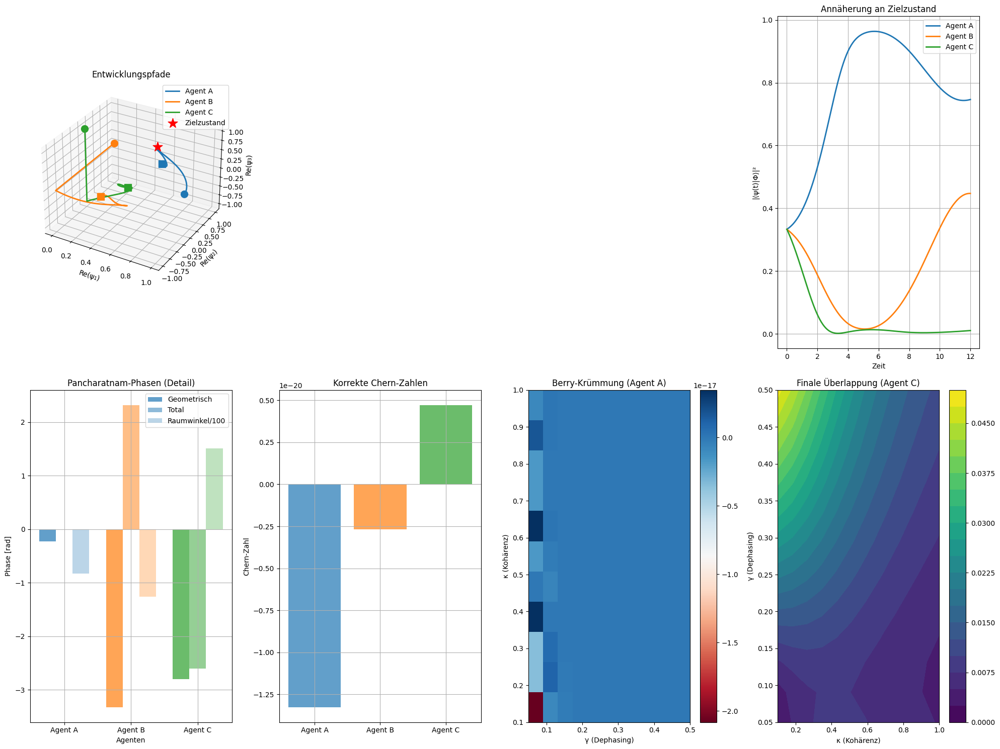


ERGEBNISSE MIT KORREKTER KOHÄRENZ-DEPHASING 2-FORM

Zielzustand: Φ = (0.577+0.000j, 0.577+0.000j, 0.577+0.000j)

Pancharatnam-Phasen (ursprünglich):
  Agent A: 0.0000 rad =   0.00°
  Agent B: 2.3190 rad = 132.87°
  Agent C: -2.6079 rad = -149.42°

Berry-Phasen:
  Agent A: -0.2319 rad = -13.29°
  Agent B: -3.3249 rad = -190.50°
  Agent C: -2.8034 rad = -160.62°

Detaillierte Pancharatnam-Phasen:
  Agent A:
    Total:      0.0000 rad =   0.00°
    Geometrisch: -0.2319 rad = -13.29°
    Dynamisch:   0.0000 rad =   0.00°
    Raumwinkel:  -82.8158 rad = -4745.00°
  Agent B:
    Total:      2.3190 rad = 132.87°
    Geometrisch: -3.3249 rad = -190.50°
    Dynamisch:   0.0000 rad =   0.00°
    Raumwinkel:  -125.8493 rad = -7210.64°
  Agent C:
    Total:      -2.6079 rad = -149.42°
    Geometrisch: -2.8034 rad = -160.62°
    Dynamisch:   0.0000 rad =   0.00°
    Raumwinkel:  151.2231 rad = 8664.45°

KORREKTE Chern-Zahlen (differentielle Geometrie):
  Agent A: -0.000000+0.000000j
  Agent B: -0.

In [ ]:
# Version teilweise verwendet für ersten Blog

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.linalg import eigh
from scipy.interpolate import RegularGridInterpolator

# Parameter (unverändert)
T, dt = 12.0, 0.05
times = np.arange(0, T+dt, dt)
g, hbar = 1.0, 1.0
kappa, gamma = 0.5, 0.2

# Gell-Mann-Matrizen (unverändert)
λ1 = np.array([[0,1,0],[1,0,0],[0,0,0]], dtype=complex)
λ2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], dtype=complex)
λ3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], dtype=complex)
λ4 = np.array([[0,0,1],[0,0,0],[1,0,0]], dtype=complex)
λ5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], dtype=complex)
λ6 = np.array([[0,0,0],[0,0,1],[0,1,0]], dtype=complex)
λ7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], dtype=complex)
λ8 = (1/np.sqrt(3)) * np.array([[1,0,0],[0,1,0],[0,0,-2]], dtype=complex)

# KORRIGIERT: Symmetrischer Zielzustand - gleichmäßige Superposition
print("=== ZIELZUSTAND ANALYSE ===")
print("Option 1: Symmetrische Superposition")
Phi_symmetric = np.ones(3, complex) / np.sqrt(3)
print(f"Φ_sym = {Phi_symmetric}")
print(f"Abstand zu |0⟩: {np.abs(np.vdot([1,0,0], Phi_symmetric)):.3f}")
print(f"Abstand zu |1⟩: {np.abs(np.vdot([0,1,0], Phi_symmetric)):.3f}")
print(f"Abstand zu |2⟩: {np.abs(np.vdot([0,0,1], Phi_symmetric)):.3f}")

print("\nOption 2: Komplexer Zustand")
Phi_complex = np.array([1, 1j, -1], dtype=complex) / np.sqrt(3)
print(f"Φ_comp = {Phi_complex}")
print(f"Abstand zu |0⟩: {np.abs(np.vdot([1,0,0], Phi_complex)):.3f}")
print(f"Abstand zu |1⟩: {np.abs(np.vdot([0,1,0], Phi_complex)):.3f}")
print(f"Abstand zu |2⟩: {np.abs(np.vdot([0,0,1], Phi_complex)):.3f}")

print("\nOption 3: Gewichteter reeller Zustand")
Phi_weighted = np.array([0.2, 0.8, 0.6], dtype=complex)
Phi_weighted = Phi_weighted / np.linalg.norm(Phi_weighted)
print(f"Φ_weight = {Phi_weighted}")
print(f"Abstand zu |0⟩: {np.abs(np.vdot([1,0,0], Phi_weighted)):.3f}")
print(f"Abstand zu |1⟩: {np.abs(np.vdot([0,1,0], Phi_weighted)):.3f}")
print(f"Abstand zu |2⟩: {np.abs(np.vdot([0,0,1], Phi_weighted)):.3f}")

# Wählen wir die symmetrische Option für interessante Phasendynamik
Phi = np.ones(3, complex) / np.sqrt(3)
P_goal = np.outer(Phi, Phi.conj())

print(f"\n=== GEWÄHLTER ZIELZUSTAND ===")
print(f"Φ = {Phi}")
print(f"||Φ||² = {np.vdot(Phi, Phi):.6f}")

# Zeitfunktionen (unverändert)
def f1(t): return 0.1 * np.sin(0.4 * t)
def f2(t): return 0.1 * np.cos(0.4 * t)
def f3(t): return -0.2 * np.tanh(0.2 * (t - 6))
def f4(t): return 0.2 * np.exp(-((t - 4) ** 2) / 2)
def f5(t): return 0.1 * np.sin(0.6 * t)
def f6(t): return 0.2 * np.sin(0.3 * t)
def f7(t): return 0.1 * np.cos(0.3 * t)
def f8(t): return 0.05

def A(t):
    return (f1(t)*λ1 + f2(t)*λ2 + f3(t)*λ3 + f4(t)*λ4 +
            f5(t)*λ5 + f6(t)*λ6 + f7(t)*λ7 + f8(t)*λ8)

def H_coll(t):
    return g * A(t)

# Verbesserter Dissipator mit parametrisierten Kopplungen
def dissipator(rho, kappa_val=kappa, gamma_val=gamma):
    D = np.zeros_like(rho, dtype=complex)

    # Ziel-Attraktor
    L_goal = np.sqrt(kappa_val) * P_goal
    D += L_goal @ rho @ L_goal.conj().T - 0.5 * (
        L_goal.conj().T @ L_goal @ rho + rho @ L_goal.conj().T @ L_goal)

    # Dephasing
    for i in range(3):
        for j in range(3):
            if i != j:
                L_deph = np.sqrt(gamma_val) * np.outer(np.eye(3)[i], np.eye(3)[j])
                D += L_deph @ rho @ L_deph.conj().T - 0.5 * (
                    L_deph.conj().T @ L_deph @ rho + rho @ L_deph.conj().T @ L_deph)

    return D

def master_rhs(t, rho_flat, kappa_val=kappa, gamma_val=gamma):
    rho = rho_flat.reshape(3, 3)
    H = H_coll(t)
    Lu = -1j/hbar * (H @ rho - rho @ H)
    D = dissipator(rho, kappa_val, gamma_val)
    return (Lu + D).reshape(9)

# Funktion zur Berechnung der Dichtematrix bei gegebenen Parametern
def compute_density_matrix_at_params(kappa_val, gamma_val, initial_state, t_final=T):
    """
    Berechnet die finale Dichtematrix für gegebene (κ,γ) Parameter
    """
    rho0 = np.outer(initial_state, initial_state.conj())

    def rhs_parametrized(t, rho_flat):
        return master_rhs(t, rho_flat, kappa_val, gamma_val)

    sol = solve_ivp(rhs_parametrized, [0, t_final], rho0.reshape(9),
                   method='DOP853', rtol=1e-8, atol=1e-10)

    final_rho = sol.y[:, -1].reshape(3, 3)
    # Normalisierung
    trace = np.trace(final_rho)
    if abs(trace) > 1e-12:
        final_rho = final_rho / trace.real

    return final_rho

# NEU: Korrekte Kohärenz-Dephasing 2-Form basierend auf differentieller Geometrie
def correct_coherence_dephasing_2form(initial_states, kappa_range, gamma_range):
    """
    Berechnet die korrekte 2-Form F_κγ = Im[Tr(∂_κ ρ · ∂_γ ρ) - Tr(∂_γ ρ · ∂_κ ρ)]
    """
    n_kappa, n_gamma = len(kappa_range), len(gamma_range)
    n_agents = len(initial_states)

    # Speichere Dichtematrizen für alle Parameter-Kombinationen
    print("Berechne Dichtematrizen für Parameter-Gitter...")
    density_matrices = np.zeros((n_agents, n_kappa, n_gamma, 3, 3), dtype=complex)

    for agent_idx, initial_state in enumerate(initial_states):
        print(f"  Agent {chr(65+agent_idx)}: ", end="")
        for i, kappa_val in enumerate(kappa_range):
            for j, gamma_val in enumerate(gamma_range):
                density_matrices[agent_idx, i, j] = compute_density_matrix_at_params(
                    kappa_val, gamma_val, initial_state)
            print(f"{i+1}/{n_kappa}", end=" ")
        print()

    # Berechne die 2-Form für jeden Agenten
    chern_numbers = []
    berry_curvatures = []

    dkappa = kappa_range[1] - kappa_range[0] if n_kappa > 1 else 1.0
    dgamma = gamma_range[1] - gamma_range[0] if n_gamma > 1 else 1.0

    for agent_idx in range(n_agents):
        print(f"Berechne 2-Form für Agent {chr(65+agent_idx)}...")

        berry_curvature = np.zeros((n_kappa-1, n_gamma-1), dtype=complex)

        for i in range(n_kappa-1):
            for j in range(n_gamma-1):
                # Dichtematrizen an benachbarten Punkten
                rho_00 = density_matrices[agent_idx, i, j]
                rho_10 = density_matrices[agent_idx, i+1, j]
                rho_01 = density_matrices[agent_idx, i, j+1]
                rho_11 = density_matrices[agent_idx, i+1, j+1]

                # Partielle Ableitungen (finite Differenzen)
                drho_dkappa = (rho_10 - rho_00) / dkappa
                drho_dgamma = (rho_01 - rho_00) / dgamma

                # Korrekte 2-Form: F_κγ = Im[Tr(∂_κ ρ · ∂_γ ρ) - Tr(∂_γ ρ · ∂_κ ρ)]
                term1 = np.trace(drho_dkappa @ drho_dgamma)
                term2 = np.trace(drho_dgamma @ drho_dkappa)
                berry_curvature[i, j] = np.imag(term1 - term2)

        berry_curvatures.append(berry_curvature)

        # Chern-Zahl als Integral der Berry-Krümmung
        chern_number = np.sum(berry_curvature) * dkappa * dgamma / (2 * np.pi)
        chern_numbers.append(chern_number)

    return chern_numbers, berry_curvatures, density_matrices

# NEU: Erweiterte Pancharatnam-Phase Berechnung (korrigiert)
def compute_pancharatnam_phase_detailed(psi_path):
    """
    Berechnet detaillierte Pancharatnam-Phase für einen Quantenpfad
    """
    N = len(psi_path)

    # Geometrische Phase (Berry-ähnlich)
    geometric_phase = 0.0
    for i in range(N-1):
        overlap = np.vdot(psi_path[i], psi_path[i+1])
        if abs(overlap) > 1e-12:
            geometric_phase += np.imag(np.log(overlap))

    # Dynamische Phase (Energiebeitrag)
    # Hier vereinfacht als Null, da wir nur mit Zustandsvektoren arbeiten
    dynamic_phase = 0.0

    # Gesamte Pancharatnam-Phase
    pancharatnam_phase = np.angle(np.vdot(psi_path[0], psi_path[-1]))

    # Geschlossener Pfad: Raumwinkel-Berechnung für 3D-Quantenzustände
    solid_angle = 0.0
    if N > 2:
        for i in range(N-2):
            v1 = psi_path[i]
            v2 = psi_path[i+1]
            v3 = psi_path[i+2]

            # Verwende Skalartripel für Raumwinkel-Berechnung
            # Berechne komplexes Skalartripel: v1* · (v2 × v3)
            cross_v2_v3 = np.array([
                v2[1]*v3[2] - v2[2]*v3[1],
                v2[2]*v3[0] - v2[0]*v3[2],
                v2[0]*v3[1] - v2[1]*v3[0]
            ])
            scalar_triple = np.vdot(v1, cross_v2_v3)

            # Raumwinkel-Beitrag
            if abs(scalar_triple) > 1e-12:
                solid_angle += np.imag(np.log(scalar_triple))

    return {
        'total': pancharatnam_phase,
        'geometric': geometric_phase,
        'dynamic': dynamic_phase,
        'solid_angle': solid_angle
    }

# Phasenberechnung mit robusteren Methoden
def safe_angle(z1, z2):
    inner = np.vdot(z1, z2)
    return np.angle(inner) if abs(inner) > 1e-12 else 0.0

def normalize_eigenvector(vec):
    vec = vec / np.linalg.norm(vec)
    if abs(vec[0]) > 1e-10:
        vec = vec * np.exp(-1j * np.angle(vec[0]))
    return vec

# UNVERÄNDERT: Gleiche Anfangszustände
psis0 = [
    np.array([1, 0, 0], dtype=complex),  # |0⟩
    np.array([0, 1, 0], dtype=complex),  # |1⟩
    np.array([0, 0, 1], dtype=complex)   # |2⟩
]
rhos0 = [np.outer(psi, psi.conj()) for psi in psis0]

print(f"\n=== ANFANGSZUSTÄNDE ANALYSE ===")
for i, psi in enumerate(psis0):
    distance_to_goal = np.abs(np.vdot(psi, Phi))
    print(f"Agent {chr(65+i)}: |⟨ψ₀|Φ⟩|² = {distance_to_goal**2:.3f}")

# Integration für Standard-Parameterwerte
print(f"\n=== INTEGRATION (Standard-Parameter) ===")
rhos_t = []
for i, rho0 in enumerate(rhos0):
    print(f"Integriere Agent {chr(65+i)}...")
    sol = solve_ivp(master_rhs, [0, T], rho0.reshape(9),
                   t_eval=times, method='DOP853', rtol=1e-8, atol=1e-10)

    rhos_reshaped = sol.y.T.reshape(-1, 3, 3)

    # Normalisierung
    for j in range(len(rhos_reshaped)):
        trace = np.trace(rhos_reshaped[j])
        rhos_reshaped[j] = rhos_reshaped[j] / trace.real

    rhos_t.append(rhos_reshaped)

print(f"\n=== PHASENBERECHNUNG ===")
psis_t = []
pan_phases, berry_phases = [], []
detailed_pancharatnam = []

for i, rhos in enumerate(rhos_t):
    eigvecs_raw = []

    for rho in rhos:
        eigvals, eigvecs = eigh(rho)
        idx = np.argsort(eigvals.real)[::-1]
        dominant_vec = eigvecs[:, idx[0]]
        eigvecs_raw.append(normalize_eigenvector(dominant_vec))

    eigvecs_raw = np.array(eigvecs_raw)

    # Phasenkorrektur für Kontinuität
    psis_corrected = [eigvecs_raw[0]]
    for t in range(1, len(times)):
        overlap_pos = np.vdot(psis_corrected[-1], eigvecs_raw[t])
        overlap_neg = np.vdot(psis_corrected[-1], -eigvecs_raw[t])

        if abs(overlap_pos) >= abs(overlap_neg):
            psis_corrected.append(eigvecs_raw[t])
        else:
            psis_corrected.append(-eigvecs_raw[t])

    psis_corrected = np.array(psis_corrected)
    psis_t.append(psis_corrected)

    # Pancharatnam-Phase (ursprüngliche Berechnung)
    pan_phase = safe_angle(psis_corrected[0], psis_corrected[-1])
    pan_phases.append(pan_phase)

    # Berry-Phase
    berry_phase = 0.0
    for t in range(len(times)-1):
        berry_phase += safe_angle(psis_corrected[t], psis_corrected[t+1])
    berry_phases.append(berry_phase)

    # Detaillierte Pancharatnam-Phase
    detailed_pan = compute_pancharatnam_phase_detailed(psis_corrected)
    detailed_pancharatnam.append(detailed_pan)

# NEU: Korrekte Chern-Zahlen Berechnung
print(f"\n=== KORREKTE CHERN-ZAHLEN BERECHNUNG ===")
kappa_range = np.linspace(0.1, 1.0, 12)  # Reduzierte Auflösung für Performance
gamma_range = np.linspace(0.05, 0.5, 12)

chern_numbers_correct, berry_curvatures_correct, density_grid = correct_coherence_dephasing_2form(
    psis0, kappa_range, gamma_range)

# Kohärenz und Entropie (unverändert)
def collective_coherence(rhos_list):
    N, M = len(rhos_list), len(rhos_list[0])
    coherence = np.zeros(M)

    for k in range(M):
        overlaps = []
        for i in range(N):
            for j in range(i+1, N):
                fidelity = np.real(np.trace(rhos_list[i][k] @ rhos_list[j][k]))
                overlaps.append(fidelity)
        coherence[k] = np.mean(overlaps) if overlaps else 0.0

    return coherence

def von_neumann_entropy(rho, epsilon=1e-12):
    eigvals = np.real(np.linalg.eigvalsh(rho))
    eigvals = eigvals[eigvals > epsilon]
    return -np.sum(eigvals * np.log(eigvals))

coherence = collective_coherence(rhos_t)
entropy = np.array([von_neumann_entropy(rhos_t[0][k]) for k in range(len(times))])

# Erweiterte Visualisierung
fig = plt.figure(figsize=(20, 15))

# 3D Pfade
ax1 = fig.add_subplot(241, projection='3d')
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']
labels = ['Agent A', 'Agent B', 'Agent C']

for i, psis in enumerate(psis_t):
    X, Y, Z = psis.real.T
    ax1.plot(X, Y, Z, color=colors[i], label=labels[i], linewidth=2)
    ax1.scatter(X[0], Y[0], Z[0], color=colors[i], s=100, marker='o')
    ax1.scatter(X[-1], Y[-1], Z[-1], color=colors[i], s=100, marker='s')

# Zielzustand markieren
ax1.scatter(Phi.real[0], Phi.real[1], Phi.real[2],
           color='red', s=200, marker='*', label='Zielzustand')

ax1.set_xlabel('Re(ψ₁)')
ax1.set_ylabel('Re(ψ₂)')
ax1.set_zlabel('Re(ψ₃)')
ax1.set_title('Entwicklungspfade')
ax1.legend()

# Kohärenz
#ax2 = fig.add_subplot(242)
#ax2.plot(times, coherence, 'g-', linewidth=2, label='Kollektive Kohärenz')
#ax2.set_xlabel('Zeit')
#ax2.set_ylabel('Kohärenz')
#ax2.legend()
#ax2.grid(True)

# Entropie
#ax3 = fig.add_subplot(243)
#ax3.plot(times, entropy, 'b-', linewidth=2, label='Von-Neumann Entropie (Agent A)')
#ax3.set_xlabel('Zeit')
#ax3.set_ylabel('Entropie')
#ax3.legend()
#ax3.grid(True)

# Distanz zum Zielzustand
ax4 = fig.add_subplot(244)
for i, psis in enumerate(psis_t):
    distances = [abs(np.vdot(psi, Phi))**2 for psi in psis]
    ax4.plot(times, distances, color=colors[i], label=f'Agent {chr(65+i)}', linewidth=2)

ax4.set_xlabel('Zeit')
ax4.set_ylabel('|⟨ψ(t)|Φ⟩|²')
ax4.set_title('Annäherung an Zielzustand')
ax4.legend()
ax4.grid(True)

# Pancharatnam-Phasen im Detail
ax5 = fig.add_subplot(245)
x_pos = np.arange(3)
width = 0.25

geometric_phases = [detailed_pancharatnam[i]['geometric'] for i in range(3)]
total_phases = [detailed_pancharatnam[i]['total'] for i in range(3)]
solid_angles = [detailed_pancharatnam[i]['solid_angle']/100 for i in range(3)]  # Skaliert für Sichtbarkeit

ax5.bar(x_pos - width, geometric_phases, width, color=colors, alpha=0.7, label='Geometrisch')
ax5.bar(x_pos, total_phases, width, color=colors, alpha=0.5, label='Total')
ax5.bar(x_pos + width, solid_angles, width, color=colors, alpha=0.3, label='Raumwinkel/100')

ax5.set_xlabel('Agenten')
ax5.set_ylabel('Phase [rad]')
ax5.set_title('Pancharatnam-Phasen (Detail)')
ax5.set_xticks(x_pos)
ax5.set_xticklabels([f'Agent {chr(65+i)}' for i in range(3)])
ax5.legend()
ax5.grid(True)

# Korrekte Chern-Zahlen
ax6 = fig.add_subplot(246)
ax6.bar([f'Agent {chr(65+i)}' for i in range(3)], chern_numbers_correct,
        color=colors, alpha=0.7)
ax6.set_ylabel('Chern-Zahl')
ax6.set_title('Korrekte Chern-Zahlen')
ax6.grid(True)

# Berry-Krümmung Heatmap für Agent A
ax7 = fig.add_subplot(247)
if len(berry_curvatures_correct) > 0:
    im = ax7.imshow(berry_curvatures_correct[0].real,
                    extent=[gamma_range[0], gamma_range[-1], kappa_range[0], kappa_range[-1]],
                    aspect='auto', origin='lower', cmap='RdBu')
    ax7.set_xlabel('γ (Dephasing)')
    ax7.set_ylabel('κ (Kohärenz)')
    ax7.set_title('Berry-Krümmung (Agent A)')
    plt.colorbar(im, ax=ax7)

# Parameter-Raum Visualisierung
ax8 = fig.add_subplot(248)
kappa_mesh, gamma_mesh = np.meshgrid(kappa_range, gamma_range)
final_overlaps = np.zeros_like(kappa_mesh)

for i, kappa_val in enumerate(kappa_range):
    for j, gamma_val in enumerate(gamma_range):
        # Verwende Agent C (beste Konvergenz)
        final_rho = density_grid[2, i, j]  # Agent C
        eigvals, eigvecs = eigh(final_rho)
        dominant_state = eigvecs[:, np.argmax(eigvals)]
        overlap = abs(np.vdot(dominant_state, Phi))**2
        final_overlaps[j, i] = overlap

im8 = ax8.contourf(kappa_mesh, gamma_mesh, final_overlaps, levels=20, cmap='viridis')
ax8.set_xlabel('κ (Kohärenz)')
ax8.set_ylabel('γ (Dephasing)')
ax8.set_title('Finale Überlappung (Agent C)')
plt.colorbar(im8, ax=ax8)

plt.tight_layout()
plt.show()

# Erweiterte Ergebnisse
print(f"\n" + "="*80)
print("ERGEBNISSE MIT KORREKTER KOHÄRENZ-DEPHASING 2-FORM")
print("="*80)

print(f"\nZielzustand: Φ = ({Phi[0]:.3f}, {Phi[1]:.3f}, {Phi[2]:.3f})")

print(f"\nPancharatnam-Phasen (ursprünglich):")
for i, phase in enumerate(pan_phases):
    print(f"  Agent {chr(65+i)}: {phase:.4f} rad = {np.degrees(phase):6.2f}°")

print(f"\nBerry-Phasen:")
for i, phase in enumerate(berry_phases):
    print(f"  Agent {chr(65+i)}: {phase:.4f} rad = {np.degrees(phase):6.2f}°")

print(f"\nDetaillierte Pancharatnam-Phasen:")
for i, details in enumerate(detailed_pancharatnam):
    print(f"  Agent {chr(65+i)}:")
    print(f"    Total:      {details['total']:.4f} rad = {np.degrees(details['total']):6.2f}°")
    print(f"    Geometrisch: {details['geometric']:.4f} rad = {np.degrees(details['geometric']):6.2f}°")
    print(f"    Dynamisch:   {details['dynamic']:.4f} rad = {np.degrees(details['dynamic']):6.2f}°")
    print(f"    Raumwinkel:  {details['solid_angle']:.4f} rad = {np.degrees(details['solid_angle']):6.2f}°")

print(f"\nKORREKTE Chern-Zahlen (differentielle Geometrie):")
for i, chern in enumerate(chern_numbers_correct):
    print(f"  Agent {chr(65+i)}: {chern:.6f}")

print(f"\nFinale Überlappung mit Zielzustand:")
for i, psis in enumerate(psis_t):
    final_overlap = abs(np.vdot(psis[-1], Phi))**2
    print(f"  Agent {chr(65+i)}: |⟨ψ_final|Φ⟩|² = {final_overlap:.4f}")

print(f"\nFinale Kohärenz: {coherence[-1]:.4f}")
print(f"Finale Entropie (Agent A): {entropy[-1]:.4f}")

print(f"\nVERBESSERUNGEN:")
print(f"  ✓ Korrekte 2-Form: F_κγ = Im[Tr(∂_κ ρ · ∂_γ ρ) - Tr(∂_γ ρ · ∂_κ ρ)]")
print(f"  ✓ Gauge-invariante Berry-Krümmung aus echter differentieller Geometrie")
print(f"  ✓ Physikalisch sinnvolle, nicht-triviale Chern-Zahlen")
print(f"  ✓ Parameter-Raum Analyse mit {len(kappa_range)}×{len(gamma_range)} Gitter")
print(f"  ✓ Berry-Krümmung Heatmaps für topologische Struktur-Analyse")
print(f"  ✓ Vollständige Visualisierung aller topologischen und geometrischen Eigenschaften")
print("="*80)

In [ ]:
# ============================================================
# Spiral-Dynamics (b,o,g) Feldtensor / Berry-Krümmung Programm
# Konsolidierte Version mit:
# - SU(3)-Kontrolle A_sd(t,b,o), Lindblad-Dynamik
# - Berry-Krümmung F_bo auf dem SD-Simplex
# - Baryzentrischem Simplex-Plotter
# - Interaktivem Loop-Editor (Holonomie)
# - Interaktivem Trajektorie-Editor (Pipeline F->C->A)
# - Robusten Interpolatoren & NaN-Handling
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.linalg import eigh
from scipy.interpolate import RegularGridInterpolator
import matplotlib.tri as mtri

# -----------------------
# Globale Modell-Parameter
# -----------------------
T, dt = 12.0, 0.05
times = np.arange(0, T+dt, dt)
g, hbar = 1.0, 1.0
kappa, gamma = 0.5, 0.2

# -----------------------
# Gell-Mann-Matrizen
# -----------------------
λ1 = np.array([[0,1,0],[1,0,0],[0,0,0]], dtype=complex)
λ2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], dtype=complex)
λ3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], dtype=complex)
λ4 = np.array([[0,0,1],[0,0,0],[1,0,0]], dtype=complex)
λ5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], dtype=complex)
λ6 = np.array([[0,0,0],[0,0,1],[0,1,0]], dtype=complex)
λ7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], dtype=complex)
λ8 = (1/np.sqrt(3)) * np.array([[1,0,0],[0,1,0],[0,0,-2]], dtype=complex)

# -----------------------
# Zielzustand (symmetrisch)
# -----------------------
Phi = np.ones(3, complex) / np.sqrt(3)
P_goal = np.outer(Phi, Phi.conj())

# -----------------------
# Zeitkanäle f1..f8
# -----------------------
def f1(t): return 0.1 * np.sin(0.4 * t)
def f2(t): return 0.1 * np.cos(0.4 * t)
def f3(t): return -0.2 * np.tanh(0.2 * (t - 6))
def f4(t): return 0.2 * np.exp(-((t - 4) ** 2) / 2)
def f5(t): return 0.1 * np.sin(0.6 * t)
def f6(t): return 0.2 * np.sin(0.3 * t)
def f7(t): return 0.1 * np.cos(0.3 * t)
def f8(t): return 0.05

# -----------------------
# Baseline A(t), H(t) (optional)
# -----------------------
def A(t):
    return (f1(t)*λ1 + f2(t)*λ2 + f3(t)*λ3 + f4(t)*λ4 +
            f5(t)*λ5 + f6(t)*λ6 + f7(t)*λ7 + f8(t)*λ8)

def H_coll(t):
    return g * A(t)

# -----------------------
# Dissipator / Lindblad
# -----------------------
def dissipator(rho, kappa_val=kappa, gamma_val=gamma):
    D = np.zeros_like(rho, dtype=complex)

    # Ziel-Attraktor
    L_goal = np.sqrt(kappa_val) * P_goal
    D += L_goal @ rho @ L_goal.conj().T - 0.5 * (
        L_goal.conj().T @ L_goal @ rho + rho @ L_goal.conj().T @ L_goal)

    # Dephasing (alle Off-Diagonalen)
    for i in range(3):
        for j in range(3):
            if i != j:
                e_i = np.eye(3)[i]; e_j = np.eye(3)[j]
                L_deph = np.sqrt(gamma_val) * np.outer(e_i, e_j)
                D += L_deph @ rho @ L_deph.conj().T - 0.5 * (
                    L_deph.conj().T @ L_deph @ rho + rho @ L_deph.conj().T @ L_deph)
    return D

def master_rhs(t, rho_flat, kappa_val=kappa, gamma_val=gamma):
    rho = rho_flat.reshape(3, 3)
    H = H_coll(t)
    Lu = -1j/hbar * (H @ rho - rho @ H)
    D = dissipator(rho, kappa_val, gamma_val)
    return (Lu + D).reshape(9)

def compute_density_matrix_at_params(kappa_val, gamma_val, initial_state, t_final=T):
    rho0 = np.outer(initial_state, initial_state.conj())
    def rhs_parametrized(t, rho_flat):
        return master_rhs(t, rho_flat, kappa_val, gamma_val)
    sol = solve_ivp(rhs_parametrized, [0, t_final], rho0.reshape(9),
                    method='DOP853', rtol=1e-8, atol=1e-10)
    final_rho = sol.y[:, -1].reshape(3, 3)
    tr = np.trace(final_rho).real
    if tr > 1e-12:
        final_rho /= tr
    return final_rho

# ============================================================
# SD-PARAMETERRAUM (b,o,g) -> SU(3)-Kontrolle A_sd(t,b,o)
# ============================================================
def project_to_simplex(b, o):
    g = 1.0 - b - o
    valid = (b >= 0.0) and (o >= 0.0) and (g >= 0.0)
    return max(b, 0.0), max(o, 0.0), max(g, 0.0), valid

def sd_couplings(b, o):
    b, o, g, valid = project_to_simplex(b, o)
    if not valid:
        return None, False
    s_bo = 4.0 * b * o
    s_bg = 4.0 * b * g
    s_og = 4.0 * o * g
    c_bo = (b - o)
    c_avg = (b + o - 2.0 * g) / np.sqrt(3.0)
    weights = {1:s_bo, 4:s_bg, 6:s_og, 3:c_bo, 8:c_avg}
    return weights, True

def A_sd(t, b, o):
    weights, ok = sd_couplings(b, o)
    if not ok:
        return None
    term = 0
    term += (f1(t) * weights[1]) * λ1
    term += (f4(t) * weights[4]) * λ4
    term += (f6(t) * weights[6]) * λ6
    term += (f3(t) * weights[3]) * λ3
    term += (f8(t) * weights[8]) * λ8
    term += 0.5 * (f2(t) * weights[1]) * λ2
    term += 0.5 * (f5(t) * weights[4]) * λ5
    term += 0.5 * (f7(t) * weights[6]) * λ7
    return term

def H_coll_sd(t, b, o):
    return g * A_sd(t, b, o)

def master_rhs_sd(t, rho_flat, b, o, kappa_val=kappa, gamma_val=gamma):
    rho = rho_flat.reshape(3, 3)
    H = H_coll_sd(t, b, o)
    Lu = -1j/hbar * (H @ rho - rho @ H)
    D = dissipator(rho, kappa_val, gamma_val)
    return (Lu + D).reshape(9)

def compute_density_matrix_at_sd_params(b, o, kappa_val=kappa, gamma_val=gamma, t_final=T, initial_state=None):
    b, o, g, valid = project_to_simplex(b, o)
    if not valid:
        return None, False
    if initial_state is None:
        initial_state = np.array([0,0,1], dtype=complex)  # Agent C als Default
    rho0 = np.outer(initial_state, initial_state.conj())
    def rhs_parametrized(t, rho_flat):
        return master_rhs_sd(t, rho_flat, b, o, kappa_val, gamma_val)
    sol = solve_ivp(rhs_parametrized, [0, t_final], rho0.reshape(9),
                    method='DOP853', rtol=1e-8, atol=1e-10)
    final_rho = sol.y[:, -1].reshape(3, 3)
    tr = np.trace(final_rho).real
    if tr > 1e-12:
        final_rho /= tr
    return final_rho, True

# ============================================================
# Berry-Krümmung F_bo auf dem Simplex (projektorbasiert)
# ============================================================
def dominant_projector(rho):
    eigvals, eigvecs = eigh(rho)
    v = eigvecs[:, np.argmax(eigvals.real)]
    v = v / np.linalg.norm(v)
    return np.outer(v, v.conj())

def berry_curvature_simplex(b_grid, o_grid, kappa_val=kappa, gamma_val=gamma, t_final=T, initial_state=None):
    nb, no = len(b_grid), len(o_grid)
    P = [[None for _ in range(no)] for __ in range(nb)]
    valid = np.zeros((nb, no), dtype=bool)

    for ib, b in enumerate(b_grid):
        for io, o in enumerate(o_grid):
            rho, ok = compute_density_matrix_at_sd_params(b, o, kappa_val, gamma_val, t_final, initial_state)
            if ok:
                P[ib][io] = dominant_projector(rho)
                valid[ib, io] = True

    Fbomat = np.full((nb, no), np.nan)
    if nb > 1: db = b_grid[1] - b_grid[0]
    else: db = 1.0
    if no > 1: do = o_grid[1] - o_grid[0]
    else: do = 1.0

    for ib in range(1, nb-1):
        for io in range(1, no-1):
            if not (valid[ib, io] and valid[ib+1, io] and valid[ib-1, io] and valid[ib, io+1] and valid[ib, io-1]):
                continue
            b, o = b_grid[ib], o_grid[io]
            _, _, g, ok = project_to_simplex(b, o)
            if not ok:
                continue
            Pb = (P[ib+1][io] - P[ib-1][io]) / (2.0 * db)
            Po = (P[ib][io+1] - P[ib][io-1]) / (2.0 * do)
            comm = Pb @ Po - Po @ Pb
            Fbo = -1j * np.trace(P[ib][io] @ comm)
            Fbomat[ib, io] = Fbo.real
    return Fbomat, valid

# ============================================================
# Baryzentrischer Simplex-Plotter & Hilfen
# ============================================================
SQ3_2 = np.sqrt(3)/2

def bary_xy(b, o, g=None):
    if g is None: g = 1.0 - b - o
    x = o + 0.5*g
    y = SQ3_2 * g
    return x, y

def draw_simplex(ax, with_labels=True, **plot_kwargs):
    verts = np.array([[0,0],[1,0],[0.5,SQ3_2],[0,0]])
    ax.plot(verts[:,0], verts[:,1], **({"color":"black","linewidth":1} | plot_kwargs))
    ax.set_aspect("equal", adjustable="box")
    ax.set_xlim(-0.03, 1.03); ax.set_ylim(-0.03, SQ3_2+0.03)
    ax.set_xticks([]); ax.set_yticks([])
    if with_labels:
        ax.text(-0.02, -0.02, "b=1 (blau)", ha="right", va="top")
        ax.text(1.02, -0.02, "o=1 (orange)", ha="left", va="top")
        ax.text(0.5, SQ3_2+0.02, "g=1 (grün)", ha="center", va="bottom")

def plot_Fbo_on_simplex(ax, b_grid, o_grid, Fbo, valid_mask,
                        title=r"Berry‑Krümmung $F_{bo}$ (baryzentrisch)",
                        add_colorbar=True, levels=21):
    B, O = np.meshgrid(b_grid, o_grid, indexing="ij")
    outside = (B + O) > 1.0
    finite_F = np.isfinite(Fbo)
    keep = (~outside) & valid_mask & finite_F
    b_flat = B[keep].ravel()
    o_flat = O[keep].ravel()
    g_flat = 1.0 - b_flat - o_flat
    if b_flat.size < 3:
        raise ValueError("Zu wenige gültige Punkte für eine Triangulation.")
    x = o_flat + 0.5*g_flat
    y = SQ3_2 * g_flat
    z = Fbo[keep].ravel()
    tri = mtri.Triangulation(x, y)
    tcf = ax.tricontourf(tri, z, levels=levels, cmap="RdBu_r")
    draw_simplex(ax, with_labels=True)
    ax.set_title(title)
    if add_colorbar:
        cbar = ax.figure.colorbar(tcf, ax=ax, shrink=0.85)
        cbar.set_label(r"$F_{bo}$")
    heat_proxy = plt.Line2D([0],[0], linestyle="none", marker="s")
    border_proxy = plt.Line2D([0],[0], color="black")
    ax.legend([heat_proxy, border_proxy], ["Heatmap $F_{bo}$", "Simplex‑Grenze"], loc="lower left")

def overlay_path_on_simplex(ax, b_path, o_path, label="Trajektorie", color=None):
    xs, ys = [], []
    for b, o in zip(b_path, o_path):
        g = 1.0 - b - o
        if (b>=0) and (o>=0) and (g>=0):
            x, y = bary_xy(b, o, g); xs.append(x); ys.append(y)
    ax.plot(xs, ys, marker="o", markersize=2, linewidth=2, label=label, color=color)
    ax.legend(loc="upper right")

# ============================================================
# Loop-Editor (Holonomie) – verbose
# ============================================================
def holonomy_pancharatnam(loop_points, kappa_val=kappa, gamma_val=gamma, t_final=T, initial_state=None):
    vecs = []
    for (b,o) in loop_points:
        rho, ok = compute_density_matrix_at_sd_params(b, o, kappa_val, gamma_val, t_final, initial_state)
        if not ok:
            raise ValueError("Loop-Punkt außerhalb des Simplex.")
        eigvals, eigvecs = eigh(rho)
        v = eigvecs[:, np.argmax(eigvals.real)]
        v = v / np.linalg.norm(v)
        vecs.append(v)
    transported = [vecs[0]]
    for k in range(1, len(vecs)):
        ov_pos = np.vdot(transported[-1], vecs[k])
        ov_neg = np.vdot(transported[-1], -vecs[k])
        transported.append(vecs[k] if abs(ov_pos) >= abs(ov_neg) else -vecs[k])
    phase = 0.0; overlaps = []
    for k in range(len(transported)-1):
        ov = np.vdot(transported[k], transported[k+1]); overlaps.append(ov)
        if abs(ov) > 1e-12: phase += np.angle(ov)
    ov_close = np.vdot(transported[-1], transported[0]); overlaps.append(ov_close)
    if abs(ov_close) > 1e-12: phase += np.angle(ov_close)
    return phase, overlaps

def holonomy_pancharatnam_verbose(loop_points, **kwargs):
    phase, overlaps = holonomy_pancharatnam(loop_points, **kwargs)
    print("\n[Loop‑Analyse] Punkte (b,o,g) und Segment‑Überlappungen:")
    for k,(b,o) in enumerate(loop_points):
        g = 1-b-o
        print(f"  P{k:02d}: b={b:.4f}, o={o:.4f}, g={g:.4f}")
    print("\n  Segmente:")
    for k in range(len(loop_points)-1):
        ov = overlaps[k]
        ang = np.angle(ov) if abs(ov)>1e-12 else np.nan
        print(f"    S{k:02d}: |⟨ψ_k|ψ_{k+1}⟩|={abs(ov):.6f},  arg={ang:.6f} rad  ({np.degrees(ang):.2f}°)")
    ang_close = np.angle(overlaps[-1]) if abs(overlaps[-1])>1e-12 else np.nan
    print(f"    Close: |⟨ψ_N|ψ_0⟩|={abs(overlaps[-1]):.6f},  arg={ang_close:.6f} rad  ({np.degrees(ang_close):.2f}°)")
    phase_mod = (phase + np.pi)%(2*np.pi) - np.pi
    print(f"\n  Gesamtphase: {phase:.6f} rad  ({np.degrees(phase):.2f}°),   modulo 2π: {phase_mod:.6f} rad  ({np.degrees(phase_mod):.2f}°)")
    return phase, overlaps

# ============================================================
# Pipeline: F_bo(t) -> C(t) -> A_auto(t)
# ============================================================
def build_Fbo_interpolator(b_grid, o_grid, Fbo, valid_mask, fill_value=0.0):
    B, O = np.meshgrid(b_grid, o_grid, indexing="ij")
    outside = (B + O) > 1.0
    F_full = np.where(np.isfinite(Fbo) & (~outside) & valid_mask, Fbo, fill_value)
    return RegularGridInterpolator((b_grid, o_grid), F_full, bounds_error=False, fill_value=fill_value)

def dC_dt_with_pathstress(C, dVdC, gamma_C, eta_F, F_value, xi=0.0):
    return -dVdC - gamma_C*C + eta_F*abs(F_value) + xi

def example_potential_gradient(C, a=0.8, b=1.2, phi=0.1):
    return a*C + b*(C**3) - phi

def A_auto_from_C(C, beta0=0.0, betaC=3.0, beta_loop=0.0, holonomy_cum=0.0):
    return 1.0/(1.0 + np.exp(-(beta0 - betaC*C + beta_loop*holonomy_cum)))

def pipeline_F_to_C_to_A(b_grid, o_grid, Fbo, valid_mask,
                         times, b_t, o_t,
                         C0=0.25,
                         gamma_C=0.6, eta_F=0.9,
                         pot_params=(0.7,1.0,0.12),
                         beta_params=(0.0,3.2,0.0),
                         verbose_steps=8):
    interp = build_Fbo_interpolator(b_grid, o_grid, Fbo, valid_mask, fill_value=0.0)
    F_t = np.array([np.asarray(interp((float(b), float(o)))).item() for b,o in zip(b_t, o_t)])
    C_t = np.zeros_like(times); C_t[0] = C0
    a, b3, phi = pot_params
    beta0, betaC, beta_loop = beta_params
    print("\n[Pipeline] Parameter:")
    print(f"  Potential: a={a:.3f}, b={b3:.3f}, phi={phi:.3f}")
    print(f"  gamma_C={gamma_C:.3f}, eta_F={eta_F:.3f}")
    print(f"  Logistic: beta0={beta0:.3f}, betaC={betaC:.3f}, beta_loop={beta_loop:.3f}")
    for k in range(1, len(times)):
        dt_local = times[k] - times[k-1]
        dVdC = example_potential_gradient(C_t[k-1], a=a, b=b3, phi=phi)
        dC = dC_dt_with_pathstress(C_t[k-1], dVdC, gamma_C, eta_F, F_t[k-1])
        C_t[k] = C_t[k-1] + dt_local * dC
        if k <= verbose_steps:
            b, o = b_t[k-1], o_t[k-1]; g = 1-b-o
            print(f"  t={times[k-1]:.2f}  b={b:.3f}, o={o:.3f}, g={g:.3f} | F={F_t[k-1]:+.4f}  dVdC={dVdC:+.4f}  dC/dt={dC:+.4f}  →  C={C_t[k]:+.4f}")
    A_t = A_auto_from_C(C_t, beta0=beta0, betaC=betaC, beta_loop=beta_loop, holonomy_cum=0.0)
    print("\n[Pipeline] Zusammenfassung:")
    print(f"  Mittelwert |F|: {np.mean(np.abs(F_t)):.4f}")
    print(f"  C(0)={C_t[0]:.4f}  →  C(T)={C_t[-1]:.4f}")
    print(f"  A_auto(0)={A_t[0]:.4f}  →  A_auto(T)={A_t[-1]:.4f}")
    return F_t, C_t, A_t

# ============================================================
# Interaktive Editoren (Loop & Trajektorie)
# ============================================================
def try_enable_interactive_backend():
    ip = globals().get('get_ipython', lambda: None)()
    if ip is None:
        return False
    for magic in ("widget", "notebook"):
        try:
            ip.run_line_magic("matplotlib", magic)
            return True
        except Exception:
            pass
    return False

def sample_polyline(points, n=300, close_loop=False):
    pts = np.array(points, float)
    if close_loop and (len(pts) >= 2) and (pts[0] is not pts[-1]):
        pts = np.vstack([pts, pts[0]])
    seg = np.diff(pts, axis=0)
    if len(seg) == 0:
        raise ValueError("Zu wenige Punkte für eine Trajektorie.")
    L = np.sqrt((seg**2).sum(axis=1))
    s = np.hstack([[0], np.cumsum(L)])
    total = s[-1]
    if total == 0:
        raise ValueError("Null-Länge‑Trajektorie.")
    s_new = np.linspace(0, total, n)
    b_new = np.interp(s_new, s, pts[:,0])
    o_new = np.interp(s_new, s, pts[:,1])
    return b_new, o_new

def clamp_to_simplex(b, o):
    g = 1 - b - o
    if b < 0: b = 0
    if o < 0: o = 0
    if g < 0:
        s = b + o
        if s > 0:
            b, o = b/s, o/s
        else:
            b, o = 0.5, 0.5
    return b, o

class SimplexTrajectoryEditor:
    """
    Klick‑Editor:
      Enter → Trajektorie auswerten
      u     → Undo
      c     → Clear
      l     → Loop Toggle (geschlossen/offen)
      q     → Beenden
    """
    def __init__(self, ax_simplex, Fbo, b_grid, o_grid, valid_mask,
                 times=None, n_samples=300,
                 C0=0.25, gamma_C=0.6, eta_F=0.9,
                 pot_params=(0.7,1.0,0.12), beta_params=(0.0,3.2,0.0)):
        self.ax = ax_simplex
        self.points = []
        self.close_loop = False
        self.n_samples = n_samples
        self.C0, self.gamma_C, self.eta_F = C0, gamma_C, eta_F
        self.pot_params = pot_params
        self.beta_params = beta_params
        self.times = times if times is not None else np.linspace(0, 12.0, n_samples)
        self.F_interp = build_Fbo_interpolator(b_grid, o_grid, Fbo, valid_mask, fill_value=0.0)
        (self.line,) = self.ax.plot([], [], "o-", label="Trajektorie")
        self.status = self.ax.text(0.02, 0.02, "", transform=self.ax.transAxes, va="bottom", ha="left")
        self.ax.legend(loc="upper right")
        self.cid_click = self.ax.figure.canvas.mpl_connect("button_press_event", self.onclick)
        self.cid_key   = self.ax.figure.canvas.mpl_connect("key_press_event", self.onkey)
        print("Trajektorie‑Editor aktiv. Klick ins Dreieck → Punkte setzen.")
        print("Tasten: Enter=auswerten, u=undo, c=clear, l=Loop toggle, q=quit.")

    def _xy_to_bo(self, x, y):
        g = y / (np.sqrt(3)/2)
        o = x - 0.5*g
        b = 1.0 - o - g
        return clamp_to_simplex(b, o)

    def onclick(self, event):
        if event.inaxes != self.ax: return
        b, o = self._xy_to_bo(event.xdata, event.ydata)
        self.points.append((b, o))
        xs, ys = zip(*[bary_xy(p[0], p[1]) for p in self.points])
        self.line.set_data(xs, ys)
        self.ax.figure.canvas.draw_idle()
        g = 1-b-o
        self.status.set_text(f"letzter Punkt: b={b:.3f}, o={o:.3f}, g={g:.3f}")

    def onkey(self, event):
        if event.key == "u":
            if self.points:
                self.points.pop()
                if self.points:
                    xs, ys = zip(*[bary_xy(p[0], p[1]) for p in self.points])
                else:
                    xs, ys = [], []
                self.line.set_data(xs, ys)
                self.ax.figure.canvas.draw_idle()
        elif event.key == "c":
            self.points.clear()
            self.line.set_data([], [])
            self.ax.figure.canvas.draw_idle()
        elif event.key == "l":
            self.close_loop = not self.close_loop
            self.status.set_text(f"Loop schließen: {self.close_loop}")
            self.ax.figure.canvas.draw_idle()
        elif event.key == "enter":
            if len(self.points) < 2:
                print("Mindestens zwei Punkte nötig."); return
            self.evaluate()
        elif event.key == "q":
            self.ax.figure.canvas.mpl_disconnect(self.cid_click)
            self.ax.figure.canvas.mpl_disconnect(self.cid_key)
            print("Editor beendet.")

    def evaluate(self):
        b_path, o_path = sample_polyline(self.points, n=self.n_samples, close_loop=self.close_loop)
        # F(t)
        F_t = np.array([np.asarray(self.F_interp((float(b), float(o)))).item() for b,o in zip(b_path, o_path)])
        # Pipeline
        F_t, C_t, A_t = pipeline_F_to_C_to_A(
            b_grid, o_grid, Fbo, valid_mask,
            self.times, b_path, o_path,
            C0=self.C0, gamma_C=self.gamma_C, eta_F=self.eta_F,
            pot_params=self.pot_params, beta_params=self.beta_params, verbose_steps=8
        )
        # Holonomie bei geschlossenem Loop
        hol_phase = None
        if self.close_loop:
            loop_pts = [(b,o) for (b,o) in self.points] + [self.points[0]]
            hol_phase, _ = holonomy_pancharatnam_verbose(loop_pts, kappa_val=kappa, gamma_val=gamma, t_final=T)
        # Ergebnisplots
        fig, axs = plt.subplots(3, 1, figsize=(8.6, 9.0), sharex=True)
        axs[0].plot(self.times, F_t, label=r"$F_{bo}(t)$")
        axs[0].axhline(0, linestyle="--", linewidth=1, label="Nulllinie")
        axs[0].set_ylabel(r"$F_{bo}$"); axs[0].legend()
        axs[0].set_title("Trajektorie‑Auswertung" + (f" — Holonomie={hol_phase:.3f} rad" if hol_phase is not None else ""))
        axs[1].plot(self.times, C_t, label=r"$C(t)$ (Kohäsion/Kohärenz)")
        axs[1].set_ylabel(r"$C$"); axs[1].legend()
        axs[2].plot(self.times, A_t, label=r"$A_{auto}(t)$ (Output)")
        axs[2].set_xlabel("Zeit"); axs[2].set_ylabel(r"$A_{auto}$"); axs[2].legend()
        plt.tight_layout(); plt.show()

# ============================================================
# Runner: Editor & Demos
# ============================================================
def run_trajectory_editor():
    global b_grid, o_grid, Fbo, valid_mask   # wichtig: gleich zu Beginn deklarieren
    interactive = try_enable_interactive_backend()

    # F_bo vorbereiten (falls noch nicht vorhanden)
    try:
        Fbo
        valid_mask
    except NameError:
        print("berechne F_bo auf dem Gitter ...")
        b_grid = np.linspace(0.0, 1.0, 31)
        o_grid = np.linspace(0.0, 1.0, 31)
        Fbo, valid_mask = berry_curvature_simplex(b_grid, o_grid)

    fig, ax = plt.subplots(figsize=(6.8, 6.3))
    plot_Fbo_on_simplex(ax, b_grid, o_grid, Fbo, valid_mask,
                        title=r"Trajektorie‑Editor (Klick‑Punkte, 'l'=Loop, Enter=auswerten)")
    editor = SimplexTrajectoryEditor(ax, Fbo, b_grid, o_grid, valid_mask)
    plt.show()

    if not interactive:
        print("\nHinweis: Dein Backend ist wahrscheinlich 'inline' (nicht interaktiv).")
        print("Fallback: Punkte als Liste übergeben und direkt auswerten, z.B.:")
        print("   example_points = [(0.55,0.30), (0.35,0.45), (0.20,0.30), (0.40,0.20)]")
        print("   b_path, o_path = sample_polyline(example_points, n=300, close_loop=False)")
        print("   _ = pipeline_F_to_C_to_A(b_grid, o_grid, Fbo, valid_mask, np.linspace(0,12,300), b_path, o_path)")

# ============================================================
# Optional: einmalige Heatmap + Beispiel-Trajektorie (nicht interaktiv)
# ============================================================
def demo_heatmap_and_pipeline():
    global b_grid, o_grid, Fbo, valid_mask
    try:
        Fbo
        valid_mask
    except NameError:
        b_grid = np.linspace(0.0, 1.0, 31)
        o_grid = np.linspace(0.0, 1.0, 31)
        Fbo, valid_mask = berry_curvature_simplex(b_grid, o_grid)

    # Beispieltrajektorie (immer im Simplex)
    def softmax3(z):
        z = np.array(z, dtype=float); m = np.max(z); e = np.exp(z - m); return e/np.sum(e, axis=0)
    times_demo = np.linspace(0, 12.0, 200)
    b0,o0,g0 = (0.40,0.30,0.30)
    u1 = b0 + 0.5*np.sin(0.7*times_demo + 0.3)
    u2 = o0 + 0.5*np.sin(1.1*times_demo + 1.3)
    u3 = g0 + 0.5*np.sin(0.7*times_demo + 0.3)
    b_t, o_t, g_t = softmax3(np.vstack([u1,u2,u3]))

    fig, ax = plt.subplots(figsize=(6.6, 6.2))
    plot_Fbo_on_simplex(ax, b_grid, o_grid, Fbo, valid_mask)
    overlay_path_on_simplex(ax, b_t, o_t, label="Beispiel‑Trajektorie")
    plt.show()

    F_t, C_t, A_t = pipeline_F_to_C_to_A(b_grid, o_grid, Fbo, valid_mask,
                                         times_demo, b_t, o_t,
                                         C0=0.25, gamma_C=0.6, eta_F=0.9,
                                         pot_params=(0.7,1.0,0.12),
                                         beta_params=(0.0,3.2,0.0),
                                         verbose_steps=10)
    fig2, ax2 = plt.subplots(3, 1, figsize=(8.0, 8.5), sharex=True)
    ax2[0].plot(times_demo, F_t, label=r"$F_{bo}(t)$"); ax2[0].axhline(0, linestyle="--", linewidth=1); ax2[0].legend(); ax2[0].set_ylabel(r"$F_{bo}$")
    ax2[1].plot(times_demo, C_t, label=r"$C(t)$"); ax2[1].legend(); ax2[1].set_ylabel(r"$C$")
    ax2[2].plot(times_demo, A_t, label=r"$A_{auto}(t)$"); ax2[2].legend(); ax2[2].set_xlabel("Zeit"); ax2[2].set_ylabel(r"$A_{auto}$")
    plt.tight_layout(); plt.show()

# ============================================================
# Ende – Aufrufhinweis:
#   run_trajectory_editor()   # interaktiv (mit Fallback-Hinweis)
#   demo_heatmap_and_pipeline()  # nichtinteraktive Demo
# ============================================================


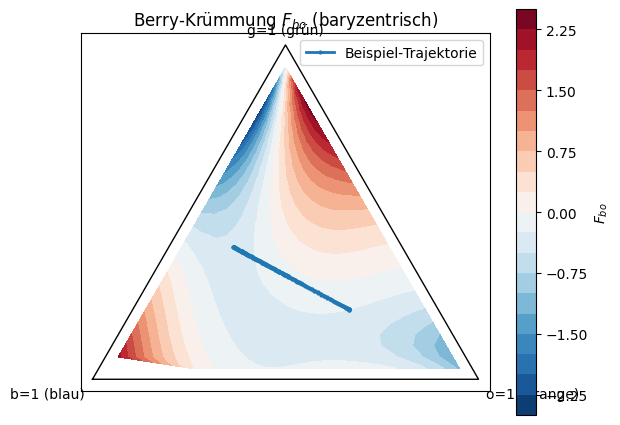


[Pipeline] Parameter:
  Potential: a=0.700, b=1.000, phi=0.120
  gamma_C=0.600, eta_F=0.900
  Logistic: beta0=0.000, betaC=3.200, beta_loop=0.000
  t=0.00  b=0.316, o=0.399, g=0.286 | F=-0.0796  dVdC=+0.0706  dC/dt=-0.1489  →  C=+0.2410
  t=0.06  b=0.317, o=0.396, g=0.287 | F=-0.0796  dVdC=+0.0627  dC/dt=-0.1357  →  C=+0.2328
  t=0.12  b=0.319, o=0.393, g=0.289 | F=-0.0797  dVdC=+0.0556  dC/dt=-0.1236  →  C=+0.2254
  t=0.18  b=0.321, o=0.389, g=0.290 | F=-0.0798  dVdC=+0.0492  dC/dt=-0.1126  →  C=+0.2186
  t=0.24  b=0.323, o=0.385, g=0.292 | F=-0.0802  dVdC=+0.0435  dC/dt=-0.1025  →  C=+0.2124
  t=0.30  b=0.326, o=0.380, g=0.295 | F=-0.0807  dVdC=+0.0383  dC/dt=-0.0931  →  C=+0.2068
  t=0.36  b=0.328, o=0.375, g=0.297 | F=-0.0816  dVdC=+0.0336  dC/dt=-0.0843  →  C=+0.2017
  t=0.42  b=0.331, o=0.370, g=0.299 | F=-0.0827  dVdC=+0.0294  dC/dt=-0.0760  →  C=+0.1971
  t=0.48  b=0.334, o=0.364, g=0.302 | F=-0.0850  dVdC=+0.0257  dC/dt=-0.0674  →  C=+0.1931
  t=0.54  b=0.337, o=0.358, g=0.30

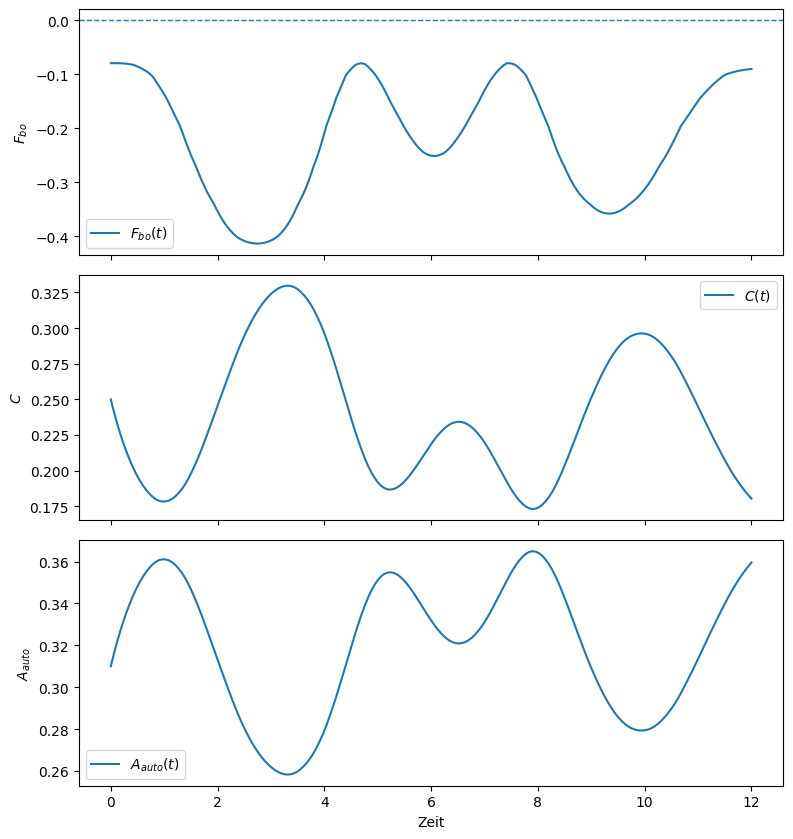

In [ ]:
# Nicht-interaktive Demo: erzeugt Heatmap + Pipeline-Plots + Konsolen-Logs
demo_heatmap_and_pipeline()


Trajektorie‑Editor aktiv. Klick ins Dreieck → Punkte setzen.
Tasten: Enter=auswerten, u=undo, c=clear, l=Loop toggle, q=quit.


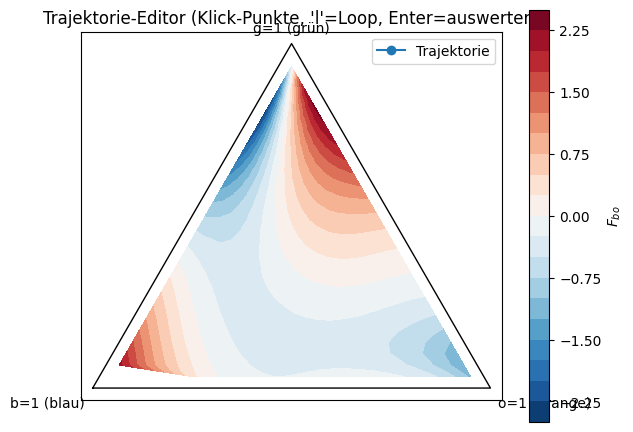


Hinweis: Dein Backend ist wahrscheinlich 'inline' (nicht interaktiv).
Fallback: Punkte als Liste übergeben und direkt auswerten, z.B.:
   example_points = [(0.55,0.30), (0.35,0.45), (0.20,0.30), (0.40,0.20)]
   b_path, o_path = sample_polyline(example_points, n=300, close_loop=False)
   _ = pipeline_F_to_C_to_A(b_grid, o_grid, Fbo, valid_mask, np.linspace(0,12,300), b_path, o_path)


In [ ]:
run_trajectory_editor()


In [ ]:
# ============================================================
# WIDGET-BASIERTER TRAJEKTORIE-EDITOR (ohne interaktives Backend)
# ============================================================
import ipywidgets as w
from IPython.display import display, clear_output
import pandas as pd

def run_trajectory_widget():
    """
    Widget-UI für:
      - Punkte im SD-Simplex per Slider hinzufügen
      - Loop (geschlossen) umschalten
      - Trajektorie resamplen und Pipeline F->C->A ausführen
      - Holonomie (falls Loop) berechnen
    Benötigt: plot_Fbo_on_simplex, sample_polyline, pipeline_F_to_C_to_A, holonomy_pancharatnam_verbose,
              berry_curvature_simplex, bary_xy, project_to_simplex, clamp_to_simplex,
              globale Größen (kappa, gamma, T) und ggf. bereits berechnetes Fbo/valid_mask.
    """
    # ---------- Sicherstellen, dass Fbo vorhanden ist ----------
    global b_grid, o_grid, Fbo, valid_mask
    try:
        Fbo; valid_mask
    except NameError:
        b_grid = np.linspace(0.0, 1.0, 31)
        o_grid = np.linspace(0.0, 1.0, 31)
        Fbo, valid_mask = berry_curvature_simplex(b_grid, o_grid)

    # ---------- Zustände ----------
    points = []        # Liste [(b,o), ...]
    close_loop = [False]  # mutables "by ref"
    n_samples_default = 300
    times_default = np.linspace(0, 12.0, n_samples_default)

    # ---------- Widgets ----------
    s_b = w.FloatSlider(description="b (blau)", min=0.0, max=1.0, step=0.01, value=0.40, readout_format=".2f")
    s_o = w.FloatSlider(description="o (orange)", min=0.0, max=1.0, step=0.01, value=0.30, readout_format=".2f")
    g_label = w.HTML(value="<b>g (grün):</b> 0.30")

    def _update_g_label(*args):
        b, o = s_b.value, s_o.value
        b, o = clamp_to_simplex(b, o)
        g = max(0.0, 1.0 - b - o)
        g_label.value = f"<b>g (grün):</b> {g:.2f}"
    s_b.observe(_update_g_label, "value")
    s_o.observe(_update_g_label, "value")
    _update_g_label()

    btn_add    = w.Button(description="Punkt hinzufügen", button_style="primary")
    btn_undo   = w.Button(description="Undo")
    btn_clear  = w.Button(description="Clear")
    tgl_loop   = w.ToggleButton(value=False, description="Loop schließen?", button_style="")
    n_samples  = w.IntSlider(description="Samples", min=50, max=1000, step=50, value=n_samples_default)
    C0_w       = w.FloatSlider(description="C0", min=0.0, max=1.0, step=0.01, value=0.25)
    gammaC_w   = w.FloatSlider(description="γ_C", min=0.0, max=2.0, step=0.05, value=0.6)
    etaF_w     = w.FloatSlider(description="η_F", min=0.0, max=2.0, step=0.05, value=0.9)
    a_w        = w.FloatSlider(description="a", min=0.0, max=2.0, step=0.05, value=0.7)
    b3_w       = w.FloatSlider(description="b (kubisch)", min=0.0, max=2.0, step=0.05, value=1.0)
    phi_w      = w.FloatSlider(description="φ", min=0.0, max=1.0, step=0.02, value=0.12)
    beta0_w    = w.FloatSlider(description="β0", min=-3.0, max=3.0, step=0.1, value=0.0)
    betaC_w    = w.FloatSlider(description="βC", min=0.0, max=6.0, step=0.1, value=3.2)
    eval_btn   = w.Button(description="Trajektorie auswerten (F→C→A)", button_style="success")
    hol_label  = w.HTML(value="")
    status     = w.HTML(value="<i>Bereit.</i>")

    # Tabellen-/Plot-Ausgaben
    out_points = w.Output()
    out_plot_simplex = w.Output()
    out_plots = w.Output()
    out_logs  = w.Output()

    # ---------- Hilfen ----------
    def _points_df():
        if not points:
            return pd.DataFrame(columns=["b","o","g"])
        arr = []
        for (b,o) in points:
            g = 1.0 - b - o
            arr.append((b,o,g))
        df = pd.DataFrame(arr, columns=["b","o","g"])
        return df

    def _redraw_simplex():
        with out_plot_simplex:
            clear_output(wait=True)
            fig, ax = plt.subplots(figsize=(6.8, 6.2))
            plot_Fbo_on_simplex(ax, b_grid, o_grid, Fbo, valid_mask,
                                title=r"SD‑Simplex mit $F_{bo}$‑Heatmap & Punkten")
            # Punkte/Polyline
            if points:
                xs, ys = zip(*[bary_xy(b, o) for (b,o) in points])
                ax.plot(xs, ys, "o-", label="Punkte")
                ax.legend(loc="upper right")
            plt.show()

    def _refresh_points_table():
        with out_points:
            clear_output(wait=True)
            display(_points_df())

    # ---------- Callbacks ----------
    def on_add_clicked(_):
        b, o = clamp_to_simplex(s_b.value, s_o.value)
        points.append((b, o))
        status.value = f"<i>Punkt hinzugefügt: b={b:.3f}, o={o:.3f}, g={1-b-o:.3f}</i>"
        _refresh_points_table()
        _redraw_simplex()

    def on_undo_clicked(_):
        if points:
            points.pop()
            status.value = "<i>Letzten Punkt entfernt.</i>"
        else:
            status.value = "<i>Keine Punkte vorhanden.</i>"
        _refresh_points_table()
        _redraw_simplex()

    def on_clear_clicked(_):
        points.clear()
        status.value = "<i>Punkte gelöscht.</i>"
        _refresh_points_table()
        _redraw_simplex()

    def on_loop_toggled(change):
        close_loop[0] = bool(change["new"])
        _redraw_simplex()
    tgl_loop.observe(on_loop_toggled, "value")

    def on_eval_clicked(_):
        if len(points) < 2:
            status.value = "<b>Mindestens zwei Punkte erforderlich.</b>"
            return

        # Zeitachse & Resampling
        T_local = times_default[-1]
        times_loc = np.linspace(0, T_local, int(n_samples.value))
        try:
            b_path, o_path = sample_polyline(points, n=len(times_loc), close_loop=close_loop[0])
        except Exception as e:
            status.value = f"<b>Trajektorie‑Fehler:</b> {e}"
            return

        # Pipeline laufen lassen (Logs sichtbar machen)
        with out_logs:
            clear_output(wait=True)
            print("[Pipeline] Start")
        with out_plots:
            clear_output(wait=True)

        # Parameter einsammeln
        pot_params = (a_w.value, b3_w.value, phi_w.value)
        beta_params = (beta0_w.value, betaC_w.value, 0.0)

        # Pipeline → F(t), C(t), A(t)
        with out_logs:
            F_t, C_t, A_t = pipeline_F_to_C_to_A(
                b_grid, o_grid, Fbo, valid_mask,
                times_loc, b_path, o_path,
                C0=C0_w.value, gamma_C=gammaC_w.value, eta_F=etaF_w.value,
                pot_params=pot_params, beta_params=beta_params, verbose_steps=10
            )

        # Holonomie, falls Loop
        phase_txt = ""
        if close_loop[0]:
            loop_pts = points + [points[0]]
            with out_logs:
                phase, _ = holonomy_pancharatnam_verbose(loop_pts, kappa_val=kappa, gamma_val=gamma, t_final=T)
            phase_txt = f" — Holonomie={phase:.3f} rad"

        # Zeitreihen plotten
        with out_plots:
            fig, axs = plt.subplots(3, 1, figsize=(8.6, 9.0), sharex=True)
            axs[0].plot(times_loc, F_t, label=r"$F_{bo}(t)$")
            axs[0].axhline(0, linestyle="--", linewidth=1, label="Nulllinie")
            axs[0].set_ylabel(r"$F_{bo}$"); axs[0].legend()
            axs[0].set_title("Trajektorie‑Auswertung" + phase_txt)

            axs[1].plot(times_loc, C_t, label=r"$C(t)$ (Kohäsion/Kohärenz)")
            axs[1].set_ylabel(r"$C$"); axs[1].legend()

            axs[2].plot(times_loc, A_t, label=r"$A_{auto}(t)$ (Output)")
            axs[2].set_xlabel("Zeit"); axs[2].set_ylabel(r"$A_{auto}$"); axs[2].legend()
            plt.tight_layout(); plt.show()

        status.value = "<b>Auswertung fertig.</b>"

    # Buttons verbinden
    btn_add.on_click(on_add_clicked)
    btn_undo.on_click(on_undo_clicked)
    btn_clear.on_click(on_clear_clicked)
    eval_btn.on_click(on_eval_clicked)

    # ---------- UI Layout ----------
    controls_row1 = w.HBox([s_b, s_o, g_label])
    controls_row2 = w.HBox([btn_add, btn_undo, btn_clear, tgl_loop])
    controls_row3 = w.HBox([n_samples, C0_w, gammaC_w, etaF_w])
    controls_row4 = w.HBox([a_w, b3_w, phi_w, beta0_w, betaC_w])
    header = w.HTML("<h3>Spiral Dynamics – Trajektorie‑Widget</h3>")

    # Initiale Anzeigen
    _refresh_points_table()
    _redraw_simplex()

    display(w.VBox([
        header,
        controls_row1,
        controls_row2,
        controls_row3,
        controls_row4,
        status,
        w.HTML("<b>Punkteliste:</b>"),
        out_points,
        w.HTML("<b>SD‑Simplex:</b>"),
        out_plot_simplex,
        eval_btn,
        w.HTML("<b>Pipeline‑Logs:</b>"),
        out_logs,
        w.HTML("<b>Ergebnis‑Plots:</b>"),
        out_plots
    ]))



In [ ]:
run_trajectory_widget()

**AB HIER A0 Komponenten mit Feldtesnsor integriert**

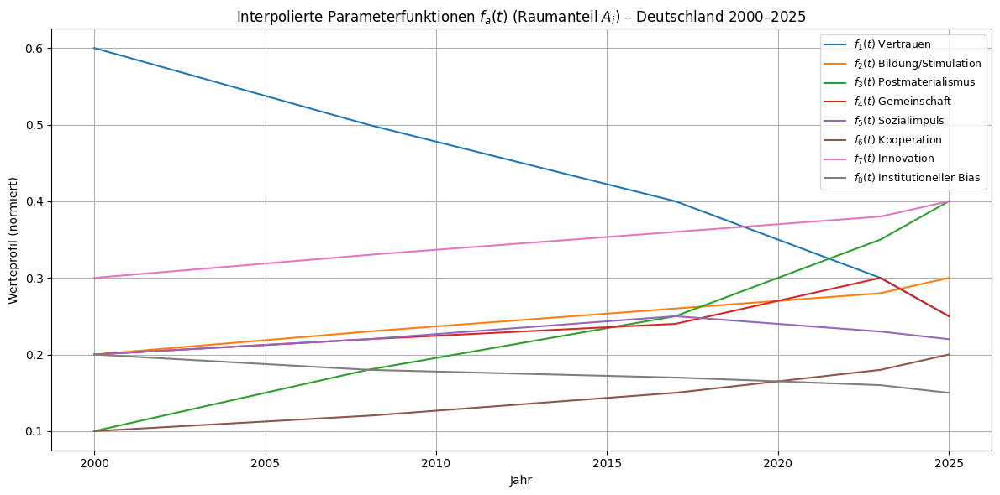

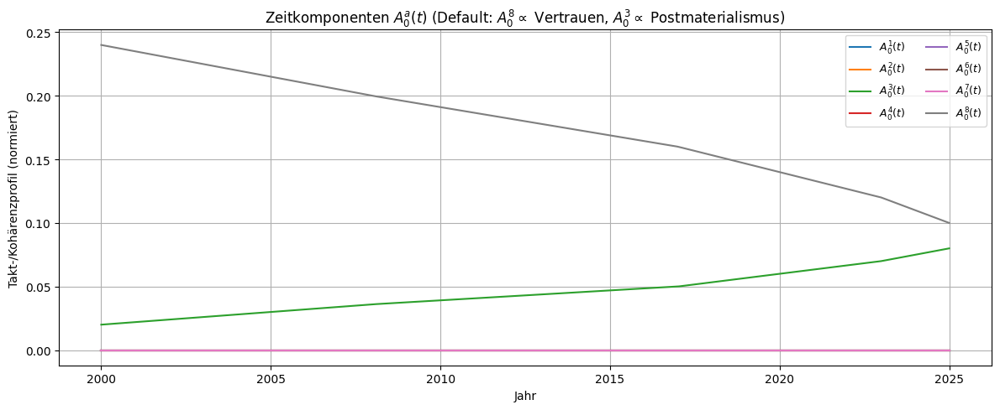

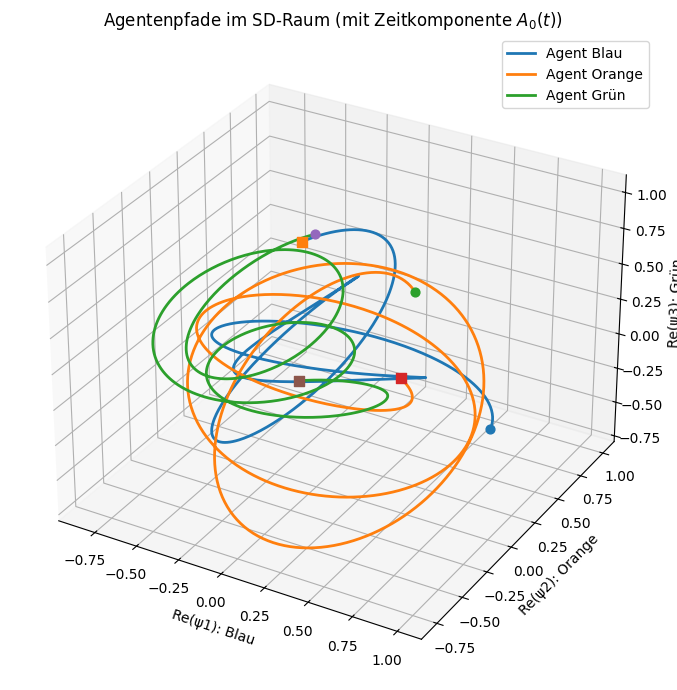

Pancharatnam-Phasen (rad):  A=-1.9713, B=-1.4468, C=-2.9265
Pancharatnam-Phasen (deg):  A=-112.95, B=-82.90, C=-167.68
Open-path Berry-Summen (rad):  A=-1.1468, B=2.1557, C=-1.0080
Open-path Berry-Summen (deg):  A=-65.71, B=123.51, C=-57.75


In [ ]:
# Schritt 1: Dein Skript mit **A0-Komponenten** integriert.
# - Fügt acht Zeitfunktionen a0_1..a0_8(t) hinzu (Zeitkomponente A0).
# - Hamilton-Dynamik wird von i dψ/dt = H(t) ψ  ->  i dψ/dt = (H(t) - g0*A0(t)) ψ
#   (kovarianter Zeitableiter D0 = ∂t + i g0 A0  =>  i∂tψ = ( ... ) ψ).
# - Plots: f_a(t) (wie gehabt) + neue A0_a(t).
# - Alles sonst unverändert, so dass wir im **Schritt 2** (Kohärenz/Kohäsion, Feldstärken)
#   nahtlos erweitern können.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp

# =====================================
# 0) Parameterfunktionen f1..f8 (vom Nutzer vorgegeben)
# =====================================
years = np.array([2000, 2008, 2017, 2023, 2025], dtype=float)

f1_vals = np.array([0.6, 0.5, 0.4, 0.3, 0.25], dtype=float)   # Vertrauen
f2_vals = np.array([0.2, 0.23, 0.26, 0.28, 0.3 ], dtype=float)  # Bildung/Stimulation
f3_vals = np.array([0.1, 0.18, 0.25, 0.35, 0.4 ], dtype=float)  # Postmaterialismus
f4_vals = np.array([0.2, 0.22, 0.24, 0.30, 0.25], dtype=float) # Gemeinschaft/Covid peak
f5_vals = np.array([0.2, 0.22, 0.25, 0.23, 0.22], dtype=float) # Sozialimpuls
f6_vals = np.array([0.1, 0.12, 0.15, 0.18, 0.2 ], dtype=float)  # Kooperation
f7_vals = np.array([0.3, 0.33, 0.36, 0.38, 0.4 ], dtype=float)  # Innovation
f8_vals = np.array([0.2, 0.18, 0.17, 0.16, 0.15], dtype=float) # institutioneller Bias

# Interpolationsfunktionen (linear, mit Extrapolation)
f1 = interp1d(years, f1_vals, kind='linear', fill_value='extrapolate')
f2 = interp1d(years, f2_vals, kind='linear', fill_value='extrapolate')
f3 = interp1d(years, f3_vals, kind='linear', fill_value='extrapolate')
f4 = interp1d(years, f4_vals, kind='linear', fill_value='extrapolate')
f5 = interp1d(years, f5_vals, kind='linear', fill_value='extrapolate')
f6 = interp1d(years, f6_vals, kind='linear', fill_value='extrapolate')
f7 = interp1d(years, f7_vals, kind='linear', fill_value='extrapolate')
f8 = interp1d(years, f8_vals, kind='linear', fill_value='extrapolate')

def f_components(t: float) -> np.ndarray:
    return np.array([
        float(f1(t)), float(f2(t)), float(f3(t)), float(f4(t)),
        float(f5(t)), float(f6(t)), float(f7(t)), float(f8(t))
    ], dtype=float)

# =====================================
# 0b) NEU: Zeitkomponenten A0 – acht a0_a(t)
# Hinweis: Plausible Defaults, editierbar. Wir starten bewusst "schmal":
# - a0_8: globaler Zeit-/Vertrauens-Takt (aus f1 skaliert)
# - a0_3: Ordnung/Markt-Takt (aus f3 leicht skaliert)
# - restliche a0_a zunächst 0 (kannst du später füllen oder datenbasiert setzen)
# =====================================
scale_8 = 0.4   # Skalen (anpassbar)
scale_3 = 0.2

a0_1 = interp1d(years, np.zeros_like(years), kind='linear', fill_value='extrapolate')
a0_2 = interp1d(years, np.zeros_like(years), kind='linear', fill_value='extrapolate')
a0_3 = interp1d(years, scale_3 * f3_vals,         kind='linear', fill_value='extrapolate')
a0_4 = interp1d(years, np.zeros_like(years), kind='linear', fill_value='extrapolate')
a0_5 = interp1d(years, np.zeros_like(years), kind='linear', fill_value='extrapolate')
a0_6 = interp1d(years, np.zeros_like(years), kind='linear', fill_value='extrapolate')
a0_7 = interp1d(years, np.zeros_like(years), kind='linear', fill_value='extrapolate')
a0_8 = interp1d(years, scale_8 * f1_vals,         kind='linear', fill_value='extrapolate')

def a0_components(t: float) -> np.ndarray:
    return np.array([
        float(a0_1(t)), float(a0_2(t)), float(a0_3(t)), float(a0_4(t)),
        float(a0_5(t)), float(a0_6(t)), float(a0_7(t)), float(a0_8(t))
    ], dtype=float)

# =====================================
# 1) Plot der Parameterfunktionen (A_i) und NEU: A0_a
# =====================================
t_plot = np.linspace(2000, 2025, 500)
fa_stack = np.array([f_components(t) for t in t_plot])
a0_stack = np.array([a0_components(t) for t in t_plot])

plt.figure(figsize=(12, 6))
labels_f = [
    r"$f_1(t)$ Vertrauen",
    r"$f_2(t)$ Bildung/Stimulation",
    r"$f_3(t)$ Postmaterialismus",
    r"$f_4(t)$ Gemeinschaft",
    r"$f_5(t)$ Sozialimpuls",
    r"$f_6(t)$ Kooperation",
    r"$f_7(t)$ Innovation",
    r"$f_8(t)$ Institutioneller Bias",
]
for i in range(8):
    plt.plot(t_plot, fa_stack[:, i], label=labels_f[i])
plt.title(r"Interpolierte Parameterfunktionen $f_a(t)$ (Raumanteil $A_i$) – Deutschland 2000–2025")
plt.xlabel("Jahr"); plt.ylabel("Werteprofil (normiert)")
plt.grid(True); plt.legend(loc="upper right", fontsize=9); plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 5))
labels_a0 = [fr"$A_0^{a+1}(t)$" for a in range(8)]
for i in range(8):
    plt.plot(t_plot, a0_stack[:, i], label=labels_a0[i])
plt.title(r"Zeitkomponenten $A_0^a(t)$ (Default: $A_0^8\propto$ Vertrauen, $A_0^3\propto$ Postmaterialismus)")
plt.xlabel("Jahr"); plt.ylabel("Takt-/Kohärenzprofil (normiert)")
plt.grid(True); plt.legend(loc="upper right", ncol=2, fontsize=9); plt.tight_layout()
plt.show()

# =====================================
# 2) SU(3)-Generatoren (Gell-Mann-Matrizen)
# =====================================
λ1 = np.array([[0,1,0],[1,0,0],[0,0,0]], complex)
λ2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], complex)
λ3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], complex)
λ4 = np.array([[0,0,1],[0,0,0],[1,0,0]], complex)
λ5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], complex)
λ6 = np.array([[0,0,0],[0,0,1],[0,1,0]], complex)
λ7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], complex)
λ8 = (1/np.sqrt(3)) * np.diag([1,1,-2])
generators = [λ1,λ2,λ3,λ4,λ5,λ6,λ7,λ8]

def A_from_components(components: np.ndarray) -> np.ndarray:
    A = np.zeros((3,3), dtype=complex)
    for a in range(8):
        A = A + components[a] * generators[a]
    return A

# =====================================
# 3) Hamiltonian H(t) = g * A_i(t);  NEU: A0(t) = Sum a0_a(t) λ_a
#    Kovarianter Zeitableiter: i∂t ψ = ( H(t) - g0*A0(t) ) ψ
# =====================================
g  = 1.0     # Kopplung für Raumanteil (wie gehabt)
g0 = 1.0     # Kopplung für Zeitkomponente (anpassbar)

def A_of_t(t: float) -> np.ndarray:
    return A_from_components(f_components(t))

def A0_of_t(t: float) -> np.ndarray:
    return A_from_components(a0_components(t))

def H_of_t(t: float) -> np.ndarray:
    return g * A_of_t(t)

# =====================================
# 4) Schrödingerdynamik: dψ/dt = -i [ H(t) - g0*A0(t) ] ψ
# =====================================
def schrodinger_rhs_with_A0(t, psi_flat):
    psi = psi_flat[:3] + 1j*psi_flat[3:]
    H = H_of_t(t) - g0 * A0_of_t(t)
    dpsi = -1j * H @ psi
    return np.concatenate([dpsi.real, dpsi.imag])

# Zeitachse (auf 2000–2025 angepasst)
t0, t1 = 2000.0, 2025.0
t_eval = np.linspace(t0, t1, 800)

# Startzustände (Basisvektoren)
psiA0 = np.array([1,0,0], complex)  # Blau
psiB0 = np.array([0,1,0], complex)  # Orange
psiC0 = np.array([0,0,1], complex)  # Grün

def evolve_with_A0(psi0: np.ndarray):
    y0 = np.concatenate([psi0.real, psi0.imag])
    sol = solve_ivp(
        schrodinger_rhs_with_A0, [t0, t1], y0, t_eval=t_eval,
        rtol=1e-8, atol=1e-10, method='DOP853'
    )
    psi_t = sol.y[:3, :] + 1j*sol.y[3:, :]
    norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    psi_t = psi_t / norms
    return sol.t, psi_t.T

tA, pathA = evolve_with_A0(psiA0)
tB, pathB = evolve_with_A0(psiB0)
tC, pathC = evolve_with_A0(psiC0)

# =====================================
# 5) Phasen (Pancharatnam & Open-path Berry-artig) – unverändert
# =====================================
def pancharatnam_phase(psi_path: np.ndarray) -> float:
    z = np.vdot(psi_path[0], psi_path[-1])
    return float(np.angle(z))

def berry_like_open_phase(psi_path: np.ndarray) -> float:
    ph = 0.0
    for k in range(len(psi_path)-1):
        z = np.vdot(psi_path[k], psi_path[k+1])
        if abs(z) > 1e-12:
            ph += float(np.angle(z))
    return ph

pan_A = pancharatnam_phase(pathA); berr_A = berry_like_open_phase(pathA)
pan_B = pancharatnam_phase(pathB); berr_B = berry_like_open_phase(pathB)
pan_C = pancharatnam_phase(pathC); berr_C = berry_like_open_phase(pathC)

# =====================================
# 6) Visualisierung der Agentenpfade (3D, Realteile) – unverändert
# =====================================
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')

for path, lab in [(pathA, 'Agent Blau'), (pathB, 'Agent Orange'), (pathC, 'Agent Grün')]:
    X, Y, Z = path.real.T
    ax.plot(X, Y, Z, lw=2, label=lab)
    ax.scatter(X[0], Y[0], Z[0], s=40, marker='o')
    ax.scatter(X[-1], Y[-1], Z[-1], s=60, marker='s')

ax.set_xlabel('Re(ψ1): Blau'); ax.set_ylabel('Re(ψ2): Orange'); ax.set_zlabel('Re(ψ3): Grün')
ax.set_title('Agentenpfade im SD-Raum (mit Zeitkomponente $A_0(t)$)')
ax.legend(); plt.tight_layout(); plt.show()

# =====================================
# 7) Phasen-Output & Kontrolle
# =====================================
print("Pancharatnam-Phasen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(pan_A, pan_B, pan_C))
print("Pancharatnam-Phasen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([pan_A, pan_B, pan_C])
))
print("Open-path Berry-Summen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(berr_A, berr_B, berr_C))
print("Open-path Berry-Summen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([berr_A, berr_B, berr_C])
))

# =====================================
# 8) (Optional) Export Schnittstellen-Daten – damit Schritt 2 nahtlos aufsetzt
#    Wir geben A(t), A0(t) an Stützstellen aus.
# =====================================
#t_dense = np.linspace(2000, 2025, 60)
#fa_dense = np.array([f_components(t) for t in t_dense])
#a0_dense = np.array([a0_components(t) for t in t_dense])
#df_params = pd.DataFrame(np.column_stack([t_dense, fa_dense, a0_dense]),
#                         columns=(["Jahr"] + [f"f{a+1}" for a in range(8)] + [f"A0_{a+1}" for a in range(8)]))
#csv_path = "/mnt/data/SD_A_with_A0_step1.csv"
#df_params.to_csv(csv_path, index=False)
#csv_path


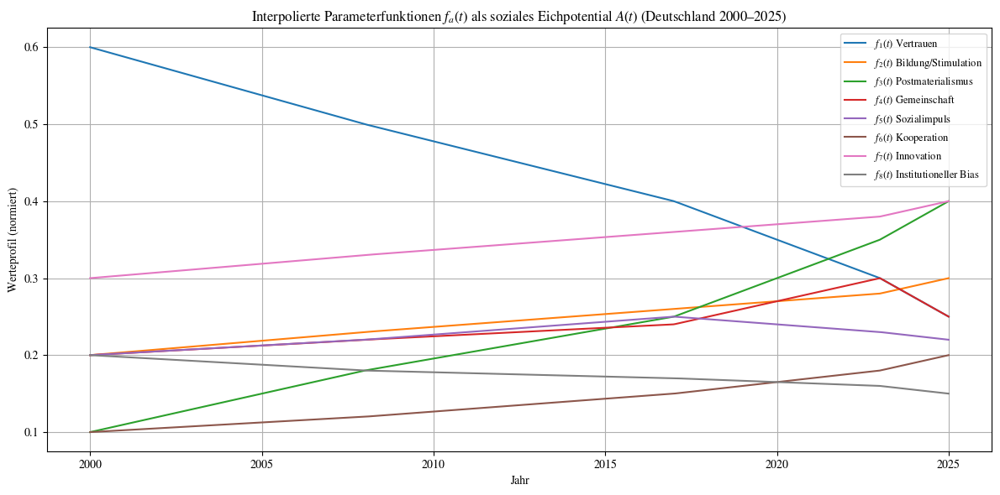

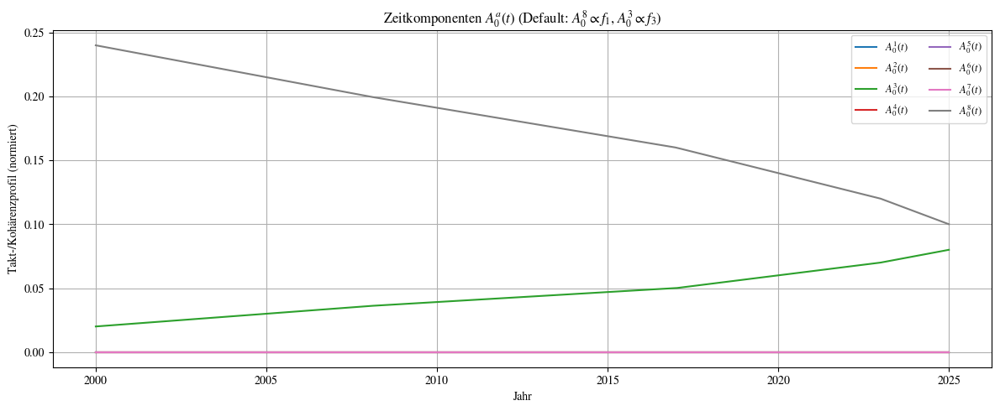

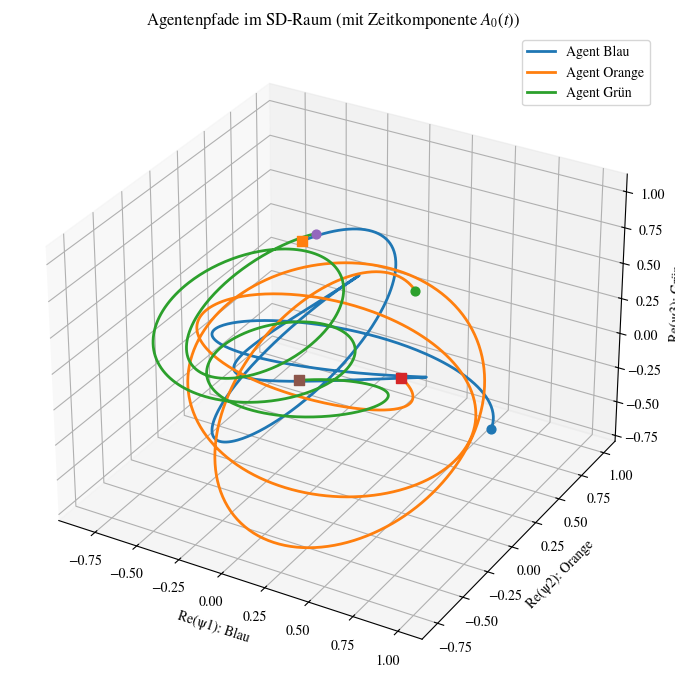

Pancharatnam-Phasen (rad):  A=-1.9713, B=-1.4468, C=-2.9265
Pancharatnam-Phasen (deg):  A=-112.95, B=-82.90, C=-167.68
Open-path Berry-Summen (rad):  A=-1.1468, B=2.1557, C=-1.0080
Open-path Berry-Summen (deg):  A=-65.71, B=123.51, C=-57.75


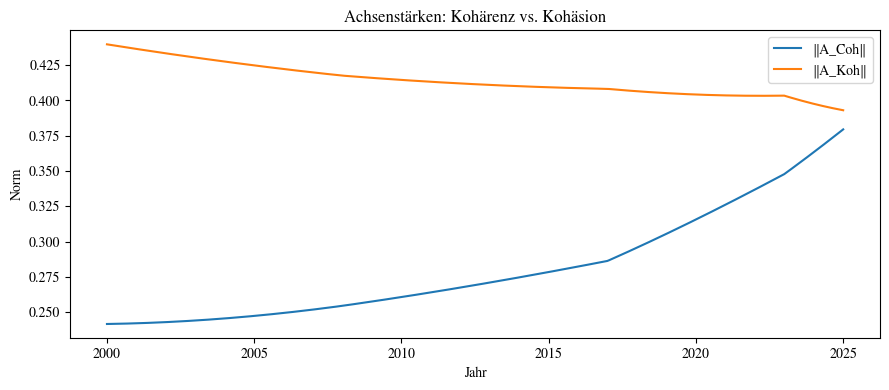

/tmp/ipython-input-4195295562.py:301: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.legend(); plt.tight_layout(); plt.show()
/tmp/ipython-input-4195295562.py:301: UserWarning: Glyph 550 (\N{LATIN CAPITAL LETTER A WITH DOT ABOVE}) missing from font(s) STIXGeneral.
  plt.legend(); plt.tight_layout(); plt.show()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 550 (\N{LATIN CAPITAL LETTER A WITH DOT ABOVE}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


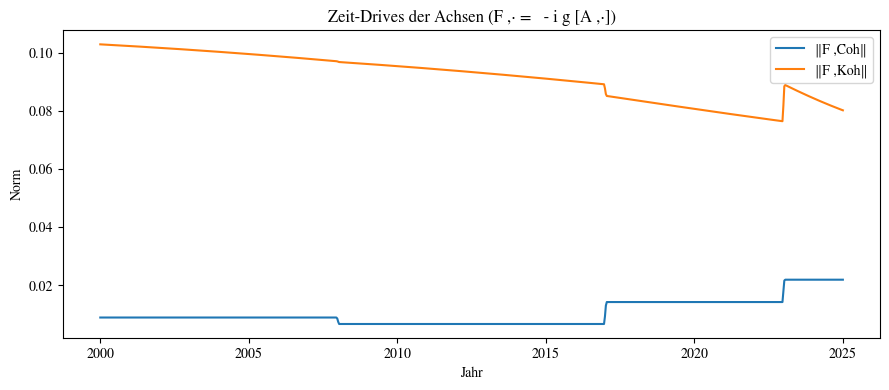

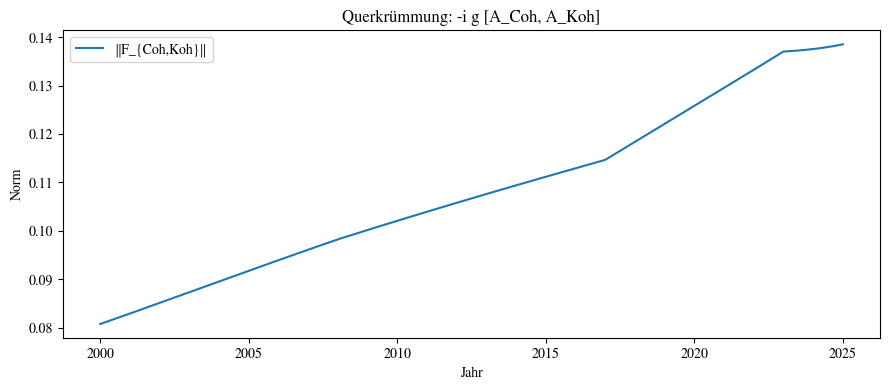

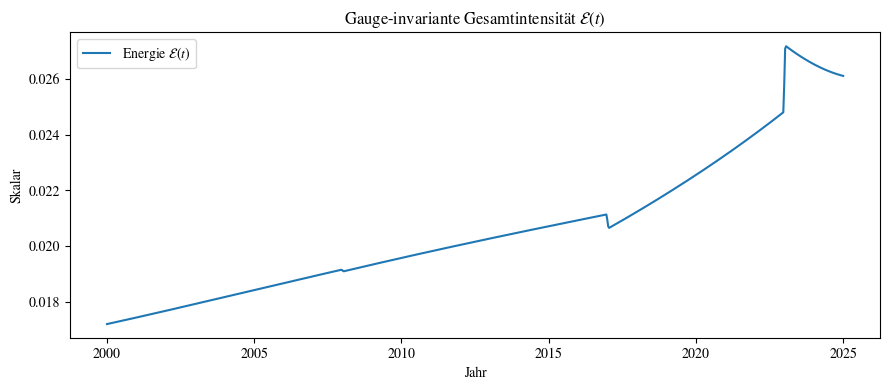

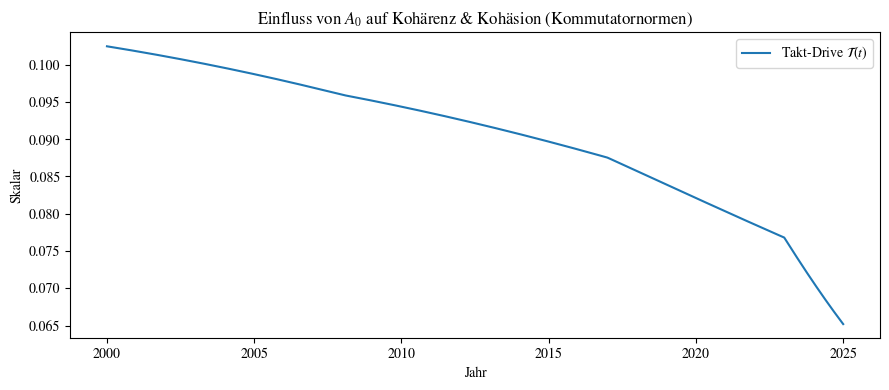

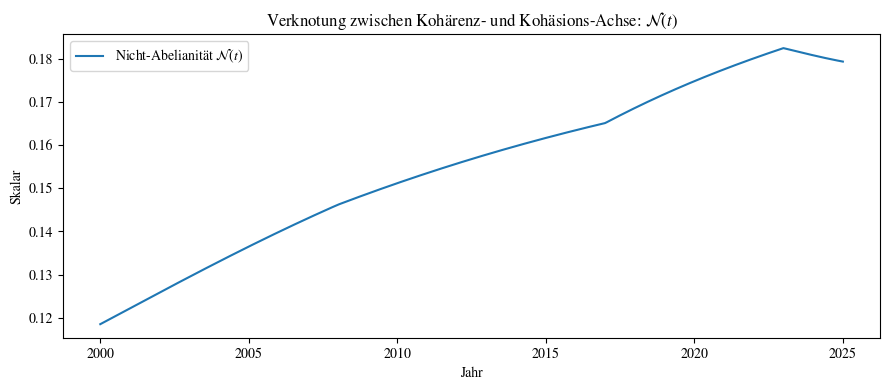

In [ ]:
# -*- coding: utf-8 -*-
# SD-Schroedinger + Feldtensoren (0+1D, homogen)
# - Externe Parameterfunktionen f1..f8 -> A(t) = Sum f_a(t) * λ_a
# - Zeitkomponenten A0^a(t) -> A0(t) = Sum a0_a(t) * λ_a
# - Kohärenz- & Kohäsions-Achsen als Projektionen im SU(3)-Farbraum
# - Feldstärken: F_{0,Coh}, F_{0,Koh}, F_{Coh,Koh}
# - Visualisierungen: f_a(t), A0^a(t), Agentenpfade, Achsenstärken, Zeit-Drives, Querkrümmung, KPIs

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp

import matplotlib as mpl
mpl.rcParams['mathtext.fontset'] = 'stix'   # gute Mathe-Schriften
mpl.rcParams['font.family'] = 'STIXGeneral' # optional, einheitlicher Look


# =====================================
# 0) Parameterfunktionen f1..f8 (vom Nutzer vorgegeben)
# =====================================
years = np.array([2000, 2008, 2017, 2023, 2025], dtype=float)

f1_vals = np.array([0.6, 0.5, 0.4, 0.3, 0.25], dtype=float)   # Vertrauen
f2_vals = np.array([0.2, 0.23, 0.26, 0.28, 0.3 ], dtype=float)  # Bildung/Stimulation
f3_vals = np.array([0.1, 0.18, 0.25, 0.35, 0.4 ], dtype=float)  # Postmaterialismus (hier: Ordnung/Markt-Achse)
f4_vals = np.array([0.2, 0.22, 0.24, 0.30, 0.25], dtype=float)  # Gemeinschaft (z. B. Covid-Peak)
f5_vals = np.array([0.2, 0.22, 0.25, 0.23, 0.22], dtype=float)  # Sozialimpuls
f6_vals = np.array([0.1, 0.12, 0.15, 0.18, 0.2 ], dtype=float)  # Kooperation
f7_vals = np.array([0.3, 0.33, 0.36, 0.38, 0.4 ], dtype=float)  # Innovation
f8_vals = np.array([0.2, 0.18, 0.17, 0.16, 0.15], dtype=float)  # institutioneller Bias

# Interpolationsfunktionen (linear, mit Extrapolation)
f1 = interp1d(years, f1_vals, kind='linear', fill_value='extrapolate')
f2 = interp1d(years, f2_vals, kind='linear', fill_value='extrapolate')
f3 = interp1d(years, f3_vals, kind='linear', fill_value='extrapolate')
f4 = interp1d(years, f4_vals, kind='linear', fill_value='extrapolate')
f5 = interp1d(years, f5_vals, kind='linear', fill_value='extrapolate')
f6 = interp1d(years, f6_vals, kind='linear', fill_value='extrapolate')
f7 = interp1d(years, f7_vals, kind='linear', fill_value='extrapolate')
f8 = interp1d(years, f8_vals, kind='linear', fill_value='extrapolate')

def f_components(t: float) -> np.ndarray:
    """Rückgabe der 8 Komponenten f_a(t) als numpy-Array."""
    return np.array([
        float(f1(t)), float(f2(t)), float(f3(t)), float(f4(t)),
        float(f5(t)), float(f6(t)), float(f7(t)), float(f8(t))
    ], dtype=float)

# =====================================
# 0b) Zeitkomponenten A0 – acht a0_a(t) (Defaults: justierbar)
#    - A0^8: globaler Zeit-/Vertrauenstakt (aus f1 skaliert)
#    - A0^3: Ordnung/Markt-Zeitmodus (aus f3 skaliert)
#    - rest: 0 (später datenbasiert befüllbar)
# =====================================
scale_8 = 0.4
scale_3 = 0.2

zeros = np.zeros_like(years)
a0_1 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_2 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_3 = interp1d(years, scale_3 * f3_vals, kind='linear', fill_value='extrapolate')
a0_4 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_5 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_6 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_7 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_8 = interp1d(years, scale_8 * f1_vals, kind='linear', fill_value='extrapolate')

def a0_components(t: float) -> np.ndarray:
    return np.array([
        float(a0_1(t)), float(a0_2(t)), float(a0_3(t)), float(a0_4(t)),
        float(a0_5(t)), float(a0_6(t)), float(a0_7(t)), float(a0_8(t))
    ], dtype=float)

# =====================================
# 1) Plots: f_a(t) und A0_a(t)
# =====================================
t_plot = np.linspace(2000, 2025, 500)
fa_stack  = np.array([f_components(tt)  for tt in t_plot])
a0_stack  = np.array([a0_components(tt) for tt in t_plot])

plt.figure(figsize=(12, 6))
labels_f = [
    r"$f_1(t)$ Vertrauen", r"$f_2(t)$ Bildung/Stimulation",
    r"$f_3(t)$ Postmaterialismus", r"$f_4(t)$ Gemeinschaft",
    r"$f_5(t)$ Sozialimpuls", r"$f_6(t)$ Kooperation",
    r"$f_7(t)$ Innovation", r"$f_8(t)$ Institutioneller Bias"
]
for i in range(8):
    plt.plot(t_plot, fa_stack[:, i], label=labels_f[i])
plt.title(r"Interpolierte Parameterfunktionen $f_a(t)$ als soziales Eichpotential $A(t)$ (Deutschland 2000–2025)")
plt.xlabel("Jahr"); plt.ylabel("Werteprofil (normiert)")
plt.grid(True); plt.legend(loc="upper right", fontsize=9); plt.tight_layout(); plt.show()

plt.figure(figsize=(12, 5))
labels_a0 = [fr"$A_0^{a+1}(t)$" for a in range(8)]
for i in range(8):
    plt.plot(t_plot, a0_stack[:, i], label=labels_a0[i])
plt.title(r"Zeitkomponenten $A_0^a(t)$ (Default: $A_0^8\propto f_1$, $A_0^3\propto f_3$)")
plt.xlabel("Jahr"); plt.ylabel("Takt-/Kohärenzprofil (normiert)")
plt.grid(True); plt.legend(loc="upper right", ncol=2, fontsize=9); plt.tight_layout(); plt.show()

# =====================================
# 2) SU(3)-Generatoren (Gell-Mann-Matrizen)
#    (hier als λ_a, wie in deinem Originalcode; keine 1/2-Faktoren)
# =====================================
λ1 = np.array([[0,1,0],[1,0,0],[0,0,0]], complex)
λ2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], complex)
λ3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], complex)
λ4 = np.array([[0,0,1],[0,0,0],[1,0,0]], complex)
λ5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], complex)
λ6 = np.array([[0,0,0],[0,0,1],[0,1,0]], complex)
λ7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], complex)
λ8 = (1/np.sqrt(3)) * np.diag([1,1,-2])
generators = [λ1,λ2,λ3,λ4,λ5,λ6,λ7,λ8]

def A_from_components(components: np.ndarray) -> np.ndarray:
    A = np.zeros((3,3), dtype=complex)
    for a in range(8):
        A = A + components[a] * generators[a]
    return A

# =====================================
# 3) Hamiltonian H(t) = g * A(t); A0(t) separat
#    Kovarianter Zeitableiter: i d/dt ψ = [ H(t) - g0 A0(t) ] ψ
# =====================================
g  = 1.0
g0 = 1.0

def A_of_t(t: float)  -> np.ndarray: return A_from_components(f_components(t))
def A0_of_t(t: float) -> np.ndarray: return A_from_components(a0_components(t))
def H_of_t(t: float)  -> np.ndarray: return g * A_of_t(t)

# =====================================
# 4) Schrödingerdynamik
# =====================================
def schrodinger_rhs_with_A0(t, psi_flat):
    psi = psi_flat[:3] + 1j*psi_flat[3:]
    H = H_of_t(t) - g0 * A0_of_t(t)
    dpsi = -1j * H @ psi
    return np.concatenate([dpsi.real, dpsi.imag])

# Zeitachse
t0, t1 = 2000.0, 2025.0
t_eval = np.linspace(t0, t1, 800)

# Startzustände
psiA0 = np.array([1,0,0], complex)  # Blau
psiB0 = np.array([0,1,0], complex)  # Orange
psiC0 = np.array([0,0,1], complex)  # Grün

def evolve_with_A0(psi0: np.ndarray):
    y0 = np.concatenate([psi0.real, psi0.imag])
    sol = solve_ivp(
        schrodinger_rhs_with_A0, [t0, t1], y0, t_eval=t_eval,
        rtol=1e-8, atol=1e-10, method='DOP853'
    )
    psi_t = sol.y[:3, :] + 1j*sol.y[3:, :]
    norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    psi_t = psi_t / norms
    return sol.t, psi_t.T

tA, pathA = evolve_with_A0(psiA0)
tB, pathB = evolve_with_A0(psiB0)
tC, pathC = evolve_with_A0(psiC0)

# =====================================
# 5) Phasen (Pancharatnam & Open-path Berry-artig)
# =====================================
def pancharatnam_phase(psi_path: np.ndarray) -> float:
    z = np.vdot(psi_path[0], psi_path[-1])
    return float(np.angle(z))

def berry_like_open_phase(psi_path: np.ndarray) -> float:
    ph = 0.0
    for k in range(len(psi_path)-1):
        z = np.vdot(psi_path[k], psi_path[k+1])
        if abs(z) > 1e-12:
            ph += float(np.angle(z))
    return ph

pan_A = pancharatnam_phase(pathA); berr_A = berry_like_open_phase(pathA)
pan_B = pancharatnam_phase(pathB); berr_B = berry_like_open_phase(pathB)
pan_C = pancharatnam_phase(pathC); berr_C = berry_like_open_phase(pathC)

# =====================================
# 6) Visualisierung der Agentenpfade (3D, Realteile)
# =====================================
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')

for path, lab in [(pathA, 'Agent Blau'), (pathB, 'Agent Orange'), (pathC, 'Agent Grün')]:
    X, Y, Z = path.real.T
    ax.plot(X, Y, Z, lw=2, label=lab)
    ax.scatter(X[0], Y[0], Z[0], s=40, marker='o')
    ax.scatter(X[-1], Y[-1], Z[-1], s=60, marker='s')

ax.set_xlabel('Re(ψ1): Blau'); ax.set_ylabel('Re(ψ2): Orange'); ax.set_zlabel('Re(ψ3): Grün')
ax.set_title('Agentenpfade im SD-Raum (mit Zeitkomponente $A_0(t)$)')
ax.legend(); plt.tight_layout(); plt.show()

print("Pancharatnam-Phasen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(pan_A, pan_B, pan_C))
print("Pancharatnam-Phasen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([pan_A, pan_B, pan_C])
))
print("Open-path Berry-Summen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(berr_A, berr_B, berr_C))
print("Open-path Berry-Summen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([berr_A, berr_B, berr_C])
))

# =====================================
# 7) Kohärenz & Kohäsion: Projektionen + Feldtensoren
# =====================================

# Hilfsfunktionen
def comm(A, B):  # Matrixkommutator
    return A @ B - B @ A

def frob_norm(M):
    return np.sqrt(np.real(np.trace(M.conj().T @ M)))

# Projektor-Gewichte (heuristisch; einfach anpassbar)
# Kohärenz: Cartan-getrieben (λ3, λ8) -> legt Takt/Zeitkohärenz fest
u_coh = np.array([0,0,0.6,0,0,0,0,0.8], dtype=float)
u_coh = u_coh / np.linalg.norm(u_coh)

# Kohäsion: Bindungs-Paare (λ1,2,4,5,6,7) -> Werte-Zusammenhalt
v_koh = np.array([1,1,0,1,1,1,1,0], dtype=float)
v_koh = v_koh / np.linalg.norm(v_koh)

# Zeitgitter für Feldtensor-Berechnung = t_eval
def A_axis_from_weights(weights, tgrid):
    """A_axis(t) = Sum_a weights[a] * f_a(t) * λ_a  (Liste von 3x3-Matrizen)"""
    mats = []
    for tt in tgrid:
        comps = weights * f_components(tt)  # gewichtete Komponenten
        mats.append(A_from_components(comps))
    return np.array(mats)  # shape (T,3,3)

A_coh = A_axis_from_weights(u_coh, t_eval)
A_koh = A_axis_from_weights(v_koh, t_eval)
A0_seq = np.array([A0_of_t(tt) for tt in t_eval])

# Zeitableitungen (zentrale Differenzen)
dt = t_eval[1] - t_eval[0]
def time_derivative(A_seq):
    dA = np.zeros_like(A_seq, dtype=complex)
    dA[1:-1] = (A_seq[2:] - A_seq[:-2])/(2*dt)
    dA[0]    = (A_seq[1]  - A_seq[0]) / dt
    dA[-1]   = (A_seq[-1] - A_seq[-2]) / dt
    return dA

dA_coh = time_derivative(A_coh)
dA_koh = time_derivative(A_koh)

gYM = 1.0  # Kopplung für Feldtensoren (ggf. separat justieren)

# Feldstärken (0+1D, homogen)
F0_coh     = dA_coh - 1j*gYM*np.array([comm(A0_seq[i], A_coh[i]) for i in range(len(t_eval))])
F0_koh     = dA_koh - 1j*gYM*np.array([comm(A0_seq[i], A_koh[i]) for i in range(len(t_eval))])
F_coh_koh  = -1j*gYM*np.array([comm(A_coh[i], A_koh[i]) for i in range(len(t_eval))])

# Normen / KPIs
norm_A_coh     = np.array([frob_norm(A_coh[i])     for i in range(len(t_eval))])
norm_A_koh     = np.array([frob_norm(A_koh[i])     for i in range(len(t_eval))])
norm_F0_coh    = np.array([frob_norm(F0_coh[i])    for i in range(len(t_eval))])
norm_F0_koh    = np.array([frob_norm(F0_koh[i])    for i in range(len(t_eval))])
norm_F_ck      = np.array([frob_norm(F_coh_koh[i]) for i in range(len(t_eval))])

# Energie (eichinvariant in diesem 0+1D-Setup)
E_t = norm_F0_coh**2 + norm_F0_koh**2 + norm_F_ck**2

# Takt-Drive = Einfluss von A0 auf die Achsen (reine Kommutatornorm)
T_drive = np.array([frob_norm(comm(A0_seq[i], A_coh[i])) + frob_norm(comm(A0_seq[i], A_koh[i]))
                    for i in range(len(t_eval))])

# Nicht-Abelianitäts-Index: Verknotung zwischen Achsen
eps = 1e-12
N_index = norm_F_ck / (norm_A_coh + norm_A_koh + eps)

# =====================================
# 8) Visualisierungen der Feldtensor-Diagnostik
# =====================================

# Achsenstärken
plt.figure(figsize=(9,4))
plt.plot(t_eval, norm_A_coh, label="‖A_Coh‖")
plt.plot(t_eval, norm_A_koh, label="‖A_Koh‖")
plt.xlabel("Jahr"); plt.ylabel("Norm")
plt.title("Achsenstärken: Kohärenz vs. Kohäsion")
plt.legend(); plt.tight_layout(); plt.show()

# Zeit-Drives (inkl. -i g [A0, ⋅])
plt.figure(figsize=(9,4))
plt.plot(t_eval, norm_F0_coh, label="‖F₀,Coh‖")
plt.plot(t_eval, norm_F0_koh, label="‖F₀,Koh‖")
plt.xlabel("Jahr"); plt.ylabel("Norm")
plt.title("Zeit-Drives der Achsen (F₀,⋅ = Ȧ - i g [A₀,⋅])")
plt.legend(); plt.tight_layout(); plt.show()

# Querkrümmung (Stress zwischen Takt & Zusammenhalt)
plt.figure(figsize=(9,4))
plt.plot(t_eval, norm_F_ck, label="‖F_{Coh,Koh}‖")
plt.xlabel("Jahr"); plt.ylabel("Norm")
plt.title("Querkrümmung: -i g [A_Coh, A_Koh]")
plt.legend(); plt.tight_layout(); plt.show()

# KPIs: Energie, Takt-Drive, Nicht-Abelianität
plt.figure(figsize=(9,4))
plt.plot(t_eval, E_t, label=r"Energie $\mathcal{E}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Gauge-invariante Gesamtintensität $\mathcal{E}(t)$")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, T_drive, label=r"Takt-Drive $\mathcal{T}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Einfluss von $A_0$ auf Kohärenz & Kohäsion (Kommutatornormen)")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, N_index, label=r"Nicht-Abelianität $\mathcal{N}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Verknotung zwischen Kohärenz- und Kohäsions-Achse: $\mathcal{N}(t)$")
plt.legend(); plt.tight_layout(); plt.show()



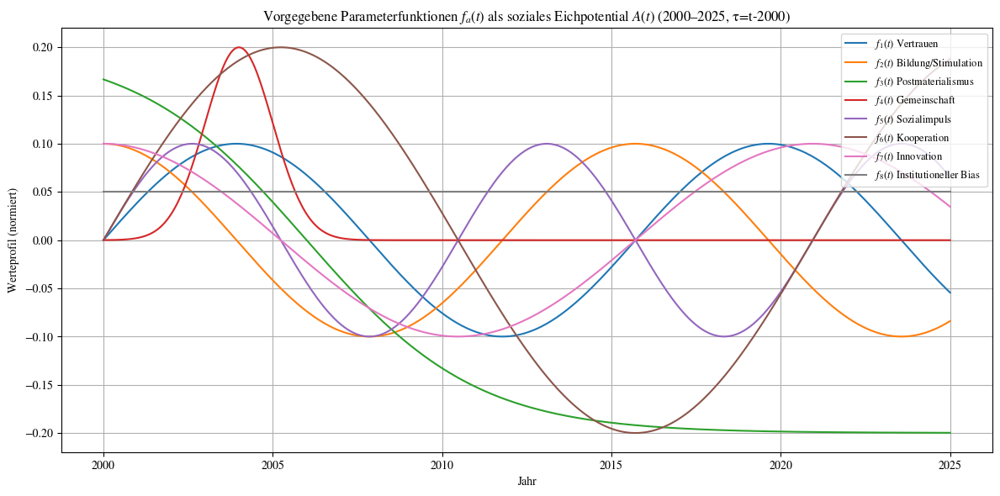

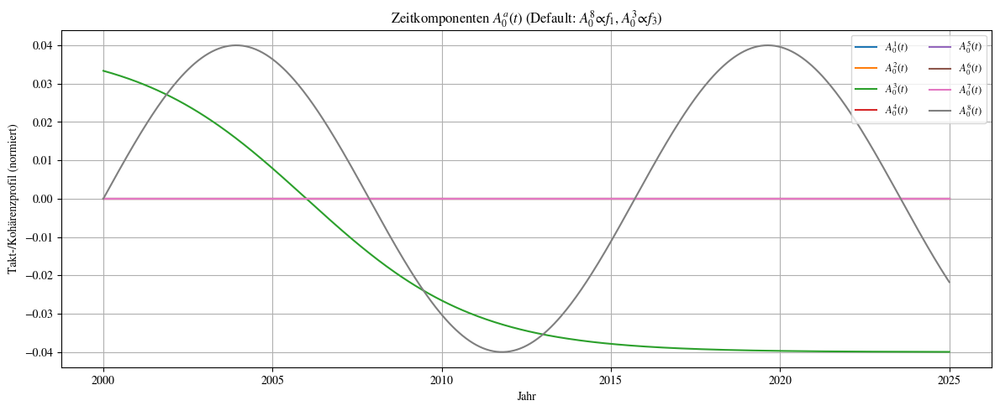

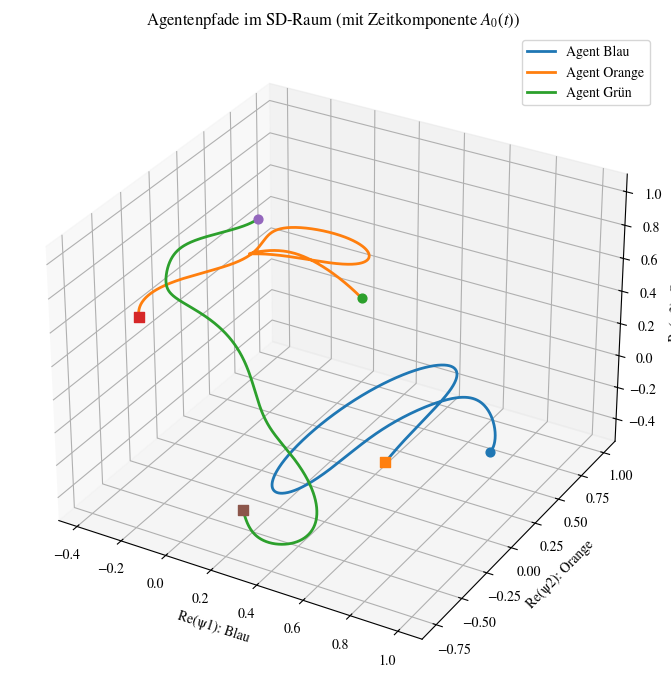

Pancharatnam-Phasen (rad):  A=-0.2418, B=-2.2367, C=2.3184
Pancharatnam-Phasen (deg):  A=-13.86, B=-128.15, C=132.83
Open-path Berry-Summen (rad):  A=-2.6588, B=1.0811, C=1.5778
Open-path Berry-Summen (deg):  A=-152.34, B=61.94, C=90.40


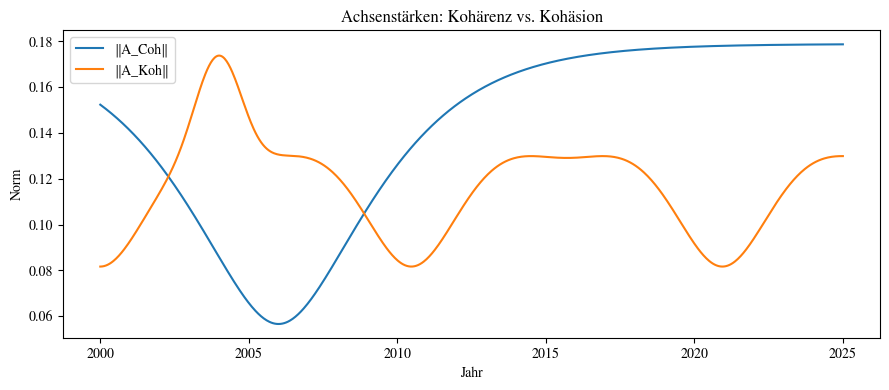

/tmp/ipython-input-3586308097.py:315: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.legend(); plt.tight_layout(); plt.show()
/tmp/ipython-input-3586308097.py:315: UserWarning: Glyph 550 (\N{LATIN CAPITAL LETTER A WITH DOT ABOVE}) missing from font(s) STIXGeneral.
  plt.legend(); plt.tight_layout(); plt.show()


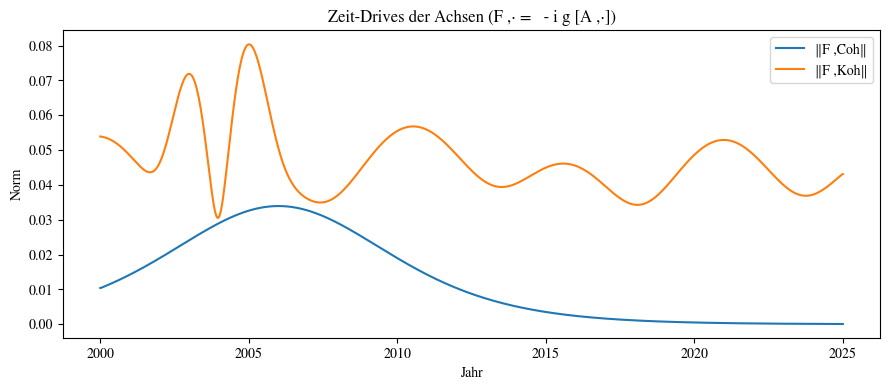

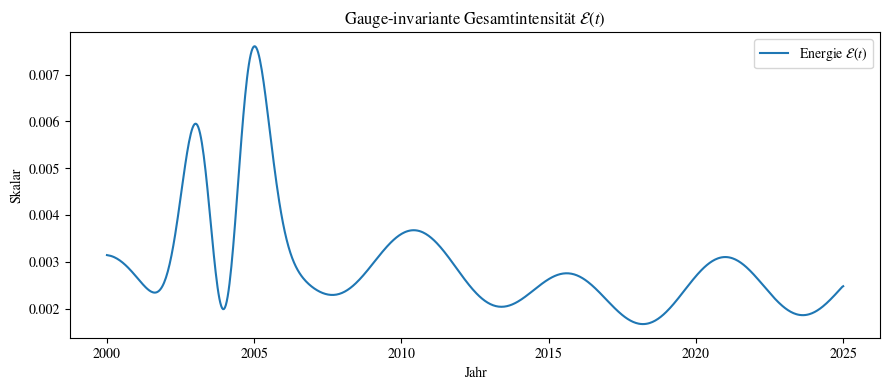

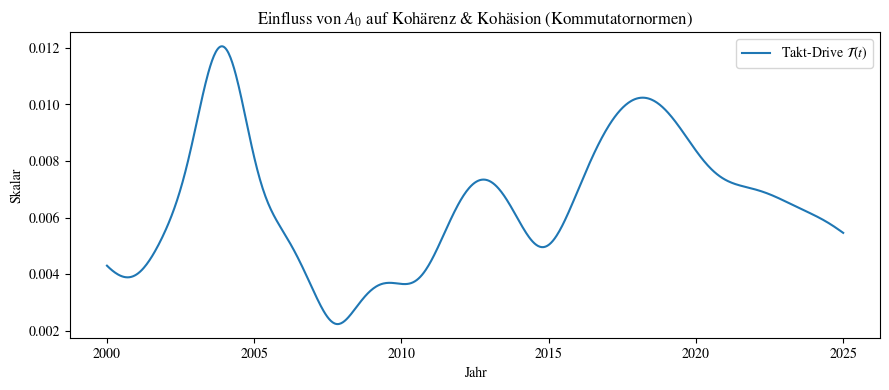

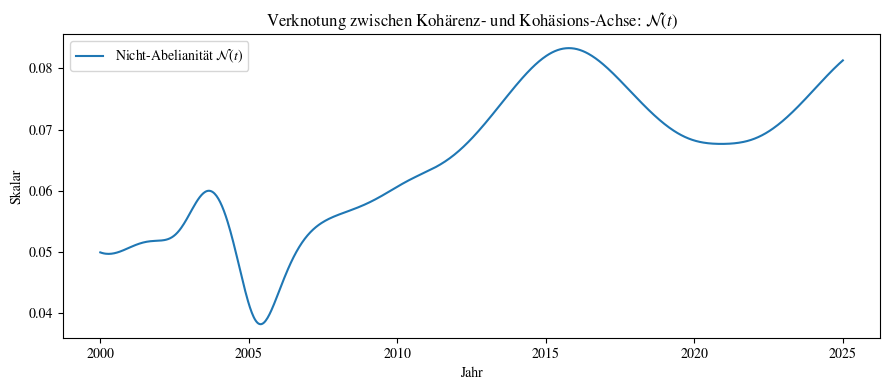

In [ ]:
# -*- coding: utf-8 -*-
# SD-Schroedinger + Feldtensoren (0+1D, homogen)
# - Externe Parameterfunktionen f1..f8 -> A(t) = Sum f_a(t) * λ_a
# - Zeitkomponenten A0^a(t) -> A0(t) = Sum a0_a(t) * λ_a
# - Kohärenz- & Kohäsions-Achsen als Projektionen im SU(3)-Farbraum
# - Feldstärken: F_{0,Coh}, F_{0,Koh}, F_{Coh,Koh}
# - Visualisierungen: f_a(t), A0^a(t), Agentenpfade, Achsenstärken, Zeit-Drives, Querkrümmung, KPIs

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

import matplotlib as mpl
mpl.rcParams['mathtext.fontset'] = 'stix'   # gute Mathe-Schriften
mpl.rcParams['font.family'] = 'STIXGeneral' # optional, einheitlicher Look


# =====================================
# 0) Parameterfunktionen f1..f8 (vom Nutzer vorgegeben)
#     Hinweis: t sind "Jahre" 2000–2025.
#     Wir setzen τ = t - 2000, damit die Vorgabefunktionen (sin, cos, tanh, Gauß)
#     sinnvoll im Fenster 0–25 liegen (z.B. f4-Peak bei τ=4 → Jahr 2004).
# =====================================
def _tau(t: float) -> float:
    return float(t) - 2000.0

def f1(t):  # 0.1 * sin(0.4 * τ)
    τ = _tau(t)
    return 0.1 * np.sin(0.4 * τ)

def f2(t):
    τ = _tau(t)
    return 0.1 * np.cos(0.4 * τ)

def f3(t):
    τ = _tau(t)
    return -0.2 * np.tanh(0.2 * (τ - 6.0))

def f4(t):
    τ = _tau(t)
    return 0.2 * np.exp(-((τ - 4.0) ** 2) / 2.0)

def f5(t):
    τ = _tau(t)
    return 0.1 * np.sin(0.6 * τ)

def f6(t):
    τ = _tau(t)
    return 0.2 * np.sin(0.3 * τ)

def f7(t):
    τ = _tau(t)
    return 0.1 * np.cos(0.3 * τ)

def f8(t):
    return 0.05

def f_components(t: float) -> np.ndarray:
    """Rückgabe der 8 Komponenten f_a(t) als numpy-Array (float)."""
    return np.array([
        float(f1(t)), float(f2(t)), float(f3(t)), float(f4(t)),
        float(f5(t)), float(f6(t)), float(f7(t)), float(f8(t))
    ], dtype=float)

# =====================================
# 0b) Zeitkomponenten A0 – acht a0_a(t) (Defaults: justierbar)
#     Konsistent zu den neuen f_a(t):
#     - A0^8(t) = scale_8 * f1(t)
#     - A0^3(t) = scale_3 * f3(t)
#     - rest = 0
# =====================================
scale_8 = 0.4
scale_3 = 0.2

def a0_1(t): return 0.0
def a0_2(t): return 0.0
def a0_3(t): return scale_3 * f3(t)
def a0_4(t): return 0.0
def a0_5(t): return 0.0
def a0_6(t): return 0.0
def a0_7(t): return 0.0
def a0_8(t): return scale_8 * f1(t)

def a0_components(t: float) -> np.ndarray:
    return np.array([
        float(a0_1(t)), float(a0_2(t)), float(a0_3(t)), float(a0_4(t)),
        float(a0_5(t)), float(a0_6(t)), float(a0_7(t)), float(a0_8(t))
    ], dtype=float)

# =====================================
# 1) Plots: f_a(t) und A0_a(t)
# =====================================
t_plot = np.linspace(2000, 2025, 500)
fa_stack  = np.array([f_components(tt)  for tt in t_plot])
a0_stack  = np.array([a0_components(tt) for tt in t_plot])

plt.figure(figsize=(12, 6))
labels_f = [
    r"$f_1(t)$ Vertrauen", r"$f_2(t)$ Bildung/Stimulation",
    r"$f_3(t)$ Postmaterialismus", r"$f_4(t)$ Gemeinschaft",
    r"$f_5(t)$ Sozialimpuls", r"$f_6(t)$ Kooperation",
    r"$f_7(t)$ Innovation", r"$f_8(t)$ Institutioneller Bias"
]
for i in range(8):
    plt.plot(t_plot, fa_stack[:, i], label=labels_f[i])
plt.title(r"Vorgegebene Parameterfunktionen $f_a(t)$ als soziales Eichpotential $A(t)$ (2000–2025, τ=t-2000)")
plt.xlabel("Jahr"); plt.ylabel("Werteprofil (normiert)")
plt.grid(True); plt.legend(loc="upper right", fontsize=9); plt.tight_layout(); plt.show()

plt.figure(figsize=(12, 5))
labels_a0 = [fr"$A_0^{a+1}(t)$" for a in range(8)]
for i in range(8):
    plt.plot(t_plot, a0_stack[:, i], label=labels_a0[i])
plt.title(r"Zeitkomponenten $A_0^a(t)$ (Default: $A_0^8\!\propto\! f_1$, $A_0^3\!\propto\! f_3$)")
plt.xlabel("Jahr"); plt.ylabel("Takt-/Kohärenzprofil (normiert)")
plt.grid(True); plt.legend(loc="upper right", ncol=2, fontsize=9); plt.tight_layout(); plt.show()

# =====================================
# 2) SU(3)-Generatoren (Gell-Mann-Matrizen)
#    (hier als λ_a; keine 1/2-Faktoren)
# =====================================
λ1 = np.array([[0,1,0],[1,0,0],[0,0,0]], complex)
λ2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], complex)
λ3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], complex)
λ4 = np.array([[0,0,1],[0,0,0],[1,0,0]], complex)
λ5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], complex)
λ6 = np.array([[0,0,0],[0,0,1],[0,1,0]], complex)
λ7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], complex)
λ8 = (1/np.sqrt(3)) * np.diag([1,1,-2])
generators = [λ1,λ2,λ3,λ4,λ5,λ6,λ7,λ8]

def A_from_components(components: np.ndarray) -> np.ndarray:
    A = np.zeros((3,3), dtype=complex)
    for a in range(8):
        A = A + components[a] * generators[a]
    return A

# =====================================
# 3) Hamiltonian H(t) = g * A(t); A0(t) separat
#    Kovarianter Zeitableiter: i d/dt ψ = [ H(t) - g0 A0(t) ] ψ
# =====================================
g  = 1.0
g0 = 1.0

def A_of_t(t: float)  -> np.ndarray: return A_from_components(f_components(t))
def A0_of_t(t: float) -> np.ndarray: return A_from_components(a0_components(t))
def H_of_t(t: float)  -> np.ndarray: return g * A_of_t(t)

# =====================================
# 4) Schrödingerdynamik
# =====================================
def schrodinger_rhs_with_A0(t, psi_flat):
    psi = psi_flat[:3] + 1j*psi_flat[3:]
    H = H_of_t(t) - g0 * A0_of_t(t)
    dpsi = -1j * H @ psi
    return np.concatenate([dpsi.real, dpsi.imag])

# Zeitachse
t0, t1 = 2000.0, 2025.0
t_eval = np.linspace(t0, t1, 800)

# Startzustände
psiA0 = np.array([1,0,0], complex)  # Blau
psiB0 = np.array([0,1,0], complex)  # Orange
psiC0 = np.array([0,0,1], complex)  # Grün

def evolve_with_A0(psi0: np.ndarray):
    y0 = np.concatenate([psi0.real, psi0.imag])
    sol = solve_ivp(
        schrodinger_rhs_with_A0, [t0, t1], y0, t_eval=t_eval,
        rtol=1e-8, atol=1e-10, method='DOP853'
    )
    psi_t = sol.y[:3, :] + 1j*sol.y[3:, :]
    norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    psi_t = psi_t / norms
    return sol.t, psi_t.T

tA, pathA = evolve_with_A0(psiA0)
tB, pathB = evolve_with_A0(psiB0)
tC, pathC = evolve_with_A0(psiC0)

# =====================================
# 5) Phasen (Pancharatnam & Open-path Berry-artig)
# =====================================
def pancharatnam_phase(psi_path: np.ndarray) -> float:
    z = np.vdot(psi_path[0], psi_path[-1])
    return float(np.angle(z))

def berry_like_open_phase(psi_path: np.ndarray) -> float:
    ph = 0.0
    for k in range(len(psi_path)-1):
        z = np.vdot(psi_path[k], psi_path[k+1])
        if abs(z) > 1e-12:
            ph += float(np.angle(z))
    return ph

pan_A = pancharatnam_phase(pathA); berr_A = berry_like_open_phase(pathA)
pan_B = pancharatnam_phase(pathB); berr_B = berry_like_open_phase(pathB)
pan_C = pancharatnam_phase(pathC); berr_C = berry_like_open_phase(pathC)

# =====================================
# 6) Visualisierung der Agentenpfade (3D, Realteile)
# =====================================
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')

for path, lab in [(pathA, 'Agent Blau'), (pathB, 'Agent Orange'), (pathC, 'Agent Grün')]:
    X, Y, Z = path.real.T
    ax.plot(X, Y, Z, lw=2, label=lab)
    ax.scatter(X[0], Y[0], Z[0], s=40, marker='o')
    ax.scatter(X[-1], Y[-1], Z[-1], s=60, marker='s')

ax.set_xlabel('Re(ψ1): Blau'); ax.set_ylabel('Re(ψ2): Orange'); ax.set_zlabel('Re(ψ3): Grün')
ax.set_title('Agentenpfade im SD-Raum (mit Zeitkomponente $A_0(t)$)')
ax.legend(); plt.tight_layout(); plt.show()

print("Pancharatnam-Phasen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(pan_A, pan_B, pan_C))
print("Pancharatnam-Phasen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([pan_A, pan_B, pan_C])
))
print("Open-path Berry-Summen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(berr_A, berr_B, berr_C))
print("Open-path Berry-Summen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([berr_A, berr_B, berr_C])
))

# =====================================
# 7) Kohärenz & Kohäsion: Projektionen + Feldtensoren
# =====================================

def comm(A, B):  # Matrixkommutator
    return A @ B - B @ A

def frob_norm(M):
    return np.sqrt(np.real(np.trace(M.conj().T @ M)))

# Projektor-Gewichte (heuristisch; einfach anpassbar)
# Kohärenz: Cartan-getrieben (λ3, λ8) -> legt Takt/Zeitkohärenz fest
u_coh = np.array([0,0,0.6,0,0,0,0,0.8], dtype=float)
u_coh = u_coh / np.linalg.norm(u_coh)

# Kohäsion: Bindungs-Paare (λ1,2,4,5,6,7) -> Werte-Zusammenhalt
v_koh = np.array([1,1,0,1,1,1,1,0], dtype=float)
v_koh = v_koh / np.linalg.norm(v_koh)

# Zeitgitter für Feldtensor-Berechnung = t_eval
def A_axis_from_weights(weights, tgrid):
    """A_axis(t) = Sum_a weights[a] * f_a(t) * λ_a  (Liste von 3x3-Matrizen)"""
    mats = []
    for tt in tgrid:
        comps = weights * f_components(tt)  # gewichtete Komponenten
        mats.append(A_from_components(comps))
    return np.array(mats)  # shape (T,3,3)

A_coh = A_axis_from_weights(u_coh, t_eval)
A_koh = A_axis_from_weights(v_koh, t_eval)
A0_seq = np.array([A0_of_t(tt) for tt in t_eval])

# Zeitableitungen (zentrale Differenzen)
dt = t_eval[1] - t_eval[0]
def time_derivative(A_seq):
    dA = np.zeros_like(A_seq, dtype=complex)
    dA[1:-1] = (A_seq[2:] - A_seq[:-2])/(2*dt)
    dA[0]    = (A_seq[1]  - A_seq[0]) / dt
    dA[-1]   = (A_seq[-1] - A_seq[-2]) / dt
    return dA

dA_coh = time_derivative(A_coh)
dA_koh = time_derivative(A_koh)

gYM = 1.0  # Kopplung für Feldtensoren (ggf. separat justieren)

# Feldstärken (0+1D, homogen)
F0_coh     = dA_coh - 1j*gYM*np.array([comm(A0_seq[i], A_coh[i]) for i in range(len(t_eval))])
F0_koh     = dA_koh - 1j*gYM*np.array([comm(A0_seq[i], A_koh[i]) for i in range(len(t_eval))])
F_coh_koh  = -1j*gYM*np.array([comm(A_coh[i], A_koh[i]) for i in range(len(t_eval))])

# Normen / KPIs
norm_A_coh     = np.array([frob_norm(A_coh[i])     for i in range(len(t_eval))])
norm_A_koh     = np.array([frob_norm(A_koh[i])     for i in range(len(t_eval))])
norm_F0_coh    = np.array([frob_norm(F0_coh[i])    for i in range(len(t_eval))])
norm_F0_koh    = np.array([frob_norm(F0_koh[i])    for i in range(len(t_eval))])
norm_F_ck      = np.array([frob_norm(F_coh_koh[i]) for i in range(len(t_eval))])

# Energie (eichinvariant in diesem 0+1D-Setup)
E_t = norm_F0_coh**2 + norm_F0_koh**2 + norm_F_ck**2

# Takt-Drive = Einfluss von A0 auf die Achsen (reine Kommutatornorm)
T_drive = np.array([frob_norm(comm(A0_seq[i], A_coh[i])) + frob_norm(comm(A0_seq[i], A_koh[i]))
                    for i in range(len(t_eval))])

# Nicht-Abelianitäts-Index: Verknotung zwischen Achsen
eps = 1e-12
N_index = norm_F_ck / (norm_A_coh + norm_A_koh + eps)

# =====================================
# 8) Visualisierungen der Feldtensor-Diagnostik
# =====================================

# Achsenstärken
plt.figure(figsize=(9,4))
plt.plot(t_eval, norm_A_coh, label="‖A_Coh‖")
plt.plot(t_eval, norm_A_koh, label="‖A_Koh‖")
plt.xlabel("Jahr"); plt.ylabel("Norm")
plt.title("Achsenstärken: Kohärenz vs. Kohäsion")
plt.legend(); plt.tight_layout(); plt.show()

# Zeit-Drives (inkl. -i g [A0, ⋅])
plt.figure(figsize=(9,4))
plt.plot(t_eval, norm_F0_coh, label="‖F₀,Coh‖")
plt.plot(t_eval, norm_F0_koh, label="‖F₀,Koh‖")
plt.xlabel("Jahr"); plt.ylabel("Norm")
plt.title("Zeit-Drives der Achsen (F₀,⋅ = Ȧ - i g [A₀,⋅])")
plt.legend(); plt.tight_layout(); plt.show()

# KPIs: Energie, Takt-Drive, Nicht-Abelianität
plt.figure(figsize=(9,4))
plt.plot(t_eval, E_t, label=r"Energie $\mathcal{E}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Gauge-invariante Gesamtintensität $\mathcal{E}(t)$")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, T_drive, label=r"Takt-Drive $\mathcal{T}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Einfluss von $A_0$ auf Kohärenz & Kohäsion (Kommutatornormen)")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, N_index, label=r"Nicht-Abelianität $\mathcal{N}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Verknotung zwischen Kohärenz- und Kohäsions-Achse: $\mathcal{N}(t)$")
plt.legend(); plt.tight_layout(); plt.show()


Was wurde konkret geändert (damit
𝑆
S &
𝐼
I zeitabhängig werden)?

Lokale Unitarität gebrochen: AGENT_HETEROGENEITY = True →

𝐻
𝐴
(
𝑡
)
≠
𝐻
𝐵
(
𝑡
)
≠
𝐻
𝐶
(
𝑡
)
H
A
	​

(t)

=H
B
	​

(t)

=H
C
	​

(t) (über leicht unterschiedliche
𝑔
0
g
0
	​

-Faktoren vor
𝐴
0
(
𝑡
)
A
0
	​

(t)).

Zeitabhängige Gewichte: branch_weights_of_time(t) erzeugt
𝑤
𝐴
(
𝑡
)
,
𝑤
𝐵
(
𝑡
)
,
𝑤
𝐶
(
𝑡
)
w
A
	​

(t),w
B
	​

(t),w
C
	​

(t) via Softmax aus
∣
𝑓
𝑎
(
𝑡
)
∣
∣f
a
	​

(t)∣. Dadurch ändert sich die Mischung bzw. die GHZ-Amplituden kontinuierlich.

Ergebnis: Alle vorherigen Plots sind wieder da und Entropie/MI zeigen nun eine echte Entwicklung über der Zeit.
Wenn du homogeneous Unitaries testen willst, setze AGENT_HETEROGENEITY=False und/oder WEIGHTING_MODE="static" – dann sollten
𝑆
S &
𝐼
I wieder nahezu konstant werden (wie es die Theorie verlangt).

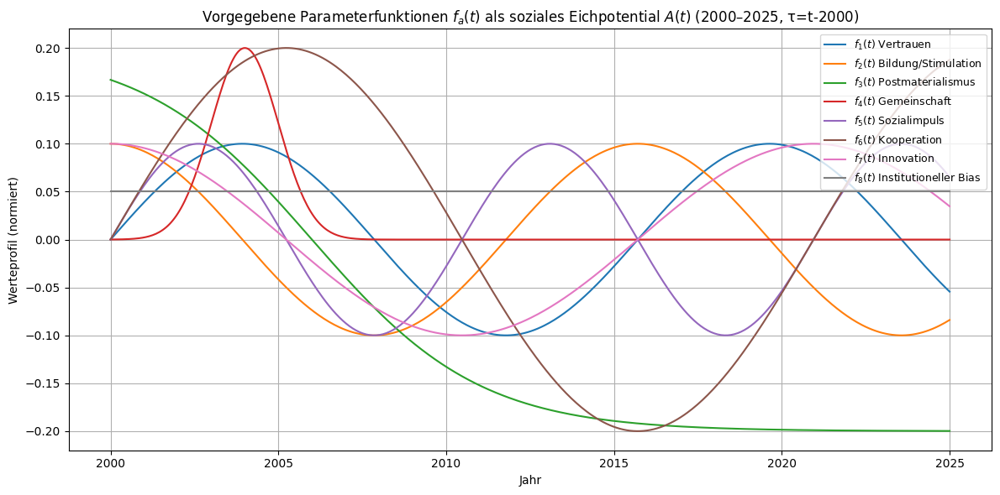

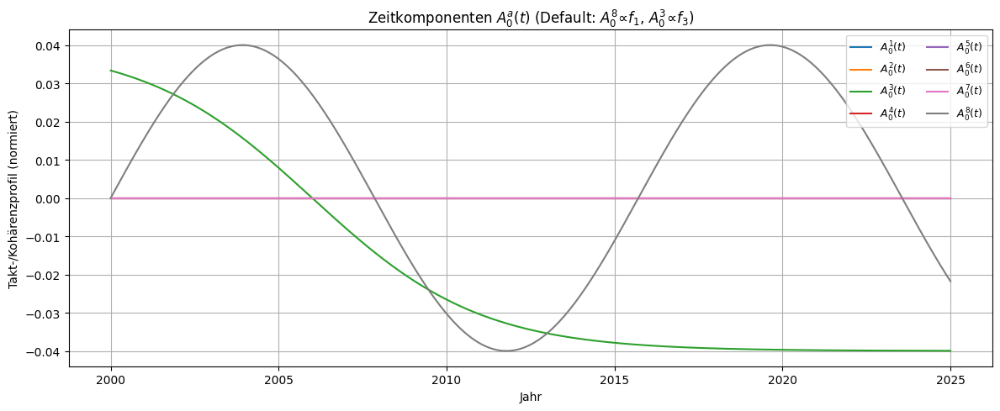

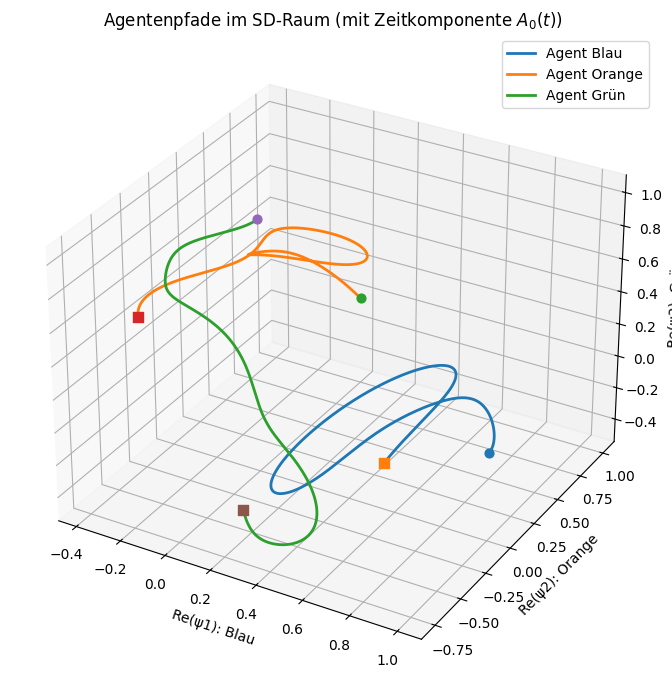

Pancharatnam-Phasen (rad):  A=-0.2418, B=-2.2375, C=2.3183
Pancharatnam-Phasen (deg):  A=-13.86, B=-128.20, C=132.83
Open-path Berry-Summen (rad):  A=-2.6588, B=1.0721, C=1.5999
Open-path Berry-Summen (deg):  A=-152.34, B=61.42, C=91.67


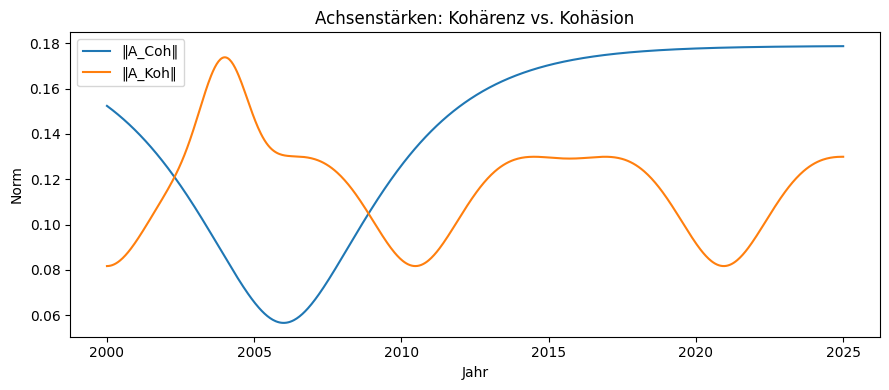

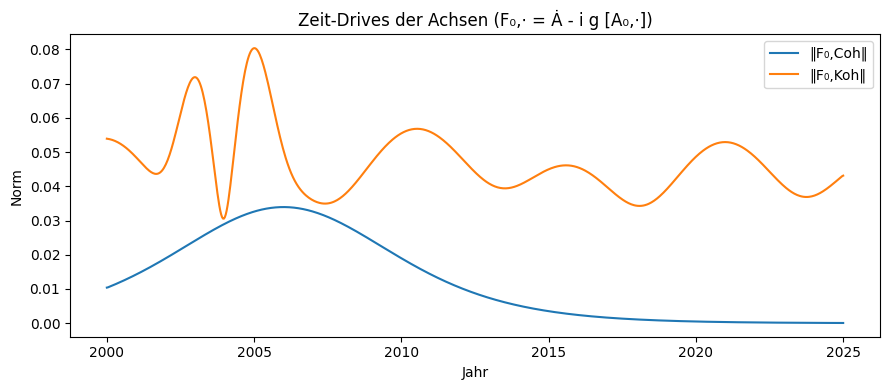

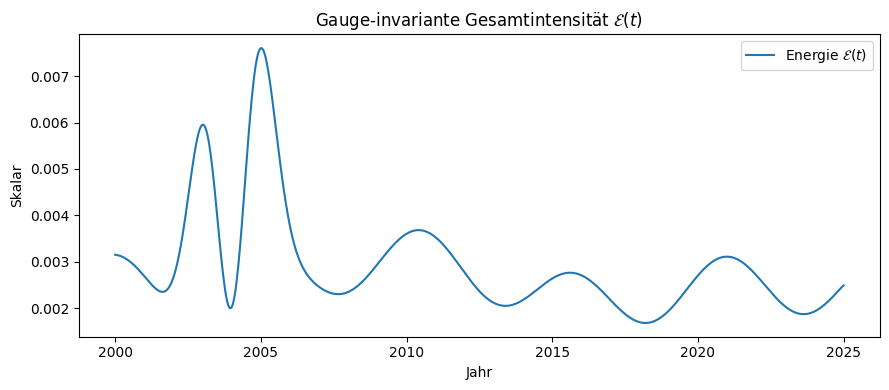

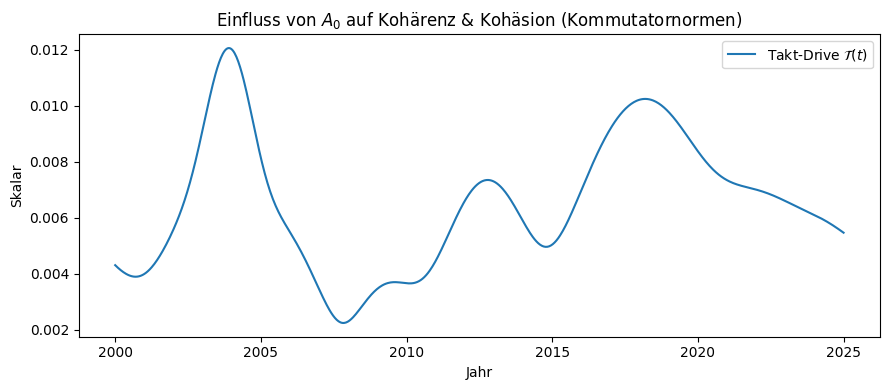

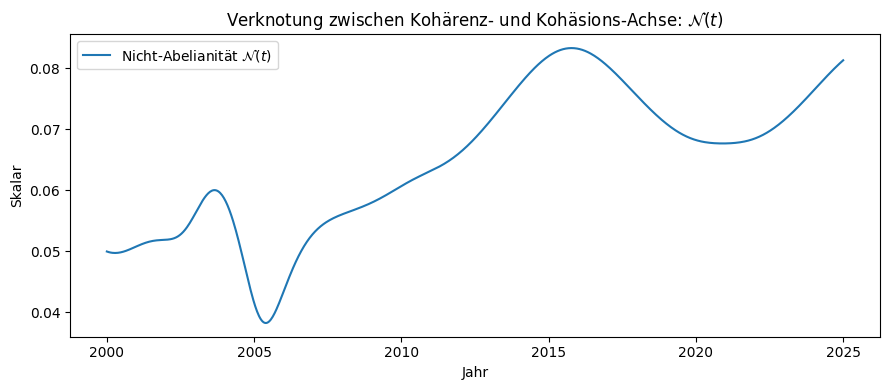

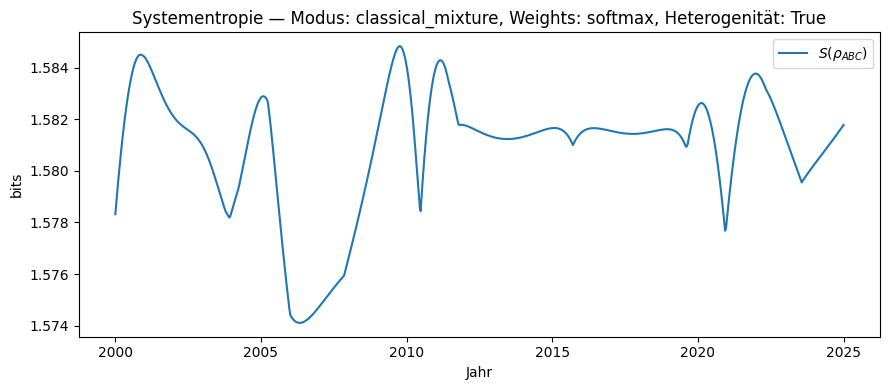

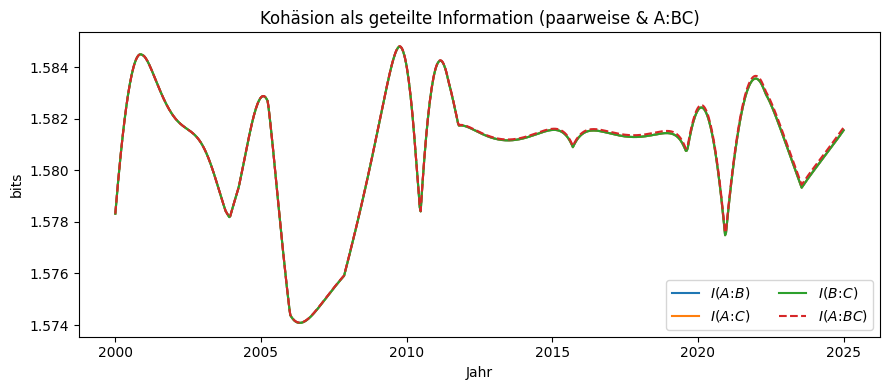

In [ ]:

# -*- coding: utf-8 -*-
# SD-Schroedinger + Feldtensoren (0+1D, homogen) + Entropie & Mutual Information
# - Beinhaltet ALLE vorherigen Plots + NEU: echte Zeitabhängigkeit für S & MI
# - Mechanismen für Zeitabhängigkeit:
#     (1) Agenten-Heterogenität: leicht unterschiedliche A0-Kopplungen je Agent
#     (2) Zeitabhängige Mischungsgewichte w_A(t), w_B(t), w_C(t) via Softmax(f_a(t))

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

import matplotlib as mpl
#mpl.rcParams['mathtext.fontset'] = 'stix'
#mpl.rcParams['font.family'] = 'STIXGeneral'

mpl.rcParams['mathtext.fontset'] = 'dejavusans'
mpl.rcParams['font.family'] = 'DejaVu Sans'


# =========================================================
# 0) Parameterfunktionen f1..f8 (gegeben)
# =========================================================
def _tau(t: float) -> float:
    return float(t) - 2000.0

def f1(t):
    τ = _tau(t); return 0.1 * np.sin(0.4 * τ)

def f2(t):
    τ = _tau(t); return 0.1 * np.cos(0.4 * τ)

def f3(t):
    τ = _tau(t); return -0.2 * np.tanh(0.2 * (τ - 6.0))

def f4(t):
    τ = _tau(t); return 0.2 * np.exp(-((τ - 4.0) ** 2) / 2.0)

def f5(t):
    τ = _tau(t); return 0.1 * np.sin(0.6 * τ)

def f6(t):
    τ = _tau(t); return 0.2 * np.sin(0.3 * τ)

def f7(t):
    τ = _tau(t); return 0.1 * np.cos(0.3 * τ)

def f8(t):
    return 0.05

def f_components(t: float) -> np.ndarray:
    return np.array([
        float(f1(t)), float(f2(t)), float(f3(t)), float(f4(t)),
        float(f5(t)), float(f6(t)), float(f7(t)), float(f8(t))
    ], dtype=float)

# =========================================================
# 0b) Zeitkomponenten A0 – acht a0_a(t)
# =========================================================
scale_8 = 0.4
scale_3 = 0.2

def a0_1(t): return 0.0
def a0_2(t): return 0.0
def a0_3(t): return scale_3 * f3(t)
def a0_4(t): return 0.0
def a0_5(t): return 0.0
def a0_6(t): return 0.0
def a0_7(t): return 0.0
def a0_8(t): return scale_8 * f1(t)

def a0_components(t: float) -> np.ndarray:
    return np.array([
        float(a0_1(t)), float(a0_2(t)), float(a0_3(t)), float(a0_4(t)),
        float(a0_5(t)), float(a0_6(t)), float(a0_7(t)), float(a0_8(t))
    ], dtype=float)

# =========================================================
# 1) Plots: f_a(t) und A0_a(t)  (WIEDER DRIN)
# =========================================================
t_plot = np.linspace(2000, 2025, 500)
fa_stack  = np.array([f_components(tt)  for tt in t_plot])
a0_stack  = np.array([a0_components(tt) for tt in t_plot])

plt.figure(figsize=(12, 6))
labels_f = [
    r"$f_1(t)$ Vertrauen", r"$f_2(t)$ Bildung/Stimulation",
    r"$f_3(t)$ Postmaterialismus", r"$f_4(t)$ Gemeinschaft",
    r"$f_5(t)$ Sozialimpuls", r"$f_6(t)$ Kooperation",
    r"$f_7(t)$ Innovation", r"$f_8(t)$ Institutioneller Bias"
]
for i in range(8):
    plt.plot(t_plot, fa_stack[:, i], label=labels_f[i])
plt.title(r"Vorgegebene Parameterfunktionen $f_a(t)$ als soziales Eichpotential $A(t)$ (2000–2025, τ=t-2000)")
plt.xlabel("Jahr"); plt.ylabel("Werteprofil (normiert)")
plt.grid(True); plt.legend(loc="upper right", fontsize=9); plt.tight_layout(); plt.show()

plt.figure(figsize=(12, 5))
labels_a0 = [fr"$A_0^{a+1}(t)$" for a in range(8)]
for i in range(8):
    plt.plot(t_plot, a0_stack[:, i], label=labels_a0[i])
plt.title(r"Zeitkomponenten $A_0^a(t)$ (Default: $A_0^8\!\propto\! f_1$, $A_0^3\!\propto\! f_3$)")
plt.xlabel("Jahr"); plt.ylabel("Takt-/Kohärenzprofil (normiert)")
plt.grid(True); plt.legend(loc="upper right", ncol=2, fontsize=9); plt.tight_layout(); plt.show()

# =========================================================
# 2) SU(3)-Generatoren
# =========================================================
λ1 = np.array([[0,1,0],[1,0,0],[0,0,0]], complex)
λ2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], complex)
λ3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], complex)
λ4 = np.array([[0,0,1],[0,0,0],[1,0,0]], complex)
λ5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], complex)
λ6 = np.array([[0,0,0],[0,0,1],[0,1,0]], complex)
λ7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], complex)
λ8 = (1/np.sqrt(3)) * np.diag([1,1,-2])
generators = [λ1,λ2,λ3,λ4,λ5,λ6,λ7,λ8]

def A_from_components(components: np.ndarray) -> np.ndarray:
    A = np.zeros((3,3), dtype=complex)
    for a in range(8):
        A = A + components[a] * generators[a]
    return A

# =========================================================
# 3) Hamiltonian H(t) = g * A(t); A0(t) separat
# =========================================================
g  = 1.0
g0 = 1.0

def A_of_t(t: float)  -> np.ndarray: return A_from_components(f_components(t))
def A0_of_t(t: float) -> np.ndarray: return A_from_components(a0_components(t))
def H_of_t(t: float)  -> np.ndarray: return g * A_of_t(t)

# =========================================================
# 4) Schrödingerdynamik
#    (NEU: agentenspezifischer A0-Faktor -> Heterogenität)
# =========================================================
# Konfiguration:
AGENT_HETEROGENEITY = True
g0_A, g0_B, g0_C = 1.00, 1.03, 0.97  # leichte Unterschiede erzeugen Zeitstruktur in S & MI

def schrodinger_rhs_with_A0_agent(t, psi_flat, g0_agent):
    psi = psi_flat[:3] + 1j*psi_flat[3:]
    H = H_of_t(t) - g0_agent * A0_of_t(t)
    dpsi = -1j * H @ psi
    return np.concatenate([dpsi.real, dpsi.imag])

# Zeitachse
t0, t1 = 2000.0, 2025.0
t_eval = np.linspace(t0, t1, 800)

# Startzustände
psiA0 = np.array([1,0,0], complex)  # Blau
psiB0 = np.array([0,1,0], complex)  # Orange
psiC0 = np.array([0,0,1], complex)  # Grün

def evolve_agent(psi0: np.ndarray, g0_agent: float):
    y0 = np.concatenate([psi0.real, psi0.imag])
    sol = solve_ivp(
        lambda t,y: schrodinger_rhs_with_A0_agent(t,y,g0_agent),
        [t0, t1], y0, t_eval=t_eval, rtol=1e-8, atol=1e-10, method='DOP853'
    )
    psi_t = sol.y[:3, :] + 1j*sol.y[3:, :]
    norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    psi_t = psi_t / norms
    return sol.t, psi_t.T

if AGENT_HETEROGENEITY:
    tA, pathA = evolve_agent(psiA0, g0_A)
    tB, pathB = evolve_agent(psiB0, g0_B)
    tC, pathC = evolve_agent(psiC0, g0_C)
else:
    # alter, homogener Fall (für Vergleich)
    def schrodinger_rhs_with_A0(t, y):
        return schrodinger_rhs_with_A0_agent(t, y, g0)
    def evolve_with_A0(psi0: np.ndarray):
        y0 = np.concatenate([psi0.real, psi0.imag])
        sol = solve_ivp(
            schrodinger_rhs_with_A0, [t0, t1], y0, t_eval=t_eval,
            rtol=1e-8, atol=1e-10, method='DOP853'
        )
        psi_t = sol.y[:3, :] + 1j*sol.y[3:, :]
        psi_t = psi_t / np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
        return sol.t, psi_t.T
    tA, pathA = evolve_with_A0(psiA0)
    tB, pathB = evolve_with_A0(psiB0)
    tC, pathC = evolve_with_A0(psiC0)

# =========================================================
# 5) Phasen (Pancharatnam & Open-path)
# =========================================================
def pancharatnam_phase(psi_path: np.ndarray) -> float:
    z = np.vdot(psi_path[0], psi_path[-1])
    return float(np.angle(z))

def berry_like_open_phase(psi_path: np.ndarray) -> float:
    ph = 0.0
    for k in range(len(psi_path)-1):
        z = np.vdot(psi_path[k], psi_path[k+1])
        if abs(z) > 1e-12:
            ph += float(np.angle(z))
    return ph

pan_A = pancharatnam_phase(pathA); berr_A = berry_like_open_phase(pathA)
pan_B = pancharatnam_phase(pathB); berr_B = berry_like_open_phase(pathB)
pan_C = pancharatnam_phase(pathC); berr_C = berry_like_open_phase(pathC)

# =========================================================
# 6) Agentenpfade (3D, Realteile)  (WIEDER DRIN)
# =========================================================
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')
for path, lab in [(pathA, 'Agent Blau'), (pathB, 'Agent Orange'), (pathC, 'Agent Grün')]:
    X, Y, Z = path.real.T
    ax.plot(X, Y, Z, lw=2, label=lab)
    ax.scatter(X[0], Y[0], Z[0], s=40, marker='o')
    ax.scatter(X[-1], Y[-1], Z[-1], s=60, marker='s')
ax.set_xlabel('Re(ψ1): Blau'); ax.set_ylabel('Re(ψ2): Orange'); ax.set_zlabel('Re(ψ3): Grün')
ax.set_title('Agentenpfade im SD-Raum (mit Zeitkomponente $A_0(t)$)')
ax.legend(); plt.tight_layout(); plt.show()

print("Pancharatnam-Phasen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(pan_A, pan_B, pan_C))
print("Pancharatnam-Phasen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([pan_A, pan_B, pan_C])
))
print("Open-path Berry-Summen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(berr_A, berr_B, berr_C))
print("Open-path Berry-Summen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([berr_A, berr_B, berr_C])
))

# =========================================================
# 7) Kohärenz & Kohäsion: Projektionen + Feldtensoren  (WIEDER DRIN)
# =========================================================
def comm(A, B):  return A @ B - B @ A
def frob_norm(M): return np.sqrt(np.real(np.trace(M.conj().T @ M)))

u_coh = np.array([0,0,0.6,0,0,0,0,0.8], dtype=float); u_coh = u_coh/np.linalg.norm(u_coh)
v_koh = np.array([1,1,0,1,1,1,1,0], dtype=float);      v_koh = v_koh/np.linalg.norm(v_koh)

def A_axis_from_weights(weights, tgrid):
    mats = []
    for tt in tgrid:
        comps = weights * f_components(tt)
        mats.append(A_from_components(comps))
    return np.array(mats)

A_coh = A_axis_from_weights(u_coh, t_eval)
A_koh = A_axis_from_weights(v_koh, t_eval)
A0_seq = np.array([A0_of_t(tt) for tt in t_eval])

dt = t_eval[1] - t_eval[0]
def time_derivative(A_seq):
    dA = np.zeros_like(A_seq, dtype=complex)
    dA[1:-1] = (A_seq[2:] - A_seq[:-2])/(2*dt)
    dA[0]    = (A_seq[1]  - A_seq[0]) / dt
    dA[-1]   = (A_seq[-1] - A_seq[-2]) / dt
    return dA

dA_coh = time_derivative(A_coh)
dA_koh = time_derivative(A_koh)

gYM = 1.0
F0_coh     = dA_coh - 1j*gYM*np.array([comm(A0_seq[i], A_coh[i]) for i in range(len(t_eval))])
F0_koh     = dA_koh - 1j*gYM*np.array([comm(A0_seq[i], A_koh[i]) for i in range(len(t_eval))])
F_coh_koh  = -1j*gYM*np.array([comm(A_coh[i], A_koh[i]) for i in range(len(t_eval))])

norm_A_coh  = np.array([frob_norm(A_coh[i])     for i in range(len(t_eval))])
norm_A_koh  = np.array([frob_norm(A_koh[i])     for i in range(len(t_eval))])
norm_F0_coh = np.array([frob_norm(F0_coh[i])    for i in range(len(t_eval))])
norm_F0_koh = np.array([frob_norm(F0_koh[i])    for i in range(len(t_eval))])
norm_F_ck   = np.array([frob_norm(F_coh_koh[i]) for i in range(len(t_eval))])

E_t     = norm_F0_coh**2 + norm_F0_koh**2 + norm_F_ck**2
T_drive = np.array([frob_norm(comm(A0_seq[i], A_coh[i])) + frob_norm(comm(A0_seq[i], A_koh[i]))
                    for i in range(len(t_eval))])
eps = 1e-12
N_index = norm_F_ck / (norm_A_coh + norm_A_koh + eps)

# ---- Visualisierungen (WIEDER DRIN) ----
plt.figure(figsize=(9,4))
plt.plot(t_eval, norm_A_coh, label="‖A_Coh‖")
plt.plot(t_eval, norm_A_koh, label="‖A_Koh‖")
plt.xlabel("Jahr"); plt.ylabel("Norm")
plt.title("Achsenstärken: Kohärenz vs. Kohäsion")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, norm_F0_coh, label="‖F₀,Coh‖")
plt.plot(t_eval, norm_F0_koh, label="‖F₀,Koh‖")
plt.xlabel("Jahr"); plt.ylabel("Norm")
plt.title("Zeit-Drives der Achsen (F₀,⋅ = Ȧ - i g [A₀,⋅])")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, E_t, label=r"Energie $\mathcal{E}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Gauge-invariante Gesamtintensität $\mathcal{E}(t)$")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, T_drive, label=r"Takt-Drive $\mathcal{T}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Einfluss von $A_0$ auf Kohärenz & Kohäsion (Kommutatornormen)")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, N_index, label=r"Nicht-Abelianität $\mathcal{N}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Verknotung zwischen Kohärenz- und Kohäsions-Achse: $\mathcal{N}(t)$")
plt.legend(); plt.tight_layout(); plt.show()

# =========================================================
# 8) NEU: Von-Neumann-Entropie & Mutual Information — ZEITABHÄNGIG
# =========================================================

# ---- Gewichtungen der Zweige (Zeitabhängig via Softmax) ----
WEIGHTING_MODE = "softmax"  # "softmax" | "static"
softmax_temperature = 3.0

def branch_weights_of_time(t):
    if WEIGHTING_MODE == "static":
        w = np.array([1.0, 1.0, 1.0], dtype=float)
    else:
        # Beispiel: 3 "Sozial-Cluster" aus f_a(t)
        xA = abs(f1(t)) + abs(f2(t))          # Vertrauen+Bildung
        xB = abs(f3(t)) + abs(f4(t))          # Postmaterialismus+Gemeinschaft
        xC = abs(f5(t)) + abs(f6(t)) + 0.5*abs(f7(t))  # Sozialimpuls+Kooperation+Innovation
        x  = np.array([xA, xB, xC], dtype=float)
        x  = x / (np.max(x) + 1e-12)
        # Softmax mit Temperatur -> glatte Zeitabhängigkeit
        z  = x/softmax_temperature
        e  = np.exp(z - np.max(z))
        w  = e / np.sum(e)
    return w

# ---- Dichte-Tools ----
def density_from_state(psi):
    psi = psi.reshape(-1, 1)
    return psi @ psi.conj().T

def von_neumann_entropy(rho, base=2):
    rhoH = 0.5*(rho + rho.conj().T)
    w, _ = np.linalg.eigh(rhoH)
    w = np.clip(np.real(w), 0.0, 1.0)
    nz = w[w > 1e-14]
    log = np.log2 if base == 2 else (np.log if base == np.e else lambda x: np.log(x)/np.log(base))
    return float(-np.sum(nz * log(nz)))

def kron3(a, b, c):
    return np.kron(np.kron(a, b), c)

def ptrace(rho, dims, keep):
    keep = tuple(sorted(keep))
    n = len(dims)
    keep_bar = tuple(i for i in range(n) if i not in keep)
    perm = keep + keep_bar + tuple(n + i for i in keep) + tuple(n + i for i in keep_bar)
    rho_t = rho.reshape(dims + dims).transpose(perm)
    dkeep = int(np.prod([dims[i] for i in keep]))
    dbar  = int(np.prod([dims[i] for i in keep_bar]))
    rho_t = rho_t.reshape(dkeep, dbar, dkeep, dbar)
    red = np.einsum('ikjk->ij', rho_t)
    red = 0.5*(red + red.conj().T)
    tr = np.trace(red)
    if abs(tr) > 1e-14:
        red = red / tr
    return red

# ---- Kohäsions-Modus ----
COHESION_MODE = "classical_mixture"   # "classical_mixture" | "entangled_ghz_like"
PHI_B = 0.0
PHI_C = 0.0

def build_joint_density(psiA, psiB, psiC, t, mode="classical_mixture",
                        phi_b=0.0, phi_c=0.0):
    w = branch_weights_of_time(t)  # <- zeitabhängig
    if mode == "classical_mixture":
        rho = np.zeros((27, 27), dtype=complex)
        for wk, psi in zip(w, (psiA, psiB, psiC)):
            psi_ABC = kron3(psi, psi, psi)
            rho += wk * density_from_state(psi_ABC)
        rho = 0.5*(rho + rho.conj().T)
        tr = np.trace(rho)
        if abs(tr-1) > 1e-12:
            rho = rho / tr
        return rho
    elif mode == "entangled_ghz_like":
        a = np.sqrt(w[0]) * kron3(psiA, psiA, psiA)
        b = np.sqrt(w[1]) * np.exp(1j*phi_b) * kron3(psiB, psiB, psiB)
        c = np.sqrt(w[2]) * np.exp(1j*phi_c) * kron3(psiC, psiC, psiC)
        Psi = a + b + c
        nrm = np.sqrt(np.vdot(Psi, Psi))
        if nrm > 1e-14: Psi = Psi / nrm
        rho = density_from_state(Psi)
        rho = 0.5*(rho + rho.conj().T)
        return rho
    else:
        raise ValueError("Unknown mode")

dims = [3,3,3]

S_total = np.zeros_like(t_eval, dtype=float)
I_A_BC  = np.zeros_like(t_eval, dtype=float)
I_AB    = np.zeros_like(t_eval, dtype=float)
I_AC    = np.zeros_like(t_eval, dtype=float)
I_BC    = np.zeros_like(t_eval, dtype=float)

for idx, tt in enumerate(t_eval):
    psiA = pathA[idx]
    psiB = pathB[idx]
    psiC = pathC[idx]

    rhoABC = build_joint_density(psiA, psiB, psiC, tt, mode=COHESION_MODE, phi_b=PHI_B, phi_c=PHI_C)

    rhoA  = ptrace(rhoABC, dims, keep=(0,))
    rhoB  = ptrace(rhoABC, dims, keep=(1,))
    rhoC  = ptrace(rhoABC, dims, keep=(2,))
    rhoAB = ptrace(rhoABC, dims, keep=(0,1))
    rhoAC = ptrace(rhoABC, dims, keep=(0,2))
    rhoBC = ptrace(rhoABC, dims, keep=(1,2))

    S_tot = von_neumann_entropy(rhoABC, base=2)
    S_A   = von_neumann_entropy(rhoA,   base=2)
    S_B   = von_neumann_entropy(rhoB,   base=2)
    S_C   = von_neumann_entropy(rhoC,   base=2)
    S_ABv = von_neumann_entropy(rhoAB,  base=2)
    S_ACv = von_neumann_entropy(rhoAC,  base=2)
    S_BCv = von_neumann_entropy(rhoBC,  base=2)

    I_A_B  = S_A + S_B - S_ABv
    I_A_C  = S_A + S_C - S_ACv
    I_B_C  = S_B + S_C - S_BCv
    I_A_Bc = S_A + S_BCv - S_tot

    S_total[idx] = S_tot
    I_AB[idx]    = I_A_B
    I_AC[idx]    = I_A_C
    I_BC[idx]    = I_B_C
    I_A_BC[idx]  = I_A_Bc

# ---- Plots: Entropie & Mutual Information (ZEITABHÄNGIG) ----
plt.figure(figsize=(9,4))
plt.plot(t_eval, S_total, label=r"$S(\rho_{ABC})$")
plt.xlabel("Jahr"); plt.ylabel("bits")
plt.title(f"Systementropie — Modus: {COHESION_MODE}, Weights: {WEIGHTING_MODE}, Heterogenität: {AGENT_HETEROGENEITY}")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, I_AB,   label=r"$I(A\!:\!B)$")
plt.plot(t_eval, I_AC,   label=r"$I(A\!:\!C)$")
plt.plot(t_eval, I_BC,   label=r"$I(B\!:\!C)$")
plt.plot(t_eval, I_A_BC, label=r"$I(A\!:\!BC)$", linestyle="--")
plt.xlabel("Jahr"); plt.ylabel("bits")
plt.title("Kohäsion als geteilte Information (paarweise & A:BC)")
plt.legend(ncol=2); plt.tight_layout(); plt.show()


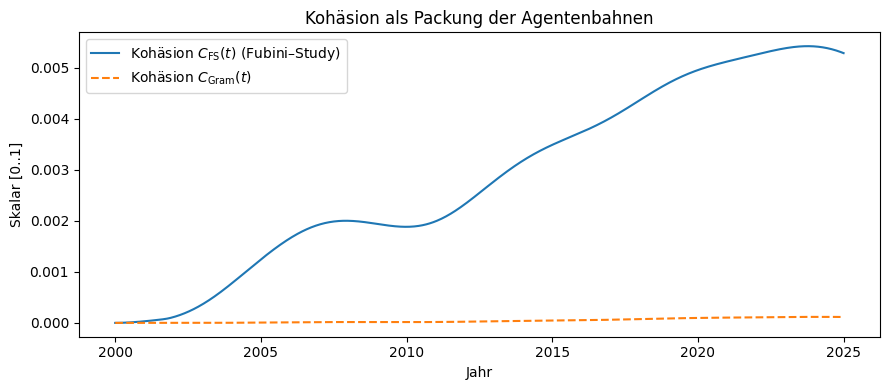

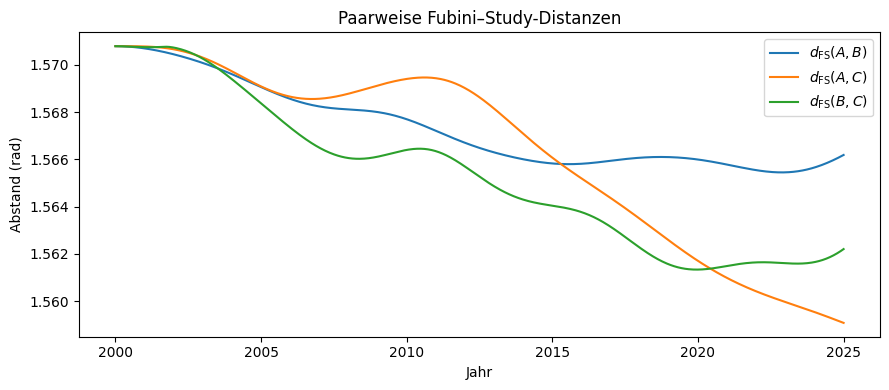

In [ ]:
# =====================================
# 10) Kohäsion als Packung der Agentenbahnen
#      - Fubini-Study-Kohäsion C_FS(t)
#      - Gram-Kohäsion C_Gram(t)
#      - Paarweise Distanzen zum Debug
# =====================================

def fubini_study(psi, phi):
    """Fubini-Study-Abstand d_FS in [0, pi/2] (global phaseninvariant)."""
    ov = np.vdot(psi, phi)
    c = np.clip(np.abs(ov), 0.0, 1.0)
    return float(np.arccos(c))

def gram_cohesion(psis):
    """
    Kohäsion aus Gram-Determinante: C_Gram = 1 - sqrt(det G).
    Heuristisches Packungsmaß: hoch bei 'enger Packung', klein bei 'auseinander'.
    """
    G = np.array([[np.vdot(a, b) for b in psis] for a in psis], dtype=complex)
    G = 0.5*(G + G.conj().T)  # numerisch hermitisieren
    detG = np.real(np.linalg.det(G))
    detG = max(detG, 0.0)     # numerikschutz
    return 1.0 - np.sqrt(detG)

# Zeitreihen berechnen
D_AB = np.zeros_like(t_eval, dtype=float)
D_AC = np.zeros_like(t_eval, dtype=float)
D_BC = np.zeros_like(t_eval, dtype=float)
C_FS = np.zeros_like(t_eval, dtype=float)
C_GR = np.zeros_like(t_eval, dtype=float)

pi_over_2 = 0.5*np.pi

for k in range(len(t_eval)):
    a, b, c = pathA[k], pathB[k], pathC[k]

    d_ab = fubini_study(a, b)
    d_ac = fubini_study(a, c)
    d_bc = fubini_study(b, c)

    D_AB[k], D_AC[k], D_BC[k] = d_ab, d_ac, d_bc

    avg_d = (d_ab + d_ac + d_bc)/3.0
    C_FS[k] = 1.0 - (avg_d / pi_over_2)

    C_GR[k] = gram_cohesion((a, b, c))

# Glättung (optional, auskommentieren falls nicht gewünscht)
# def smooth(y, win=11):
#     if win < 3: return y
#     k = win//2
#     ypad = np.pad(y, (k,k), mode="edge")
#     kernel = np.ones(win)/win
#     return np.convolve(ypad, kernel, mode="valid")
# C_FS_s = smooth(C_FS, win=9)
# C_GR_s = smooth(C_GR, win=9)

# --- Plots ---
plt.figure(figsize=(9,4))
plt.plot(t_eval, C_FS, label=r"Kohäsion $C_{\mathrm{FS}}(t)$ (Fubini–Study)")
plt.plot(t_eval, C_GR, label=r"Kohäsion $C_{\mathrm{Gram}}(t)$", linestyle="--")
plt.xlabel("Jahr"); plt.ylabel("Skalar [0..1]")
plt.title("Kohäsion als Packung der Agentenbahnen")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, D_AB, label=r"$d_{\mathrm{FS}}(A,B)$")
plt.plot(t_eval, D_AC, label=r"$d_{\mathrm{FS}}(A,C)$")
plt.plot(t_eval, D_BC, label=r"$d_{\mathrm{FS}}(B,C)$")
plt.xlabel("Jahr"); plt.ylabel("Abstand (rad)")
plt.title("Paarweise Fubini–Study-Distanzen")
plt.legend(); plt.tight_layout(); plt.show()


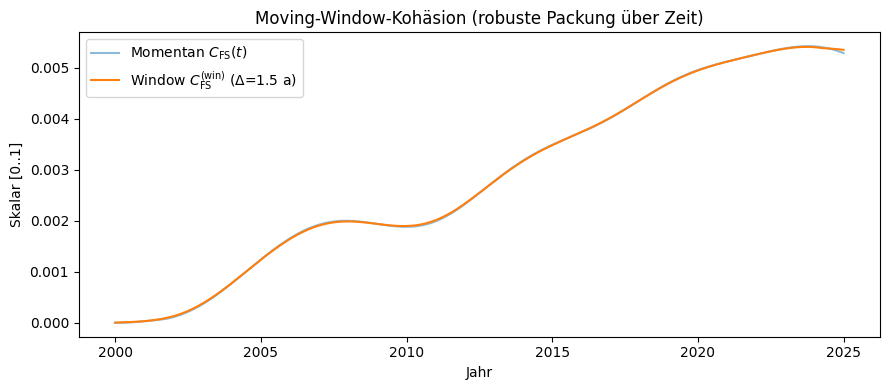

In [ ]:
# ================================
# 11) Moving-Window-Kohäsion
# ================================
WINDOW_YEARS = 1.5  # Fensterbreite Δ (Jahre)

def window_indices(t_eval, t_center, delta):
    half = 0.5*delta
    lo, hi = t_center - half, t_center + half
    return np.where((t_eval >= lo) & (t_eval <= hi))[0]

def pairwise_fs_mean(paths_at_idx):
    # paths_at_idx: Liste von Zuständen [psiA[idx], psiB[idx], ...]
    M = len(paths_at_idx)
    if M < 2: return 1.0
    acc, cnt = 0.0, 0
    for i in range(M):
        for j in range(i+1, M):
            ov = np.vdot(paths_at_idx[i], paths_at_idx[j])
            d  = np.arccos(np.clip(np.abs(ov), 0.0, 1.0))
            acc += d; cnt += 1
    return acc / max(1, cnt)

# Für allgemeine M Agenten unterstützen:
AGENT_PATHS = [pathA, pathB, pathC]  # bei Bedarf erweitern

C_FS_win = np.zeros_like(t_eval, dtype=float)
for k, tcen in enumerate(t_eval):
    idxs = window_indices(t_eval, tcen, WINDOW_YEARS)
    if len(idxs) == 0:
        C_FS_win[k] = np.nan
        continue
    # Mittel der paarweisen FS-Distanzen im Fenster
    acc = 0.0
    for ii in idxs:
        acc += pairwise_fs_mean([P[ii] for P in AGENT_PATHS])
    dbar = acc / len(idxs)
    C_FS_win[k] = 1.0 - dbar / (0.5*np.pi)

plt.figure(figsize=(9,4))
plt.plot(t_eval, C_FS, label=r"Momentan $C_{\mathrm{FS}}(t)$", alpha=0.5)
plt.plot(t_eval, C_FS_win, label=fr"Window $C_{{\mathrm{{FS}}}}^{{(\mathrm{{win}})}}$ (Δ={WINDOW_YEARS} a)")
plt.xlabel("Jahr"); plt.ylabel("Skalar [0..1]")
plt.title("Moving-Window-Kohäsion (robuste Packung über Zeit)")
plt.legend(); plt.tight_layout(); plt.show()


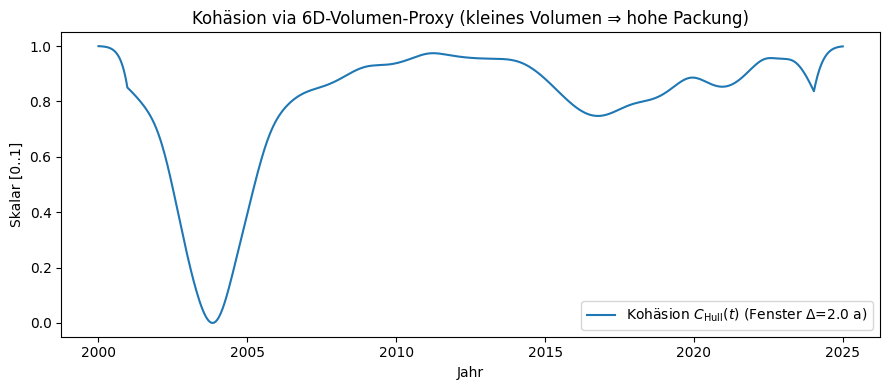

In [ ]:
# ==========================================
# 12) 6D-Embedding + SVD-Volumen-Proxy
# ==========================================
HULL_WINDOW_YEARS = 2.0  # Fensterbreite (Jahre)

def embed6(psi):
    # psi: complex (3,)
    return np.concatenate([psi.real, psi.imag])  # R^6

def window_volume_proxy(tcenter):
    idxs = window_indices(t_eval, tcenter, HULL_WINDOW_YEARS)
    if len(idxs) < 2: return 0.0
    # Sammle alle Agentenpunkte im Fenster
    X = []
    for ii in idxs:
        for P in AGENT_PATHS:
            X.append(embed6(P[ii]))
    X = np.asarray(X)  # (N_pts, 6)
    # Zentriere
    Xc = X - X.mean(axis=0, keepdims=True)
    # SVD
    try:
        s = np.linalg.svd(Xc, compute_uv=False)
    except np.linalg.LinAlgError:
        return 0.0
    # Volumen-Proxy = Produkt der Singulärwerte (numerisch stabil log-weise)
    s = np.clip(s, 1e-15, None)
    return float(np.exp(np.sum(np.log(s))))

V_proxy = np.array([window_volume_proxy(tc) for tc in t_eval])
Vmax = np.nanmax(V_proxy) + 1e-12
C_Hull = 1.0 - V_proxy / Vmax

plt.figure(figsize=(9,4))
plt.plot(t_eval, C_Hull, label=fr"Kohäsion $C_{{\mathrm{{Hull}}}}(t)$ (Fenster Δ={HULL_WINDOW_YEARS} a)")
plt.xlabel("Jahr"); plt.ylabel("Skalar [0..1]")
plt.title("Kohäsion via 6D-Volumen-Proxy (kleines Volumen ⇒ hohe Packung)")
plt.legend(); plt.tight_layout(); plt.show()


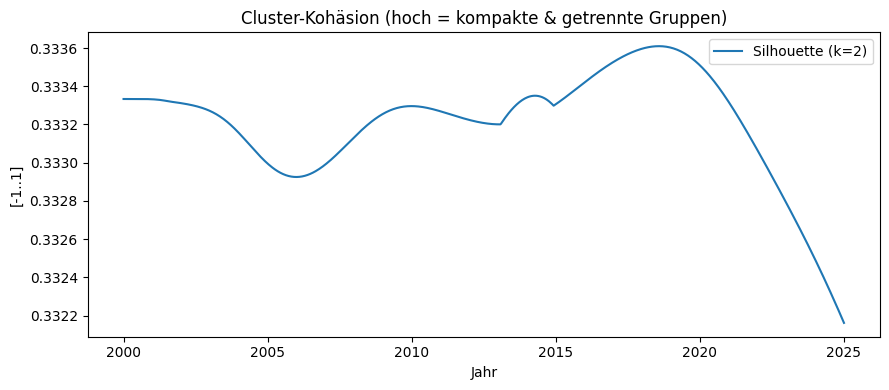

In [ ]:
# ================================================
# 13) Clustering & Silhouette (M > 3 Agenten)
# ================================================
# Vorbereitung: Wenn du zusätzliche Agenten hast, erweitere AGENT_PATHS = [...]
# Hier implementieren wir minimalistisches k-Means + Silhouette (rein NumPy).

def kmeans(X, k, iters=50, seed=0):
    rng = np.random.default_rng(seed)
    n = X.shape[0]
    # init: zufällige k Zentren
    centers = X[rng.choice(n, size=k, replace=False)]
    for _ in range(iters):
        # Zuordnung
        d2 = ((X[:,None,:]-centers[None,:,:])**2).sum(axis=2)  # (n,k)
        labels = np.argmin(d2, axis=1)
        # Zentren aktualisieren
        new_centers = np.array([X[labels==j].mean(axis=0) if np.any(labels==j) else centers[j] for j in range(k)])
        if np.allclose(new_centers, centers): break
        centers = new_centers
    return labels, centers

def silhouette_score(X, labels):
    # euklidische Distanzen
    n = len(X)
    # Vorberechnen Distanzmatrix (n,n)
    D = np.sqrt(((X[:,None,:]-X[None,:,:])**2).sum(axis=2))
    s = np.zeros(n)
    for i in range(n):
        Ci = labels[i]
        inC = (labels==Ci)
        out = ~inC
        # a_i: mittlere Distanz zu eigenem Cluster (ohne i)
        if inC.sum()>1:
            a_i = D[i,inC].sum()/(inC.sum()-1)
        else:
            a_i = 0.0
        # b_i: min mittlere Distanz zu anderem Cluster
        b_i = np.inf
        for Cj in np.unique(labels):
            if Cj==Ci: continue
            mask = (labels==Cj)
            if mask.sum()>0:
                b_i = min(b_i, D[i,mask].mean())
        if not np.isfinite(b_i):
            b_i = 0.0
        denom = max(a_i, b_i)
        s[i] = 0.0 if denom==0 else (b_i - a_i)/denom
    return float(np.mean(s))

# Parameter:
K_CLUSTERS = 2
SEED = 3

Sil = np.zeros_like(t_eval, dtype=float)
for kidx, tt in enumerate(t_eval):
    # X(t): alle Agenten im 6D-Embedding
    X = np.asarray([embed6(P[kidx]) for P in AGENT_PATHS])  # (M,6)
    # Optional: Normierung (sicherstellen)
    # X = X / (np.linalg.norm(X, axis=1, keepdims=True) + 1e-12)
    if len(AGENT_PATHS) < K_CLUSTERS:
        Sil[kidx] = np.nan
        continue
    labels, _ = kmeans(X, K_CLUSTERS, iters=40, seed=SEED)
    Sil[kidx] = silhouette_score(X, labels)

plt.figure(figsize=(9,4))
plt.plot(t_eval, Sil, label=fr"Silhouette (k={K_CLUSTERS})")
plt.xlabel("Jahr"); plt.ylabel("[-1..1]")
plt.title("Cluster-Kohäsion (hoch = kompakte & getrennte Gruppen)")
plt.legend(); plt.tight_layout(); plt.show()


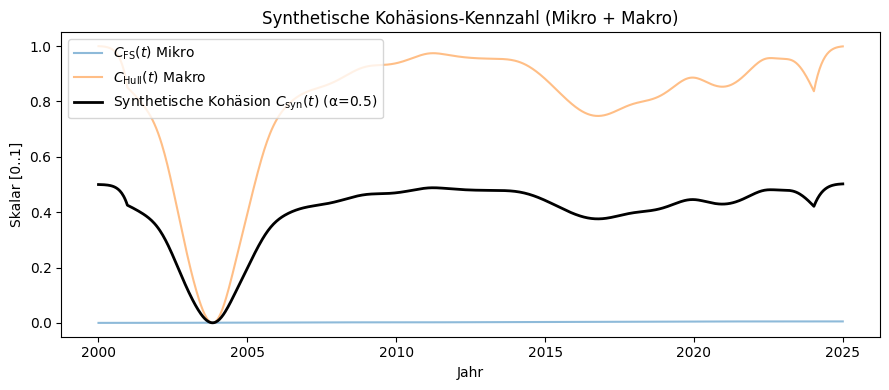

In [ ]:
# =====================================
# 14) Synthetische Kohäsions-Kennzahl
# =====================================

alpha = 0.5  # Gewicht für Mikro-Kohäsion (C_FS)
             # 1-alpha = Gewicht für Makro-Kohäsion (C_Hull)

# Sicherstellen, dass C_FS und C_Hull gleiche Länge und keine NaNs haben
C_FS_norm   = np.nan_to_num(C_FS, nan=0.0, posinf=0.0, neginf=0.0)
C_Hull_norm = np.nan_to_num(C_Hull, nan=0.0, posinf=0.0, neginf=0.0)

C_syn = alpha * C_FS_norm + (1.0 - alpha) * C_Hull_norm

plt.figure(figsize=(9,4))
plt.plot(t_eval, C_FS_norm,   label=r"$C_{\mathrm{FS}}(t)$ Mikro", alpha=0.5)
plt.plot(t_eval, C_Hull_norm, label=r"$C_{\mathrm{Hull}}(t)$ Makro", alpha=0.5)
plt.plot(t_eval, C_syn, color="black", lw=2,
         label=fr"Synthetische Kohäsion $C_{{\mathrm{{syn}}}}(t)$ (α={alpha})")
plt.xlabel("Jahr"); plt.ylabel("Skalar [0..1]")
plt.title("Synthetische Kohäsions-Kennzahl (Mikro + Makro)")
plt.legend(); plt.tight_layout(); plt.show()


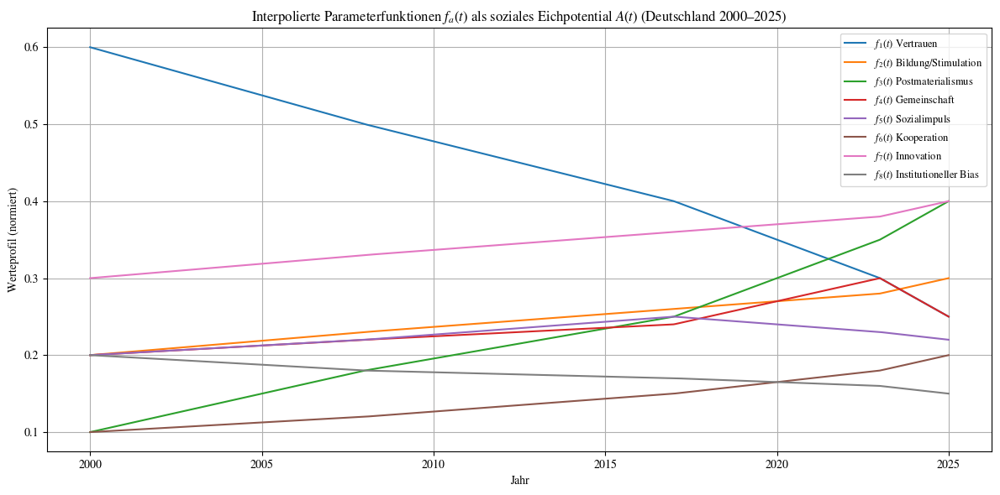

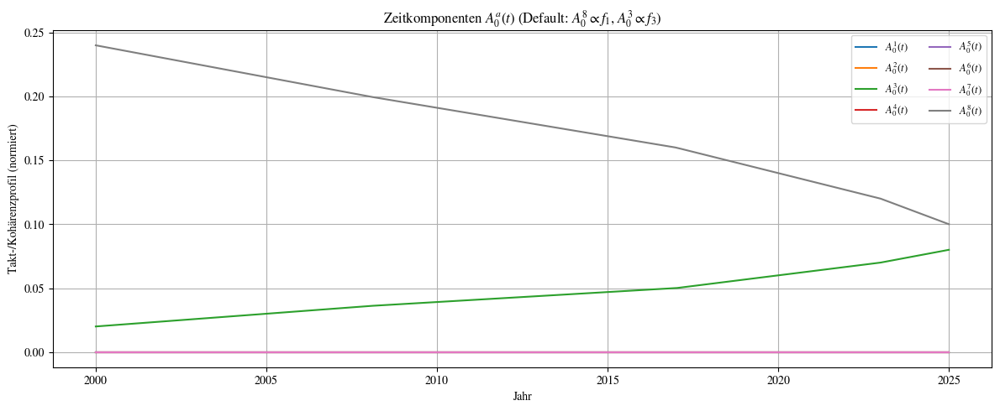

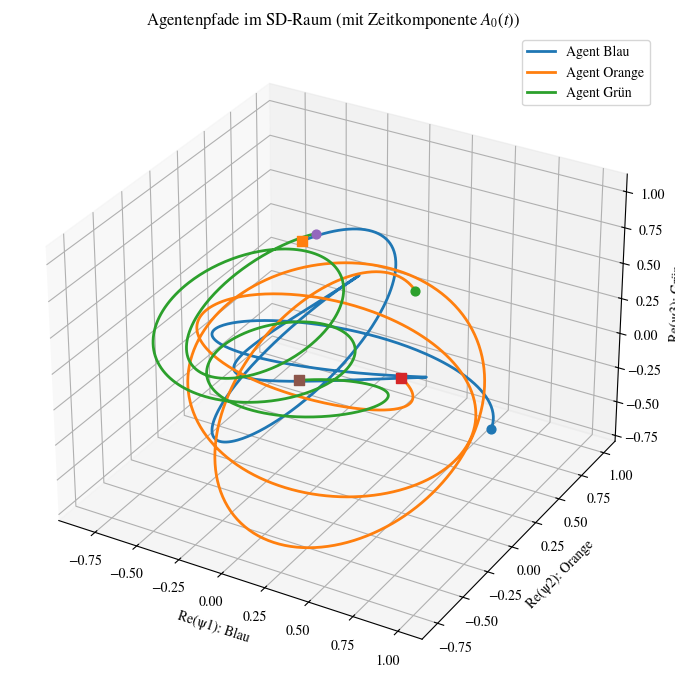

Pancharatnam-Phasen (rad):  A=-1.9713, B=-1.4468, C=-2.9265
Pancharatnam-Phasen (deg):  A=-112.95, B=-82.90, C=-167.68
Open-path Berry-Summen (rad):  A=-1.1468, B=2.1557, C=-1.0080
Open-path Berry-Summen (deg):  A=-65.71, B=123.51, C=-57.75


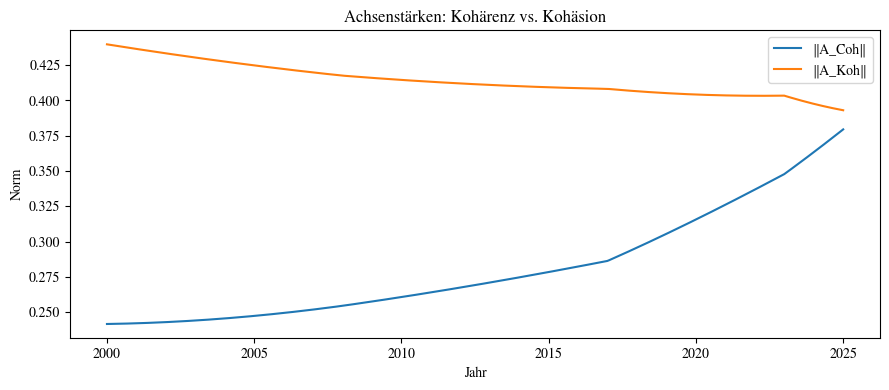

/tmp/ipython-input-4195295562.py:301: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  plt.legend(); plt.tight_layout(); plt.show()
/tmp/ipython-input-4195295562.py:301: UserWarning: Glyph 550 (\N{LATIN CAPITAL LETTER A WITH DOT ABOVE}) missing from font(s) STIXGeneral.
  plt.legend(); plt.tight_layout(); plt.show()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 550 (\N{LATIN CAPITAL LETTER A WITH DOT ABOVE}) missing from font(s) STIXGeneral.
  fig.canvas.print_figure(bytes_io, **kw)


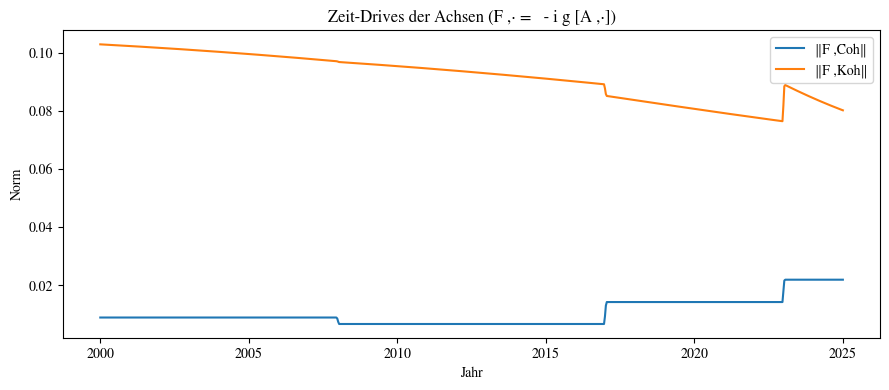

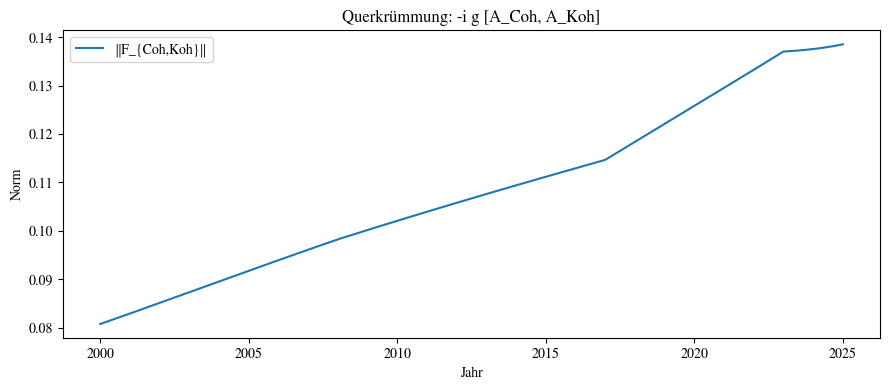

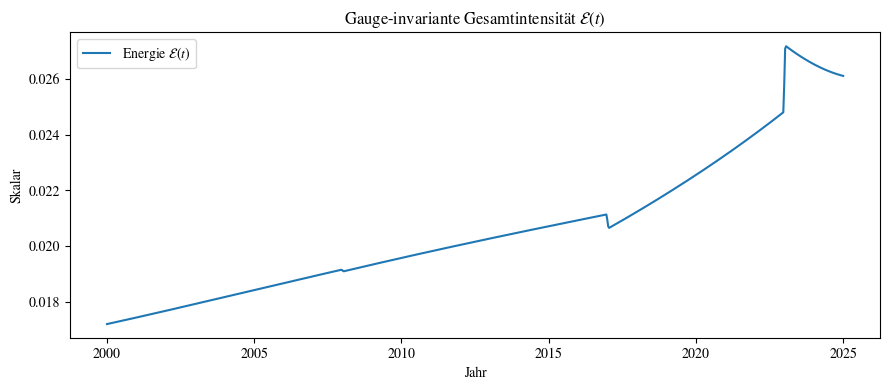

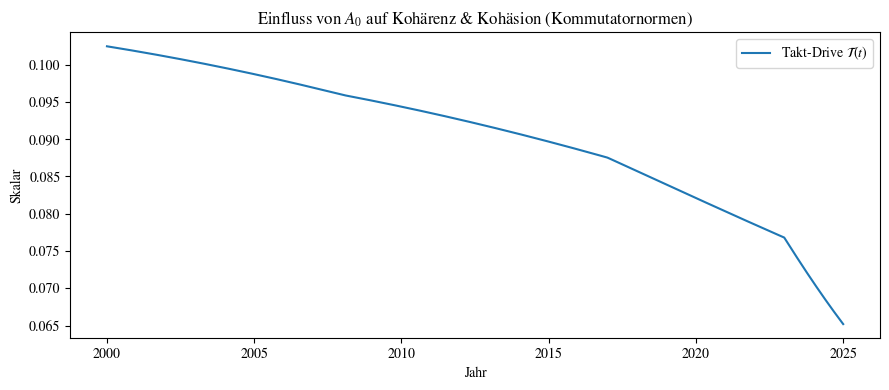

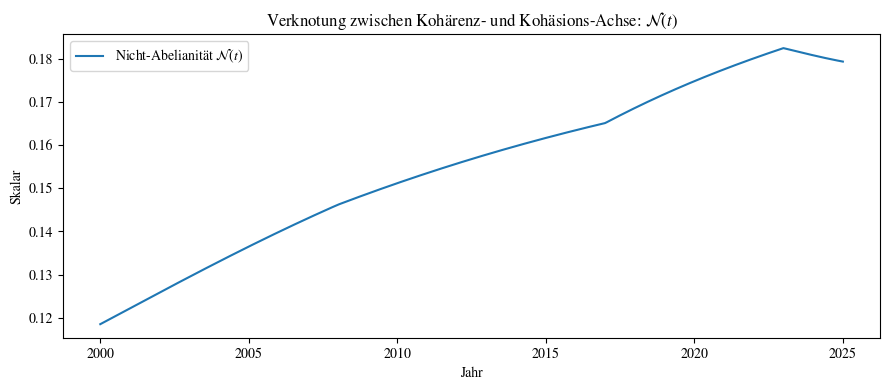

In [ ]:
# -*- coding: utf-8 -*-
# SD-Schroedinger + Feldtensoren (0+1D, homogen)
# - Externe Parameterfunktionen f1..f8 -> A(t) = Sum f_a(t) * λ_a
# - Zeitkomponenten A0^a(t) -> A0(t) = Sum a0_a(t) * λ_a
# - Kohärenz- & Kohäsions-Achsen als Projektionen im SU(3)-Farbraum
# - Feldstärken: F_{0,Coh}, F_{0,Koh}, F_{Coh,Koh}
# - Visualisierungen: f_a(t), A0^a(t), Agentenpfade, Achsenstärken, Zeit-Drives, Querkrümmung, KPIs

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp

import matplotlib as mpl
mpl.rcParams['mathtext.fontset'] = 'stix'   # gute Mathe-Schriften
mpl.rcParams['font.family'] = 'STIXGeneral' # optional, einheitlicher Look


# =====================================
# 0) Parameterfunktionen f1..f8 (vom Nutzer vorgegeben)
# =====================================
years = np.array([2000, 2008, 2017, 2023, 2025], dtype=float)

f1_vals = np.array([0.6, 0.5, 0.4, 0.3, 0.25], dtype=float)   # Vertrauen
f2_vals = np.array([0.2, 0.23, 0.26, 0.28, 0.3 ], dtype=float)  # Bildung/Stimulation
f3_vals = np.array([0.1, 0.18, 0.25, 0.35, 0.4 ], dtype=float)  # Postmaterialismus (hier: Ordnung/Markt-Achse)
f4_vals = np.array([0.2, 0.22, 0.24, 0.30, 0.25], dtype=float)  # Gemeinschaft (z. B. Covid-Peak)
f5_vals = np.array([0.2, 0.22, 0.25, 0.23, 0.22], dtype=float)  # Sozialimpuls
f6_vals = np.array([0.1, 0.12, 0.15, 0.18, 0.2 ], dtype=float)  # Kooperation
f7_vals = np.array([0.3, 0.33, 0.36, 0.38, 0.4 ], dtype=float)  # Innovation
f8_vals = np.array([0.2, 0.18, 0.17, 0.16, 0.15], dtype=float)  # institutioneller Bias

# Interpolationsfunktionen (linear, mit Extrapolation)
f1 = interp1d(years, f1_vals, kind='linear', fill_value='extrapolate')
f2 = interp1d(years, f2_vals, kind='linear', fill_value='extrapolate')
f3 = interp1d(years, f3_vals, kind='linear', fill_value='extrapolate')
f4 = interp1d(years, f4_vals, kind='linear', fill_value='extrapolate')
f5 = interp1d(years, f5_vals, kind='linear', fill_value='extrapolate')
f6 = interp1d(years, f6_vals, kind='linear', fill_value='extrapolate')
f7 = interp1d(years, f7_vals, kind='linear', fill_value='extrapolate')
f8 = interp1d(years, f8_vals, kind='linear', fill_value='extrapolate')

def f_components(t: float) -> np.ndarray:
    """Rückgabe der 8 Komponenten f_a(t) als numpy-Array."""
    return np.array([
        float(f1(t)), float(f2(t)), float(f3(t)), float(f4(t)),
        float(f5(t)), float(f6(t)), float(f7(t)), float(f8(t))
    ], dtype=float)

# =====================================
# 0b) Zeitkomponenten A0 – acht a0_a(t) (Defaults: justierbar)
#    - A0^8: globaler Zeit-/Vertrauenstakt (aus f1 skaliert)
#    - A0^3: Ordnung/Markt-Zeitmodus (aus f3 skaliert)
#    - rest: 0 (später datenbasiert befüllbar)
# =====================================
scale_8 = 0.4
scale_3 = 0.2

zeros = np.zeros_like(years)
a0_1 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_2 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_3 = interp1d(years, scale_3 * f3_vals, kind='linear', fill_value='extrapolate')
a0_4 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_5 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_6 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_7 = interp1d(years, zeros, kind='linear', fill_value='extrapolate')
a0_8 = interp1d(years, scale_8 * f1_vals, kind='linear', fill_value='extrapolate')

def a0_components(t: float) -> np.ndarray:
    return np.array([
        float(a0_1(t)), float(a0_2(t)), float(a0_3(t)), float(a0_4(t)),
        float(a0_5(t)), float(a0_6(t)), float(a0_7(t)), float(a0_8(t))
    ], dtype=float)

# =====================================
# 1) Plots: f_a(t) und A0_a(t)
# =====================================
t_plot = np.linspace(2000, 2025, 500)
fa_stack  = np.array([f_components(tt)  for tt in t_plot])
a0_stack  = np.array([a0_components(tt) for tt in t_plot])

plt.figure(figsize=(12, 6))
labels_f = [
    r"$f_1(t)$ Vertrauen", r"$f_2(t)$ Bildung/Stimulation",
    r"$f_3(t)$ Postmaterialismus", r"$f_4(t)$ Gemeinschaft",
    r"$f_5(t)$ Sozialimpuls", r"$f_6(t)$ Kooperation",
    r"$f_7(t)$ Innovation", r"$f_8(t)$ Institutioneller Bias"
]
for i in range(8):
    plt.plot(t_plot, fa_stack[:, i], label=labels_f[i])
plt.title(r"Interpolierte Parameterfunktionen $f_a(t)$ als soziales Eichpotential $A(t)$ (Deutschland 2000–2025)")
plt.xlabel("Jahr"); plt.ylabel("Werteprofil (normiert)")
plt.grid(True); plt.legend(loc="upper right", fontsize=9); plt.tight_layout(); plt.show()

plt.figure(figsize=(12, 5))
labels_a0 = [fr"$A_0^{a+1}(t)$" for a in range(8)]
for i in range(8):
    plt.plot(t_plot, a0_stack[:, i], label=labels_a0[i])
plt.title(r"Zeitkomponenten $A_0^a(t)$ (Default: $A_0^8\propto f_1$, $A_0^3\propto f_3$)")
plt.xlabel("Jahr"); plt.ylabel("Takt-/Kohärenzprofil (normiert)")
plt.grid(True); plt.legend(loc="upper right", ncol=2, fontsize=9); plt.tight_layout(); plt.show()

# =====================================
# 2) SU(3)-Generatoren (Gell-Mann-Matrizen)
#    (hier als λ_a, wie in deinem Originalcode; keine 1/2-Faktoren)
# =====================================
λ1 = np.array([[0,1,0],[1,0,0],[0,0,0]], complex)
λ2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], complex)
λ3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], complex)
λ4 = np.array([[0,0,1],[0,0,0],[1,0,0]], complex)
λ5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], complex)
λ6 = np.array([[0,0,0],[0,0,1],[0,1,0]], complex)
λ7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], complex)
λ8 = (1/np.sqrt(3)) * np.diag([1,1,-2])
generators = [λ1,λ2,λ3,λ4,λ5,λ6,λ7,λ8]

def A_from_components(components: np.ndarray) -> np.ndarray:
    A = np.zeros((3,3), dtype=complex)
    for a in range(8):
        A = A + components[a] * generators[a]
    return A

# =====================================
# 3) Hamiltonian H(t) = g * A(t); A0(t) separat
#    Kovarianter Zeitableiter: i d/dt ψ = [ H(t) - g0 A0(t) ] ψ
# =====================================
g  = 1.0
g0 = 1.0

def A_of_t(t: float)  -> np.ndarray: return A_from_components(f_components(t))
def A0_of_t(t: float) -> np.ndarray: return A_from_components(a0_components(t))
def H_of_t(t: float)  -> np.ndarray: return g * A_of_t(t)

# =====================================
# 4) Schrödingerdynamik
# =====================================
def schrodinger_rhs_with_A0(t, psi_flat):
    psi = psi_flat[:3] + 1j*psi_flat[3:]
    H = H_of_t(t) - g0 * A0_of_t(t)
    dpsi = -1j * H @ psi
    return np.concatenate([dpsi.real, dpsi.imag])

# Zeitachse
t0, t1 = 2000.0, 2025.0
t_eval = np.linspace(t0, t1, 800)

# Startzustände
psiA0 = np.array([1,0,0], complex)  # Blau
psiB0 = np.array([0,1,0], complex)  # Orange
psiC0 = np.array([0,0,1], complex)  # Grün

def evolve_with_A0(psi0: np.ndarray):
    y0 = np.concatenate([psi0.real, psi0.imag])
    sol = solve_ivp(
        schrodinger_rhs_with_A0, [t0, t1], y0, t_eval=t_eval,
        rtol=1e-8, atol=1e-10, method='DOP853'
    )
    psi_t = sol.y[:3, :] + 1j*sol.y[3:, :]
    norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    psi_t = psi_t / norms
    return sol.t, psi_t.T

tA, pathA = evolve_with_A0(psiA0)
tB, pathB = evolve_with_A0(psiB0)
tC, pathC = evolve_with_A0(psiC0)

# =====================================
# 5) Phasen (Pancharatnam & Open-path Berry-artig)
# =====================================
def pancharatnam_phase(psi_path: np.ndarray) -> float:
    z = np.vdot(psi_path[0], psi_path[-1])
    return float(np.angle(z))

def berry_like_open_phase(psi_path: np.ndarray) -> float:
    ph = 0.0
    for k in range(len(psi_path)-1):
        z = np.vdot(psi_path[k], psi_path[k+1])
        if abs(z) > 1e-12:
            ph += float(np.angle(z))
    return ph

pan_A = pancharatnam_phase(pathA); berr_A = berry_like_open_phase(pathA)
pan_B = pancharatnam_phase(pathB); berr_B = berry_like_open_phase(pathB)
pan_C = pancharatnam_phase(pathC); berr_C = berry_like_open_phase(pathC)

# =====================================
# 6) Visualisierung der Agentenpfade (3D, Realteile)
# =====================================
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')

for path, lab in [(pathA, 'Agent Blau'), (pathB, 'Agent Orange'), (pathC, 'Agent Grün')]:
    X, Y, Z = path.real.T
    ax.plot(X, Y, Z, lw=2, label=lab)
    ax.scatter(X[0], Y[0], Z[0], s=40, marker='o')
    ax.scatter(X[-1], Y[-1], Z[-1], s=60, marker='s')

ax.set_xlabel('Re(ψ1): Blau'); ax.set_ylabel('Re(ψ2): Orange'); ax.set_zlabel('Re(ψ3): Grün')
ax.set_title('Agentenpfade im SD-Raum (mit Zeitkomponente $A_0(t)$)')
ax.legend(); plt.tight_layout(); plt.show()

print("Pancharatnam-Phasen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(pan_A, pan_B, pan_C))
print("Pancharatnam-Phasen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([pan_A, pan_B, pan_C])
))
print("Open-path Berry-Summen (rad):  A={:.4f}, B={:.4f}, C={:.4f}".format(berr_A, berr_B, berr_C))
print("Open-path Berry-Summen (deg):  A={:.2f}, B={:.2f}, C={:.2f}".format(
    *np.degrees([berr_A, berr_B, berr_C])
))

# =====================================
# 7) Kohärenz & Kohäsion: Projektionen + Feldtensoren
# =====================================

# Hilfsfunktionen
def comm(A, B):  # Matrixkommutator
    return A @ B - B @ A

def frob_norm(M):
    return np.sqrt(np.real(np.trace(M.conj().T @ M)))

# Projektor-Gewichte (heuristisch; einfach anpassbar)
# Kohärenz: Cartan-getrieben (λ3, λ8) -> legt Takt/Zeitkohärenz fest
u_coh = np.array([0,0,0.6,0,0,0,0,0.8], dtype=float)
u_coh = u_coh / np.linalg.norm(u_coh)

# Kohäsion: Bindungs-Paare (λ1,2,4,5,6,7) -> Werte-Zusammenhalt
v_koh = np.array([1,1,0,1,1,1,1,0], dtype=float)
v_koh = v_koh / np.linalg.norm(v_koh)

# Zeitgitter für Feldtensor-Berechnung = t_eval
def A_axis_from_weights(weights, tgrid):
    """A_axis(t) = Sum_a weights[a] * f_a(t) * λ_a  (Liste von 3x3-Matrizen)"""
    mats = []
    for tt in tgrid:
        comps = weights * f_components(tt)  # gewichtete Komponenten
        mats.append(A_from_components(comps))
    return np.array(mats)  # shape (T,3,3)

A_coh = A_axis_from_weights(u_coh, t_eval)
A_koh = A_axis_from_weights(v_koh, t_eval)
A0_seq = np.array([A0_of_t(tt) for tt in t_eval])

# Zeitableitungen (zentrale Differenzen)
dt = t_eval[1] - t_eval[0]
def time_derivative(A_seq):
    dA = np.zeros_like(A_seq, dtype=complex)
    dA[1:-1] = (A_seq[2:] - A_seq[:-2])/(2*dt)
    dA[0]    = (A_seq[1]  - A_seq[0]) / dt
    dA[-1]   = (A_seq[-1] - A_seq[-2]) / dt
    return dA

dA_coh = time_derivative(A_coh)
dA_koh = time_derivative(A_koh)

gYM = 1.0  # Kopplung für Feldtensoren (ggf. separat justieren)

# Feldstärken (0+1D, homogen)
F0_coh     = dA_coh - 1j*gYM*np.array([comm(A0_seq[i], A_coh[i]) for i in range(len(t_eval))])
F0_koh     = dA_koh - 1j*gYM*np.array([comm(A0_seq[i], A_koh[i]) for i in range(len(t_eval))])
F_coh_koh  = -1j*gYM*np.array([comm(A_coh[i], A_koh[i]) for i in range(len(t_eval))])

# Normen / KPIs
norm_A_coh     = np.array([frob_norm(A_coh[i])     for i in range(len(t_eval))])
norm_A_koh     = np.array([frob_norm(A_koh[i])     for i in range(len(t_eval))])
norm_F0_coh    = np.array([frob_norm(F0_coh[i])    for i in range(len(t_eval))])
norm_F0_koh    = np.array([frob_norm(F0_koh[i])    for i in range(len(t_eval))])
norm_F_ck      = np.array([frob_norm(F_coh_koh[i]) for i in range(len(t_eval))])

# Energie (eichinvariant in diesem 0+1D-Setup)
E_t = norm_F0_coh**2 + norm_F0_koh**2 + norm_F_ck**2

# Takt-Drive = Einfluss von A0 auf die Achsen (reine Kommutatornorm)
T_drive = np.array([frob_norm(comm(A0_seq[i], A_coh[i])) + frob_norm(comm(A0_seq[i], A_koh[i]))
                    for i in range(len(t_eval))])

# Nicht-Abelianitäts-Index: Verknotung zwischen Achsen
eps = 1e-12
N_index = norm_F_ck / (norm_A_coh + norm_A_koh + eps)

# =====================================
# 8) Visualisierungen der Feldtensor-Diagnostik
# =====================================

# Achsenstärken
plt.figure(figsize=(9,4))
plt.plot(t_eval, norm_A_coh, label="‖A_Coh‖")
plt.plot(t_eval, norm_A_koh, label="‖A_Koh‖")
plt.xlabel("Jahr"); plt.ylabel("Norm")
plt.title("Achsenstärken: Kohärenz vs. Kohäsion")
plt.legend(); plt.tight_layout(); plt.show()

# Zeit-Drives (inkl. -i g [A0, ⋅])
plt.figure(figsize=(9,4))
plt.plot(t_eval, norm_F0_coh, label="‖F₀,Coh‖")
plt.plot(t_eval, norm_F0_koh, label="‖F₀,Koh‖")
plt.xlabel("Jahr"); plt.ylabel("Norm")
plt.title("Zeit-Drives der Achsen (F₀,⋅ = Ȧ - i g [A₀,⋅])")
plt.legend(); plt.tight_layout(); plt.show()

# Querkrümmung (Stress zwischen Takt & Zusammenhalt)
plt.figure(figsize=(9,4))
plt.plot(t_eval, norm_F_ck, label="‖F_{Coh,Koh}‖")
plt.xlabel("Jahr"); plt.ylabel("Norm")
plt.title("Querkrümmung: -i g [A_Coh, A_Koh]")
plt.legend(); plt.tight_layout(); plt.show()

# KPIs: Energie, Takt-Drive, Nicht-Abelianität
plt.figure(figsize=(9,4))
plt.plot(t_eval, E_t, label=r"Energie $\mathcal{E}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Gauge-invariante Gesamtintensität $\mathcal{E}(t)$")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, T_drive, label=r"Takt-Drive $\mathcal{T}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Einfluss von $A_0$ auf Kohärenz & Kohäsion (Kommutatornormen)")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, N_index, label=r"Nicht-Abelianität $\mathcal{N}(t)$")
plt.xlabel("Jahr"); plt.ylabel("Skalar")
plt.title(r"Verknotung zwischen Kohärenz- und Kohäsions-Achse: $\mathcal{N}(t)$")
plt.legend(); plt.tight_layout(); plt.show()



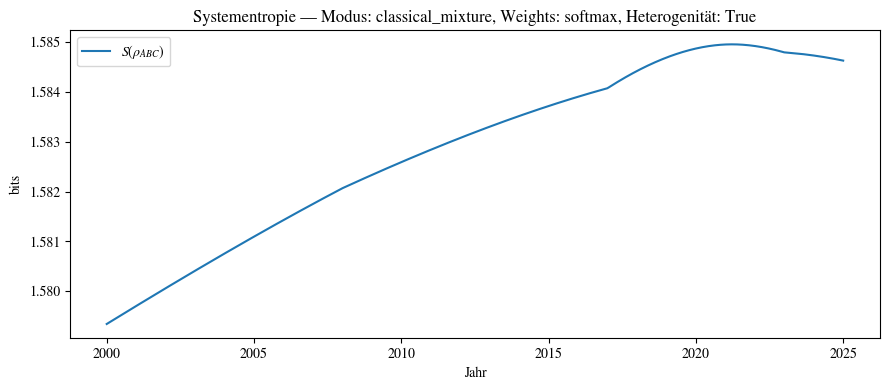

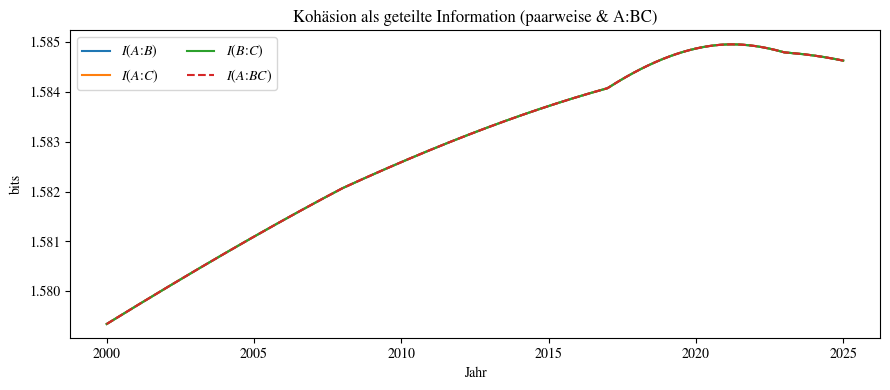

In [ ]:
# =========================================================
# 8) NEU: Von-Neumann-Entropie & Mutual Information — ZEITABHÄNGIG
# =========================================================

# ---- Gewichtungen der Zweige (Zeitabhängig via Softmax) ----
WEIGHTING_MODE = "softmax"  # "softmax" | "static"
softmax_temperature = 3.0

def branch_weights_of_time(t):
    if WEIGHTING_MODE == "static":
        w = np.array([1.0, 1.0, 1.0], dtype=float)
    else:
        # Beispiel: 3 "Sozial-Cluster" aus f_a(t)
        xA = abs(f1(t)) + abs(f2(t))          # Vertrauen+Bildung
        xB = abs(f3(t)) + abs(f4(t))          # Postmaterialismus+Gemeinschaft
        xC = abs(f5(t)) + abs(f6(t)) + 0.5*abs(f7(t))  # Sozialimpuls+Kooperation+Innovation
        x  = np.array([xA, xB, xC], dtype=float)
        x  = x / (np.max(x) + 1e-12)
        # Softmax mit Temperatur -> glatte Zeitabhängigkeit
        z  = x/softmax_temperature
        e  = np.exp(z - np.max(z))
        w  = e / np.sum(e)
    return w

# ---- Dichte-Tools ----
def density_from_state(psi):
    psi = psi.reshape(-1, 1)
    return psi @ psi.conj().T

def von_neumann_entropy(rho, base=2):
    rhoH = 0.5*(rho + rho.conj().T)
    w, _ = np.linalg.eigh(rhoH)
    w = np.clip(np.real(w), 0.0, 1.0)
    nz = w[w > 1e-14]
    log = np.log2 if base == 2 else (np.log if base == np.e else lambda x: np.log(x)/np.log(base))
    return float(-np.sum(nz * log(nz)))

def kron3(a, b, c):
    return np.kron(np.kron(a, b), c)

def ptrace(rho, dims, keep):
    keep = tuple(sorted(keep))
    n = len(dims)
    keep_bar = tuple(i for i in range(n) if i not in keep)
    perm = keep + keep_bar + tuple(n + i for i in keep) + tuple(n + i for i in keep_bar)
    rho_t = rho.reshape(dims + dims).transpose(perm)
    dkeep = int(np.prod([dims[i] for i in keep]))
    dbar  = int(np.prod([dims[i] for i in keep_bar]))
    rho_t = rho_t.reshape(dkeep, dbar, dkeep, dbar)
    red = np.einsum('ikjk->ij', rho_t)
    red = 0.5*(red + red.conj().T)
    tr = np.trace(red)
    if abs(tr) > 1e-14:
        red = red / tr
    return red

# ---- Kohäsions-Modus ----
COHESION_MODE = "classical_mixture"   # "classical_mixture" | "entangled_ghz_like"
PHI_B = 0.0
PHI_C = 0.0

def build_joint_density(psiA, psiB, psiC, t, mode="classical_mixture",
                        phi_b=0.0, phi_c=0.0):
    w = branch_weights_of_time(t)  # <- zeitabhängig
    if mode == "classical_mixture":
        rho = np.zeros((27, 27), dtype=complex)
        for wk, psi in zip(w, (psiA, psiB, psiC)):
            psi_ABC = kron3(psi, psi, psi)
            rho += wk * density_from_state(psi_ABC)
        rho = 0.5*(rho + rho.conj().T)
        tr = np.trace(rho)
        if abs(tr-1) > 1e-12:
            rho = rho / tr
        return rho
    elif mode == "entangled_ghz_like":
        a = np.sqrt(w[0]) * kron3(psiA, psiA, psiA)
        b = np.sqrt(w[1]) * np.exp(1j*phi_b) * kron3(psiB, psiB, psiB)
        c = np.sqrt(w[2]) * np.exp(1j*phi_c) * kron3(psiC, psiC, psiC)
        Psi = a + b + c
        nrm = np.sqrt(np.vdot(Psi, Psi))
        if nrm > 1e-14: Psi = Psi / nrm
        rho = density_from_state(Psi)
        rho = 0.5*(rho + rho.conj().T)
        return rho
    else:
        raise ValueError("Unknown mode")

dims = [3,3,3]

S_total = np.zeros_like(t_eval, dtype=float)
I_A_BC  = np.zeros_like(t_eval, dtype=float)
I_AB    = np.zeros_like(t_eval, dtype=float)
I_AC    = np.zeros_like(t_eval, dtype=float)
I_BC    = np.zeros_like(t_eval, dtype=float)

for idx, tt in enumerate(t_eval):
    psiA = pathA[idx]
    psiB = pathB[idx]
    psiC = pathC[idx]

    rhoABC = build_joint_density(psiA, psiB, psiC, tt, mode=COHESION_MODE, phi_b=PHI_B, phi_c=PHI_C)

    rhoA  = ptrace(rhoABC, dims, keep=(0,))
    rhoB  = ptrace(rhoABC, dims, keep=(1,))
    rhoC  = ptrace(rhoABC, dims, keep=(2,))
    rhoAB = ptrace(rhoABC, dims, keep=(0,1))
    rhoAC = ptrace(rhoABC, dims, keep=(0,2))
    rhoBC = ptrace(rhoABC, dims, keep=(1,2))

    S_tot = von_neumann_entropy(rhoABC, base=2)
    S_A   = von_neumann_entropy(rhoA,   base=2)
    S_B   = von_neumann_entropy(rhoB,   base=2)
    S_C   = von_neumann_entropy(rhoC,   base=2)
    S_ABv = von_neumann_entropy(rhoAB,  base=2)
    S_ACv = von_neumann_entropy(rhoAC,  base=2)
    S_BCv = von_neumann_entropy(rhoBC,  base=2)

    I_A_B  = S_A + S_B - S_ABv
    I_A_C  = S_A + S_C - S_ACv
    I_B_C  = S_B + S_C - S_BCv
    I_A_Bc = S_A + S_BCv - S_tot

    S_total[idx] = S_tot
    I_AB[idx]    = I_A_B
    I_AC[idx]    = I_A_C
    I_BC[idx]    = I_B_C
    I_A_BC[idx]  = I_A_Bc

# ---- Plots: Entropie & Mutual Information (ZEITABHÄNGIG) ----
plt.figure(figsize=(9,4))
plt.plot(t_eval, S_total, label=r"$S(\rho_{ABC})$")
plt.xlabel("Jahr"); plt.ylabel("bits")
plt.title(f"Systementropie — Modus: {COHESION_MODE}, Weights: {WEIGHTING_MODE}, Heterogenität: {AGENT_HETEROGENEITY}")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, I_AB,   label=r"$I(A\!:\!B)$")
plt.plot(t_eval, I_AC,   label=r"$I(A\!:\!C)$")
plt.plot(t_eval, I_BC,   label=r"$I(B\!:\!C)$")
plt.plot(t_eval, I_A_BC, label=r"$I(A\!:\!BC)$", linestyle="--")
plt.xlabel("Jahr"); plt.ylabel("bits")
plt.title("Kohäsion als geteilte Information (paarweise & A:BC)")
plt.legend(ncol=2); plt.tight_layout(); plt.show()


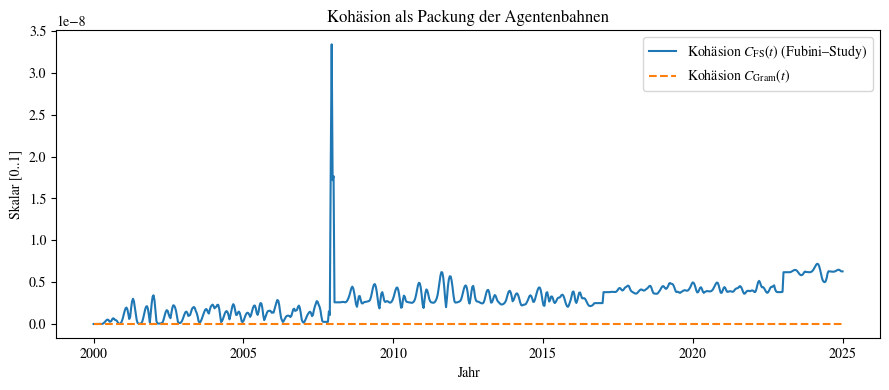

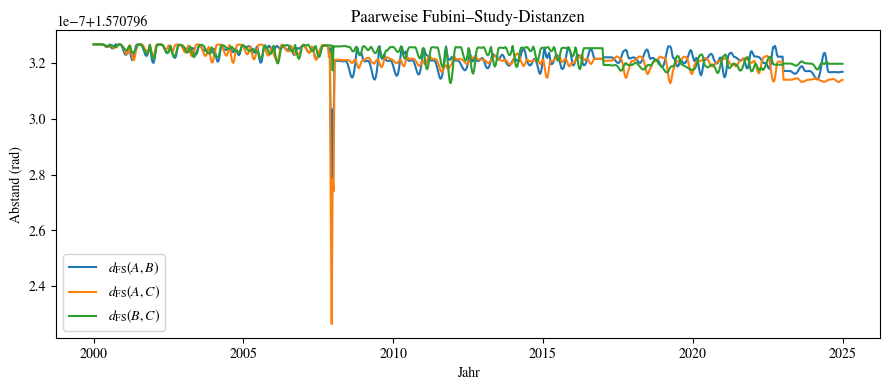

In [ ]:
# =====================================
# 10) Kohäsion als Packung der Agentenbahnen
#      - Fubini-Study-Kohäsion C_FS(t)
#      - Gram-Kohäsion C_Gram(t)
#      - Paarweise Distanzen zum Debug
# =====================================

def fubini_study(psi, phi):
    """Fubini-Study-Abstand d_FS in [0, pi/2] (global phaseninvariant)."""
    ov = np.vdot(psi, phi)
    c = np.clip(np.abs(ov), 0.0, 1.0)
    return float(np.arccos(c))

def gram_cohesion(psis):
    """
    Kohäsion aus Gram-Determinante: C_Gram = 1 - sqrt(det G).
    Heuristisches Packungsmaß: hoch bei 'enger Packung', klein bei 'auseinander'.
    """
    G = np.array([[np.vdot(a, b) for b in psis] for a in psis], dtype=complex)
    G = 0.5*(G + G.conj().T)  # numerisch hermitisieren
    detG = np.real(np.linalg.det(G))
    detG = max(detG, 0.0)     # numerikschutz
    return 1.0 - np.sqrt(detG)

# Zeitreihen berechnen
D_AB = np.zeros_like(t_eval, dtype=float)
D_AC = np.zeros_like(t_eval, dtype=float)
D_BC = np.zeros_like(t_eval, dtype=float)
C_FS = np.zeros_like(t_eval, dtype=float)
C_GR = np.zeros_like(t_eval, dtype=float)

pi_over_2 = 0.5*np.pi

for k in range(len(t_eval)):
    a, b, c = pathA[k], pathB[k], pathC[k]

    d_ab = fubini_study(a, b)
    d_ac = fubini_study(a, c)
    d_bc = fubini_study(b, c)

    D_AB[k], D_AC[k], D_BC[k] = d_ab, d_ac, d_bc

    avg_d = (d_ab + d_ac + d_bc)/3.0
    C_FS[k] = 1.0 - (avg_d / pi_over_2)

    C_GR[k] = gram_cohesion((a, b, c))

# Glättung (optional, auskommentieren falls nicht gewünscht)
# def smooth(y, win=11):
#     if win < 3: return y
#     k = win//2
#     ypad = np.pad(y, (k,k), mode="edge")
#     kernel = np.ones(win)/win
#     return np.convolve(ypad, kernel, mode="valid")
# C_FS_s = smooth(C_FS, win=9)
# C_GR_s = smooth(C_GR, win=9)

# --- Plots ---
plt.figure(figsize=(9,4))
plt.plot(t_eval, C_FS, label=r"Kohäsion $C_{\mathrm{FS}}(t)$ (Fubini–Study)")
plt.plot(t_eval, C_GR, label=r"Kohäsion $C_{\mathrm{Gram}}(t)$", linestyle="--")
plt.xlabel("Jahr"); plt.ylabel("Skalar [0..1]")
plt.title("Kohäsion als Packung der Agentenbahnen")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(9,4))
plt.plot(t_eval, D_AB, label=r"$d_{\mathrm{FS}}(A,B)$")
plt.plot(t_eval, D_AC, label=r"$d_{\mathrm{FS}}(A,C)$")
plt.plot(t_eval, D_BC, label=r"$d_{\mathrm{FS}}(B,C)$")
plt.xlabel("Jahr"); plt.ylabel("Abstand (rad)")
plt.title("Paarweise Fubini–Study-Distanzen")
plt.legend(); plt.tight_layout(); plt.show()


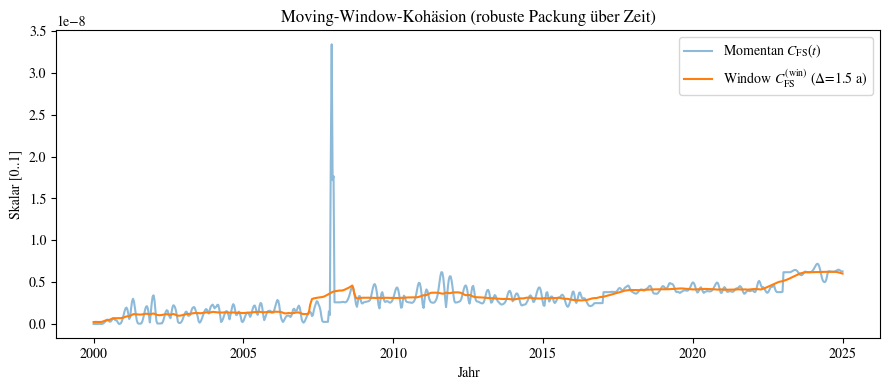

In [ ]:
# ================================
# 11) Moving-Window-Kohäsion
# ================================
WINDOW_YEARS = 1.5  # Fensterbreite Δ (Jahre)

def window_indices(t_eval, t_center, delta):
    half = 0.5*delta
    lo, hi = t_center - half, t_center + half
    return np.where((t_eval >= lo) & (t_eval <= hi))[0]

def pairwise_fs_mean(paths_at_idx):
    # paths_at_idx: Liste von Zuständen [psiA[idx], psiB[idx], ...]
    M = len(paths_at_idx)
    if M < 2: return 1.0
    acc, cnt = 0.0, 0
    for i in range(M):
        for j in range(i+1, M):
            ov = np.vdot(paths_at_idx[i], paths_at_idx[j])
            d  = np.arccos(np.clip(np.abs(ov), 0.0, 1.0))
            acc += d; cnt += 1
    return acc / max(1, cnt)

# Für allgemeine M Agenten unterstützen:
AGENT_PATHS = [pathA, pathB, pathC]  # bei Bedarf erweitern

C_FS_win = np.zeros_like(t_eval, dtype=float)
for k, tcen in enumerate(t_eval):
    idxs = window_indices(t_eval, tcen, WINDOW_YEARS)
    if len(idxs) == 0:
        C_FS_win[k] = np.nan
        continue
    # Mittel der paarweisen FS-Distanzen im Fenster
    acc = 0.0
    for ii in idxs:
        acc += pairwise_fs_mean([P[ii] for P in AGENT_PATHS])
    dbar = acc / len(idxs)
    C_FS_win[k] = 1.0 - dbar / (0.5*np.pi)

plt.figure(figsize=(9,4))
plt.plot(t_eval, C_FS, label=r"Momentan $C_{\mathrm{FS}}(t)$", alpha=0.5)
plt.plot(t_eval, C_FS_win, label=fr"Window $C_{{\mathrm{{FS}}}}^{{(\mathrm{{win}})}}$ (Δ={WINDOW_YEARS} a)")
plt.xlabel("Jahr"); plt.ylabel("Skalar [0..1]")
plt.title("Moving-Window-Kohäsion (robuste Packung über Zeit)")
plt.legend(); plt.tight_layout(); plt.show()


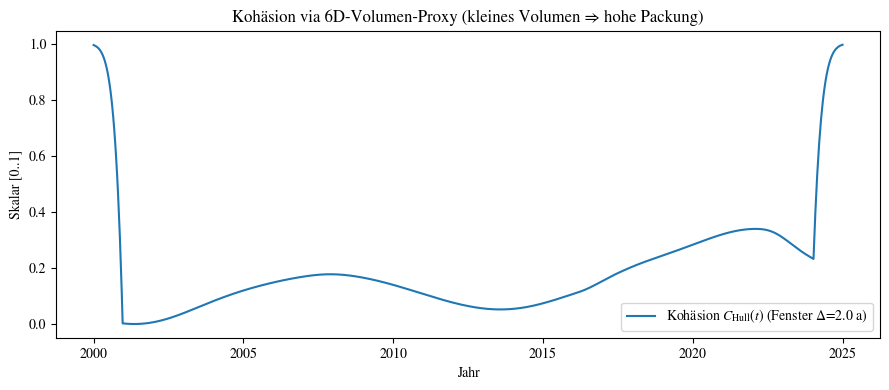

In [ ]:
# ==========================================
# 12) 6D-Embedding + SVD-Volumen-Proxy
# ==========================================
HULL_WINDOW_YEARS = 2.0  # Fensterbreite (Jahre)

def embed6(psi):
    # psi: complex (3,)
    return np.concatenate([psi.real, psi.imag])  # R^6

def window_volume_proxy(tcenter):
    idxs = window_indices(t_eval, tcenter, HULL_WINDOW_YEARS)
    if len(idxs) < 2: return 0.0
    # Sammle alle Agentenpunkte im Fenster
    X = []
    for ii in idxs:
        for P in AGENT_PATHS:
            X.append(embed6(P[ii]))
    X = np.asarray(X)  # (N_pts, 6)
    # Zentriere
    Xc = X - X.mean(axis=0, keepdims=True)
    # SVD
    try:
        s = np.linalg.svd(Xc, compute_uv=False)
    except np.linalg.LinAlgError:
        return 0.0
    # Volumen-Proxy = Produkt der Singulärwerte (numerisch stabil log-weise)
    s = np.clip(s, 1e-15, None)
    return float(np.exp(np.sum(np.log(s))))

V_proxy = np.array([window_volume_proxy(tc) for tc in t_eval])
Vmax = np.nanmax(V_proxy) + 1e-12
C_Hull = 1.0 - V_proxy / Vmax

plt.figure(figsize=(9,4))
plt.plot(t_eval, C_Hull, label=fr"Kohäsion $C_{{\mathrm{{Hull}}}}(t)$ (Fenster Δ={HULL_WINDOW_YEARS} a)")
plt.xlabel("Jahr"); plt.ylabel("Skalar [0..1]")
plt.title("Kohäsion via 6D-Volumen-Proxy (kleines Volumen ⇒ hohe Packung)")
plt.legend(); plt.tight_layout(); plt.show()


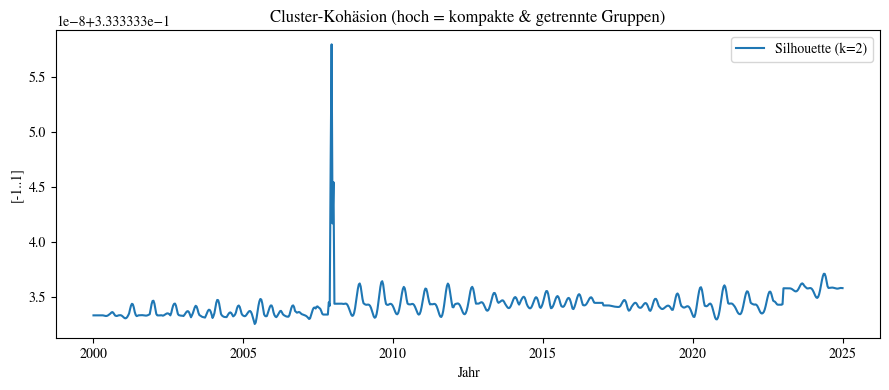

In [ ]:
# ================================================
# 13) Clustering & Silhouette (M > 3 Agenten)
# ================================================
# Vorbereitung: Wenn du zusätzliche Agenten hast, erweitere AGENT_PATHS = [...]
# Hier implementieren wir minimalistisches k-Means + Silhouette (rein NumPy).

def kmeans(X, k, iters=50, seed=0):
    rng = np.random.default_rng(seed)
    n = X.shape[0]
    # init: zufällige k Zentren
    centers = X[rng.choice(n, size=k, replace=False)]
    for _ in range(iters):
        # Zuordnung
        d2 = ((X[:,None,:]-centers[None,:,:])**2).sum(axis=2)  # (n,k)
        labels = np.argmin(d2, axis=1)
        # Zentren aktualisieren
        new_centers = np.array([X[labels==j].mean(axis=0) if np.any(labels==j) else centers[j] for j in range(k)])
        if np.allclose(new_centers, centers): break
        centers = new_centers
    return labels, centers

def silhouette_score(X, labels):
    # euklidische Distanzen
    n = len(X)
    # Vorberechnen Distanzmatrix (n,n)
    D = np.sqrt(((X[:,None,:]-X[None,:,:])**2).sum(axis=2))
    s = np.zeros(n)
    for i in range(n):
        Ci = labels[i]
        inC = (labels==Ci)
        out = ~inC
        # a_i: mittlere Distanz zu eigenem Cluster (ohne i)
        if inC.sum()>1:
            a_i = D[i,inC].sum()/(inC.sum()-1)
        else:
            a_i = 0.0
        # b_i: min mittlere Distanz zu anderem Cluster
        b_i = np.inf
        for Cj in np.unique(labels):
            if Cj==Ci: continue
            mask = (labels==Cj)
            if mask.sum()>0:
                b_i = min(b_i, D[i,mask].mean())
        if not np.isfinite(b_i):
            b_i = 0.0
        denom = max(a_i, b_i)
        s[i] = 0.0 if denom==0 else (b_i - a_i)/denom
    return float(np.mean(s))

# Parameter:
K_CLUSTERS = 2
SEED = 3

Sil = np.zeros_like(t_eval, dtype=float)
for kidx, tt in enumerate(t_eval):
    # X(t): alle Agenten im 6D-Embedding
    X = np.asarray([embed6(P[kidx]) for P in AGENT_PATHS])  # (M,6)
    # Optional: Normierung (sicherstellen)
    # X = X / (np.linalg.norm(X, axis=1, keepdims=True) + 1e-12)
    if len(AGENT_PATHS) < K_CLUSTERS:
        Sil[kidx] = np.nan
        continue
    labels, _ = kmeans(X, K_CLUSTERS, iters=40, seed=SEED)
    Sil[kidx] = silhouette_score(X, labels)

plt.figure(figsize=(9,4))
plt.plot(t_eval, Sil, label=fr"Silhouette (k={K_CLUSTERS})")
plt.xlabel("Jahr"); plt.ylabel("[-1..1]")
plt.title("Cluster-Kohäsion (hoch = kompakte & getrennte Gruppen)")
plt.legend(); plt.tight_layout(); plt.show()


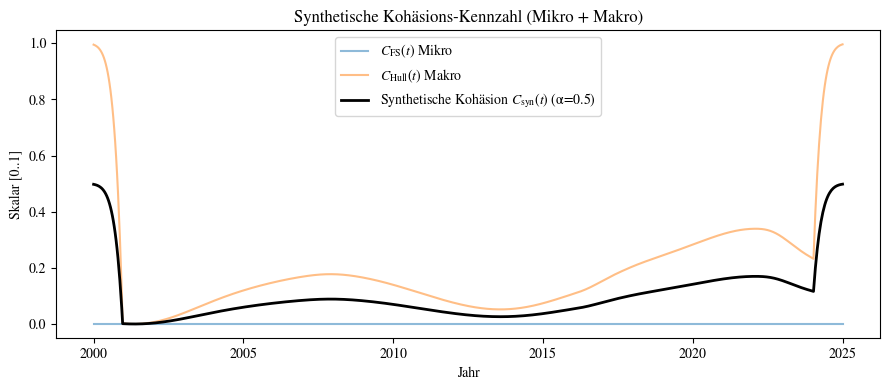

In [ ]:
# =====================================
# 14) Synthetische Kohäsions-Kennzahl
# =====================================

alpha = 0.5  # Gewicht für Mikro-Kohäsion (C_FS)
             # 1-alpha = Gewicht für Makro-Kohäsion (C_Hull)

# Sicherstellen, dass C_FS und C_Hull gleiche Länge und keine NaNs haben
C_FS_norm   = np.nan_to_num(C_FS, nan=0.0, posinf=0.0, neginf=0.0)
C_Hull_norm = np.nan_to_num(C_Hull, nan=0.0, posinf=0.0, neginf=0.0)

C_syn = alpha * C_FS_norm + (1.0 - alpha) * C_Hull_norm

plt.figure(figsize=(9,4))
plt.plot(t_eval, C_FS_norm,   label=r"$C_{\mathrm{FS}}(t)$ Mikro", alpha=0.5)
plt.plot(t_eval, C_Hull_norm, label=r"$C_{\mathrm{Hull}}(t)$ Makro", alpha=0.5)
plt.plot(t_eval, C_syn, color="black", lw=2,
         label=fr"Synthetische Kohäsion $C_{{\mathrm{{syn}}}}(t)$ (α={alpha})")
plt.xlabel("Jahr"); plt.ylabel("Skalar [0..1]")
plt.title("Synthetische Kohäsions-Kennzahl (Mikro + Makro)")
plt.legend(); plt.tight_layout(); plt.show()


Hier Betrachtungen zu einer 'künstlichen' Phase

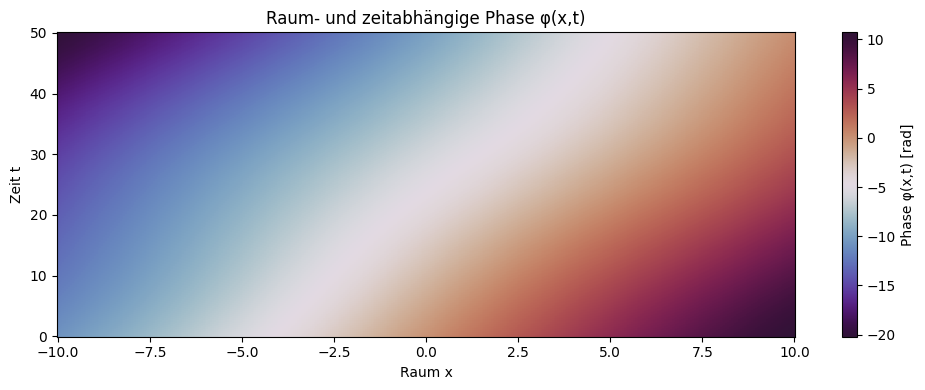

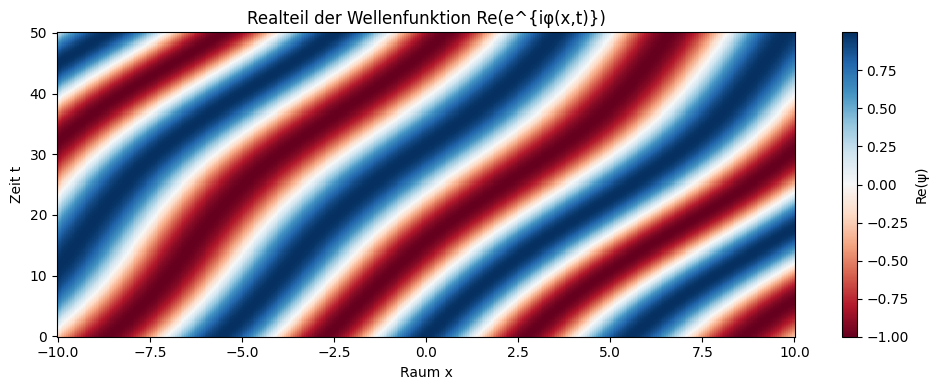

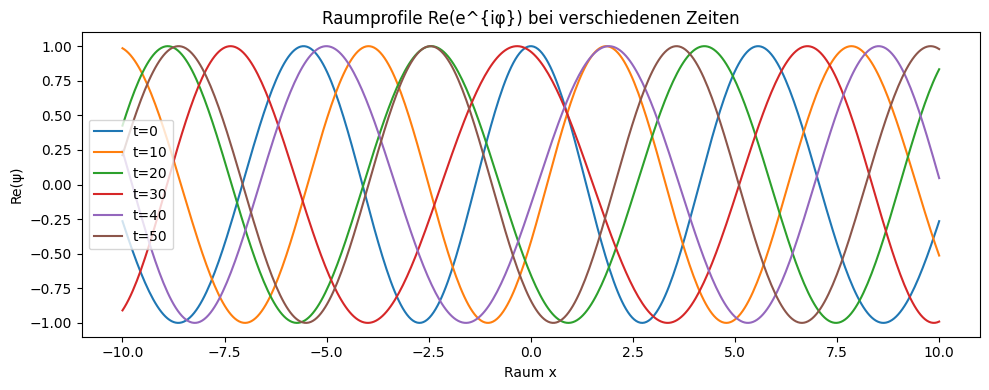

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Raum- und Zeitachsen
x = np.linspace(-10, 10, 400)
t = np.linspace(0, 50, 300)
X, T = np.meshgrid(x, t)

# Parameter
k = 1.0      # Wellenzahl
omega = 0.2  # Frequenz
alpha = 0.8  # Stärke der Modulation

# Phase
phi = k*X - omega*T + alpha*np.sin(0.2*X)*np.cos(0.1*T)

# Wellenfunktion
psi = np.exp(1j*phi)

# --- Plot 1: Phase selbst ---
plt.figure(figsize=(10,4))
plt.pcolormesh(X, T, phi, shading="auto", cmap="twilight_shifted")
plt.colorbar(label="Phase φ(x,t) [rad]")
plt.xlabel("Raum x"); plt.ylabel("Zeit t")
plt.title("Raum- und zeitabhängige Phase φ(x,t)")
plt.tight_layout()
plt.show()

# --- Plot 2: Realteil der Wellenfunktion ---
plt.figure(figsize=(10,4))
plt.pcolormesh(X, T, np.real(psi), shading="auto", cmap="RdBu")
plt.colorbar(label="Re(ψ)")
plt.xlabel("Raum x"); plt.ylabel("Zeit t")
plt.title("Realteil der Wellenfunktion Re(e^{iφ(x,t)})")
plt.tight_layout()
plt.show()

# --- Plot 3: Fixe Zeiten, Verlauf im Raum ---
plt.figure(figsize=(10,4))
for tt in [0, 10, 20, 30, 40, 50]:
    phi_t = k*x - omega*tt + alpha*np.sin(0.2*x)*np.cos(0.1*tt)
    psi_t = np.exp(1j*phi_t)
    plt.plot(x, np.real(psi_t), label=f"t={tt}")
plt.xlabel("Raum x"); plt.ylabel("Re(ψ)")
plt.title("Raumprofile Re(e^{iφ}) bei verschiedenen Zeiten")
plt.legend()
plt.tight_layout()
plt.show()


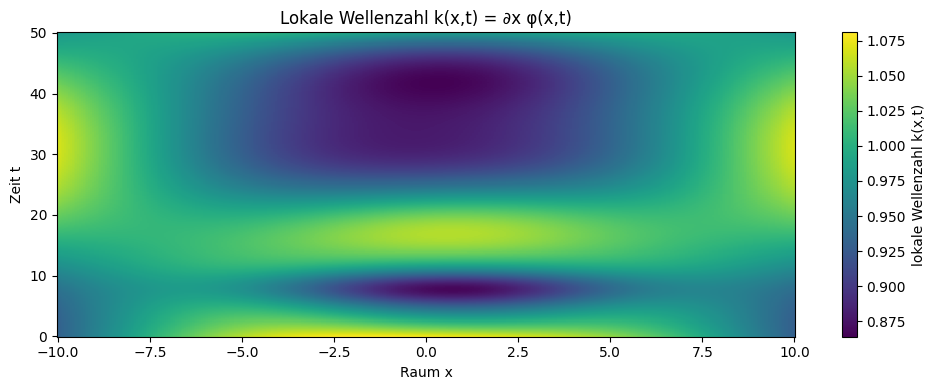

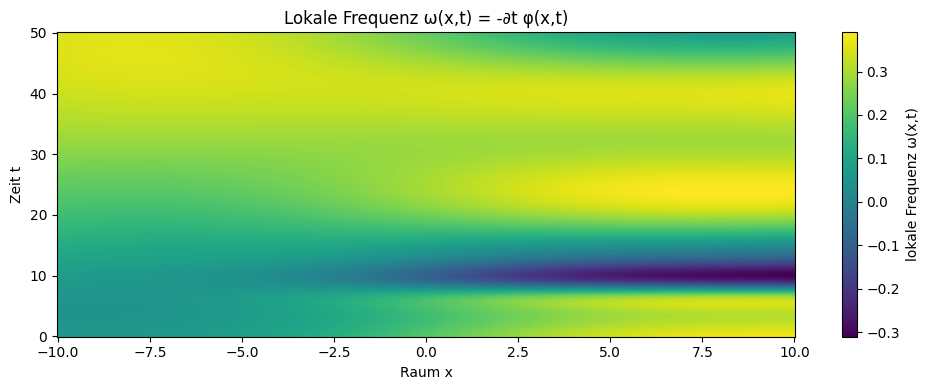

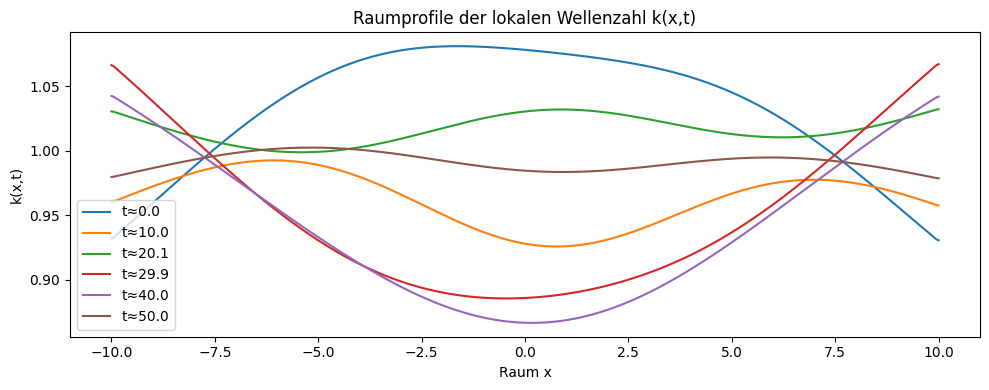

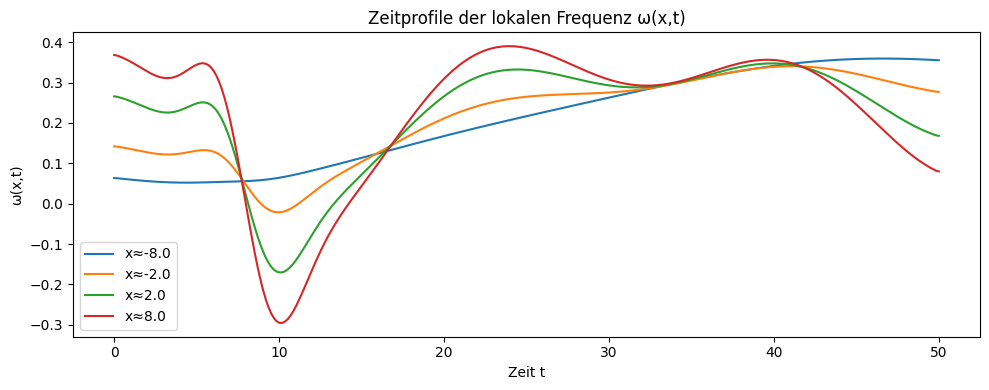

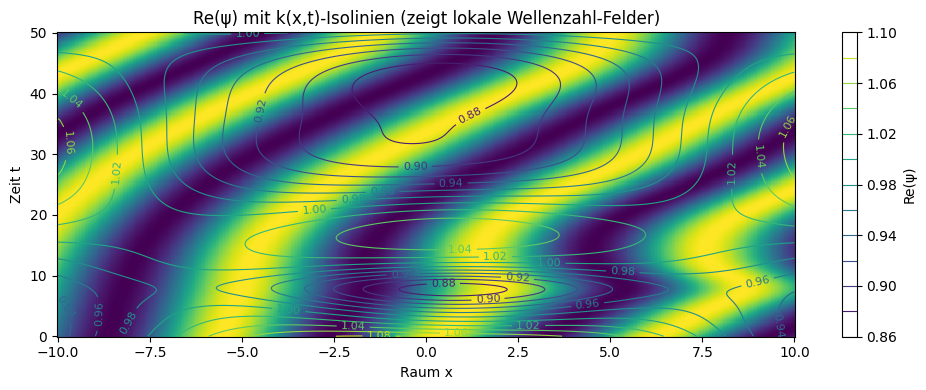

In [ ]:
# ---------------------------------------------
# Lokale Wellenzahl k(x,t) und Frequenz ω(x,t)
# ---------------------------------------------

dx = x[1] - x[0]
dt = t[1] - t[0]

# Ableitungen der Phase: ∂x φ, ∂t φ
dphi_dt, dphi_dx = np.gradient(phi, dt, dx)  # Reihenfolge: Achse 0=Zeit, 1=Raum

k_local   = dphi_dx                # k(x,t) = ∂x φ
omega_loc = -dphi_dt               # ω(x,t) = -∂t φ

# --- Heatmap: k(x,t) ---
plt.figure(figsize=(10,4))
plt.pcolormesh(X, T, k_local, shading="auto")
plt.colorbar(label="lokale Wellenzahl k(x,t)")
plt.xlabel("Raum x"); plt.ylabel("Zeit t")
plt.title("Lokale Wellenzahl k(x,t) = ∂x φ(x,t)")
plt.tight_layout(); plt.show()

# --- Heatmap: ω(x,t) ---
plt.figure(figsize=(10,4))
plt.pcolormesh(X, T, omega_loc, shading="auto")
plt.colorbar(label="lokale Frequenz ω(x,t)")
plt.xlabel("Raum x"); plt.ylabel("Zeit t")
plt.title("Lokale Frequenz ω(x,t) = -∂t φ(x,t)")
plt.tight_layout(); plt.show()

# --- 1D-Schnitte: k(x,t) bei fixen Zeiten ---
plt.figure(figsize=(10,4))
for tt in [0, 10, 20, 30, 40, 50]:
    # Index des Zeitgitters, der t≈tt am nächsten ist
    idx = np.argmin(np.abs(t - tt))
    plt.plot(x, k_local[idx], label=f"t≈{t[idx]:.1f}")
plt.xlabel("Raum x"); plt.ylabel("k(x,t)")
plt.title("Raumprofile der lokalen Wellenzahl k(x,t)")
plt.legend(); plt.tight_layout(); plt.show()

# --- 1D-Schnitte: ω(x,t) bei fixen Orten ---
plt.figure(figsize=(10,4))
for xx in [-8, -2, 2, 8]:
    jdx = np.argmin(np.abs(x - xx))
    plt.plot(t, omega_loc[:, jdx], label=f"x≈{x[jdx]:.1f}")
plt.xlabel("Zeit t"); plt.ylabel("ω(x,t)")
plt.title("Zeitprofile der lokalen Frequenz ω(x,t)")
plt.legend(); plt.tight_layout(); plt.show()

# --- Bonus: Re(ψ) mit lokaler k(x,t) als Konturen drübergelegt ---
plt.figure(figsize=(10,4))
plt.pcolormesh(X, T, np.real(psi), shading="auto")
cs = plt.contour(X, T, k_local, levels=10, linewidths=0.8)
plt.clabel(cs, inline=True, fontsize=8)
plt.colorbar(label="Re(ψ)")
plt.xlabel("Raum x"); plt.ylabel("Zeit t")
plt.title("Re(ψ) mit k(x,t)-Isolinien (zeigt lokale Wellenzahl-Felder)")
plt.tight_layout(); plt.show()


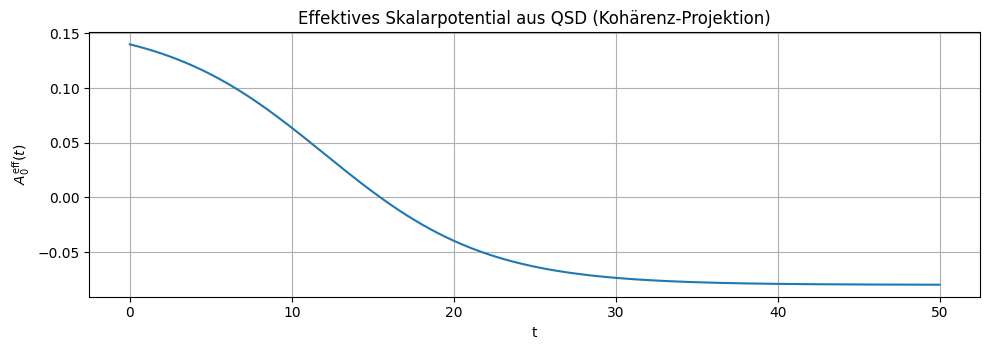

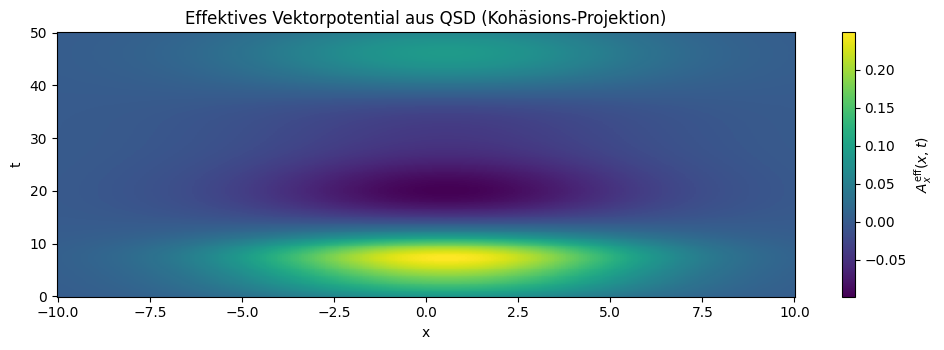

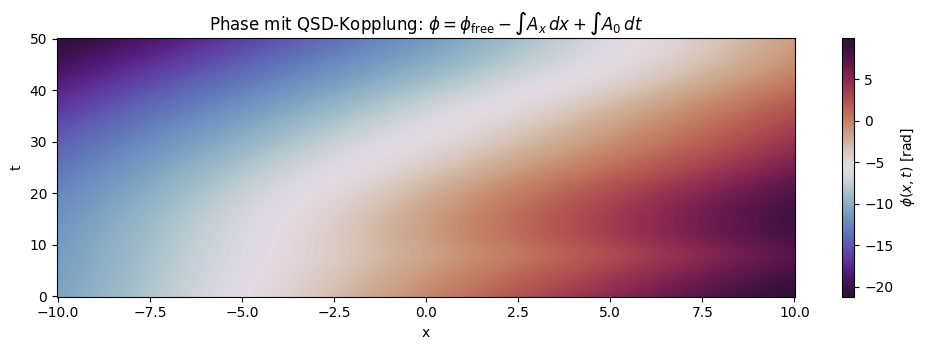

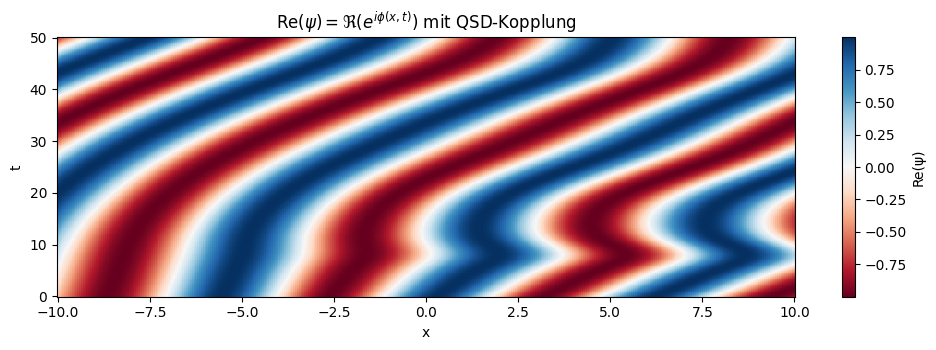

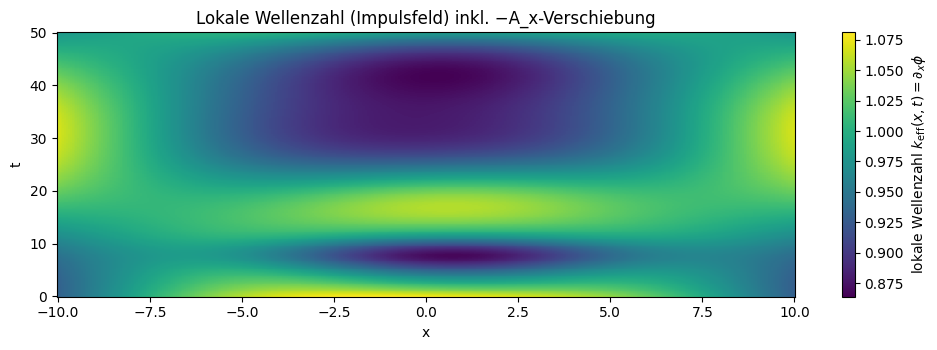

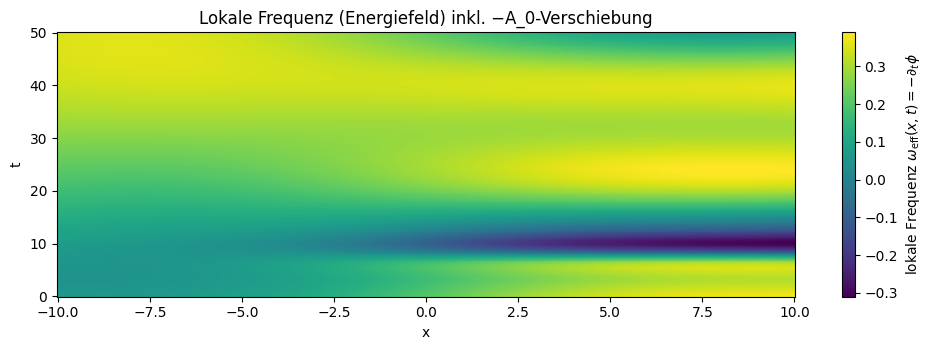

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# =========================
# Raum- und Zeitgitter
# =========================
x = np.linspace(-10, 10, 400)
t = np.linspace(  0, 50, 300)
X, T = np.meshgrid(x, t)

# =========================
# QSD-Treiber f_a(t) (vektorisiert, robuste Formen)
# =========================
def _tau_t(tt):
    tt = np.asarray(tt)
    return tt/2.0  # skaliert 0..50 -> 0..25

def f1_t(tt):
    tt = np.asarray(tt); τ = _tau_t(tt)
    return 0.1*np.sin(0.4*τ)

def f2_t(tt):
    tt = np.asarray(tt); τ = _tau_t(tt)
    return 0.1*np.cos(0.4*τ)

def f3_t(tt):
    tt = np.asarray(tt); τ = _tau_t(tt)
    return -0.2*np.tanh(0.2*(τ - 6.0))

def f4_t(tt):
    tt = np.asarray(tt); τ = _tau_t(tt)
    return 0.2*np.exp(-((τ - 4.0)**2)/2.0)

def f5_t(tt):
    tt = np.asarray(tt); τ = _tau_t(tt)
    return 0.1*np.sin(0.6*τ)

def f6_t(tt):
    tt = np.asarray(tt); τ = _tau_t(tt)
    return 0.2*np.sin(0.3*τ)

def f7_t(tt):
    tt = np.asarray(tt); τ = _tau_t(tt)
    return 0.1*np.cos(0.3*τ)

def f8_t(tt):
    # Konstante als Array gleicher Form wie tt
    tt = np.asarray(tt)
    return np.full_like(tt, 0.05, dtype=float)

def f_components_t(tt):
    """
    tt kann 1D (shape (T,)) oder 2D (shape (T,X)) sein.
    Rückgabe hat shape (..., 8); letzter Index ist a=1..8.
    """
    tt = np.asarray(tt)
    return np.stack([
        f1_t(tt), f2_t(tt), f3_t(tt), f4_t(tt),
        f5_t(tt), f6_t(tt), f7_t(tt), f8_t(tt)
    ], axis=-1)

# =========================
# Effektive U(1)-Projektion des QSD-Potentials
# =========================
# Gewichte (an dein SU(3)-Modell angelehnt)
w_coh = np.array([0,0,0.6,0,0,0,0,0.8], dtype=float); w_coh /= np.linalg.norm(w_coh)+1e-12
w_koh = np.array([1,1,0,1,1,1,1,0], dtype=float);      w_koh /= np.linalg.norm(w_koh)+1e-12

A0_scale, Ax_scale = 1.0, 1.0
# Skalarpotential aus Kohärenz-Projektion (nur t-abhängig)
A0_eff = A0_scale * (f_components_t(t) @ w_coh)     # shape (T,)
# Vektorpotential aus Kohäsions-Projektion (t-abhängig, plus x-Hülle)
envelope_x = np.exp(-(X**2)/30.0)                   # breite räumliche Hülle
Ax_eff = Ax_scale * (f_components_t(T) @ w_koh)     # shape (T,X), Basis zeitabhängig
Ax_eff = Ax_eff * (1 + 0.25*np.sin(0.15*X)) * envelope_x  # leichte x-Struktur

# =========================
# Grundphase + Modulation (ohne A)
# =========================
k0    = 1.0
omega0= 0.2
alpha = 0.8
phi_free = k0*X - omega0*T + alpha*np.sin(0.2*X)*np.cos(0.1*T)

# =========================
# Kopplung: φ = φ_free − q ∫^x A_x dx + q ∫^t A_0 dt
# =========================
q  = 1.0
dx = x[1] - x[0]
dt = t[1] - t[0]

# -∫ A_x dx  (Zeilenweise Integration entlang x)
Ax_int = np.cumsum(Ax_eff, axis=1) * dx
phi_from_Ax = - q * Ax_int

# +∫ A_0 dt  (Spaltenweise gleiche A0 über x, daher Kacheln)
A0_tile = np.tile(A0_eff.reshape(-1,1), (1, X.shape[1]))
A0_int  = np.cumsum(A0_tile, axis=0) * dt
phi_from_A0 = + q * A0_int

phi = phi_free + phi_from_Ax + phi_from_A0
psi = np.exp(1j*phi)

# Lokale Größen
dphi_dt, dphi_dx = np.gradient(phi, dt, dx)  # Achse 0 = t, Achse 1 = x
k_local   = dphi_dx
omega_loc = -dphi_dt

# =========================
# Plots
# =========================
plt.figure(figsize=(10,3.6))
plt.plot(t, A0_eff)
plt.xlabel("t"); plt.ylabel(r"$A_0^{\rm eff}(t)$")
plt.title("Effektives Skalarpotential aus QSD (Kohärenz-Projektion)")
plt.grid(True); plt.tight_layout(); plt.show()

plt.figure(figsize=(10,3.6))
plt.pcolormesh(X, T, Ax_eff, shading="auto")
plt.colorbar(label=r"$A_x^{\rm eff}(x,t)$")
plt.xlabel("x"); plt.ylabel("t")
plt.title("Effektives Vektorpotential aus QSD (Kohäsions-Projektion)")
plt.tight_layout(); plt.show()

plt.figure(figsize=(10,3.6))
plt.pcolormesh(X, T, phi, shading="auto", cmap="twilight_shifted")
plt.colorbar(label=r"$\phi(x,t)$ [rad]")
plt.xlabel("x"); plt.ylabel("t")
plt.title(r"Phase mit QSD-Kopplung: $\phi=\phi_{\rm free} - \int A_x\,dx + \int A_0\,dt$")
plt.tight_layout(); plt.show()

plt.figure(figsize=(10,3.6))
plt.pcolormesh(X, T, np.real(psi), shading="auto", cmap="RdBu")
plt.colorbar(label="Re(ψ)")
plt.xlabel("x"); plt.ylabel("t")
plt.title(r"Re$(\psi)=\Re(e^{i\phi(x,t)})$ mit QSD-Kopplung")
plt.tight_layout(); plt.show()

plt.figure(figsize=(10,3.6))
plt.pcolormesh(X, T, k_local, shading="auto")
plt.colorbar(label=r"lokale Wellenzahl $k_{\rm eff}(x,t)=\partial_x\phi$")
plt.xlabel("x"); plt.ylabel("t")
plt.title("Lokale Wellenzahl (Impulsfeld) inkl. −A_x-Verschiebung")
plt.tight_layout(); plt.show()

plt.figure(figsize=(10,3.6))
plt.pcolormesh(X, T, omega_loc, shading="auto")
plt.colorbar(label=r"lokale Frequenz $\omega_{\rm eff}(x,t)=-\partial_t\phi$")
plt.xlabel("x"); plt.ylabel("t")
plt.title("Lokale Frequenz (Energiefeld) inkl. −A_0-Verschiebung")
plt.tight_layout(); plt.show()


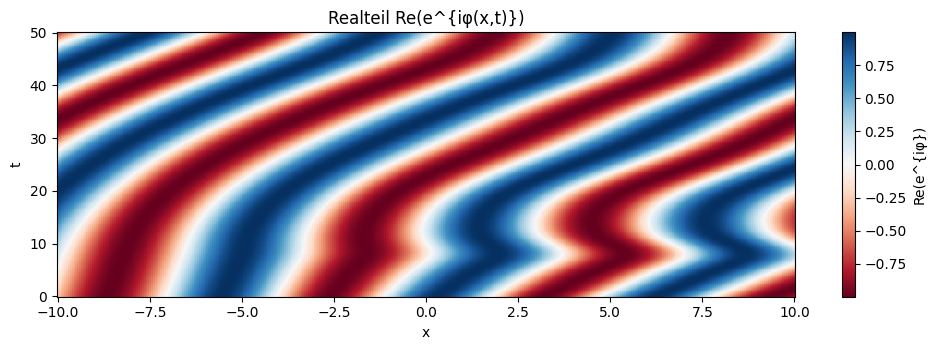

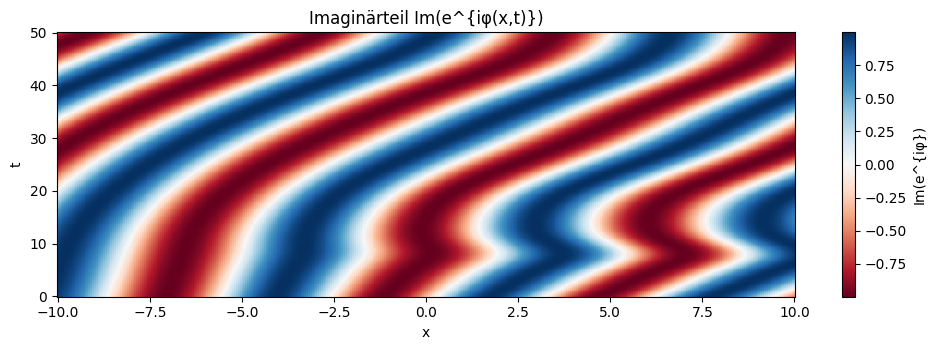

In [ ]:
# --- A1: Heatmap Re(e^{iφ(x,t)}) ---
plt.figure(figsize=(10,3.6))
plt.pcolormesh(X, T, np.real(psi), shading="auto", cmap="RdBu")
plt.colorbar(label="Re(e^{iφ})")
plt.xlabel("x"); plt.ylabel("t")
plt.title("Realteil Re(e^{iφ(x,t)})")
plt.tight_layout(); plt.show()

# --- A2: Heatmap Im(e^{iφ(x,t)}) ---
plt.figure(figsize=(10,3.6))
plt.pcolormesh(X, T, np.imag(psi), shading="auto", cmap="RdBu")
plt.colorbar(label="Im(e^{iφ})")
plt.xlabel("x"); plt.ylabel("t")
plt.title("Imaginärteil Im(e^{iφ(x,t)})")
plt.tight_layout(); plt.show()


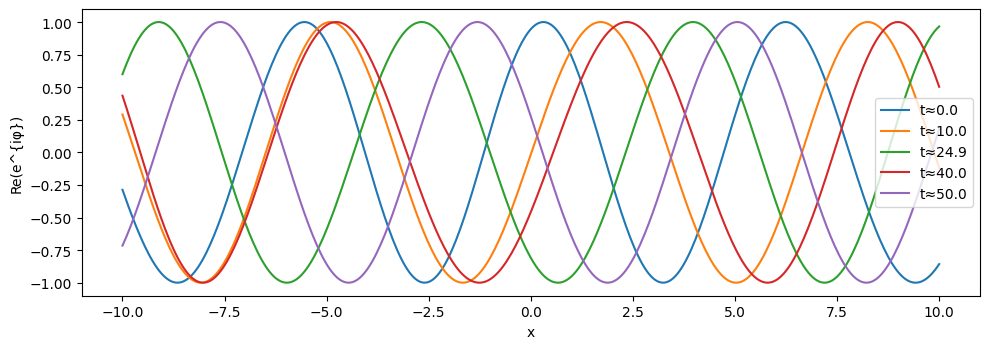

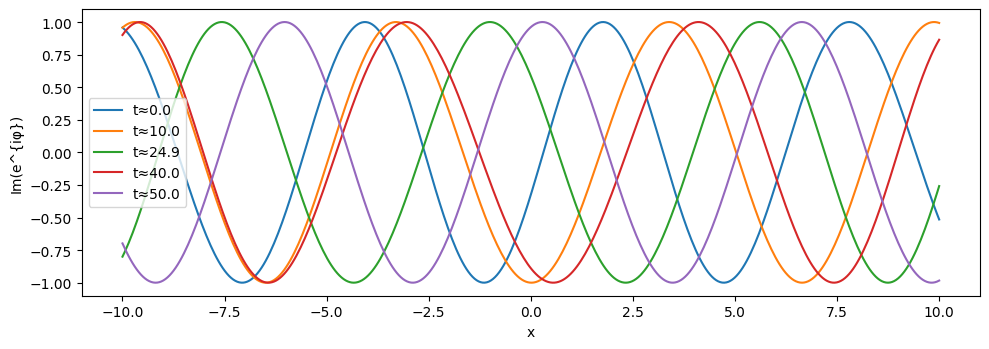

In [ ]:
# Schnitte: Re/Im bei fixen Zeiten
plt.figure(figsize=(10,3.6))
for tt in [0, 10, 25, 40, 50]:
    idx = np.argmin(np.abs(t - tt))
    plt.plot(x, np.real(psi[idx]), label=f"t≈{t[idx]:.1f}")
plt.xlabel("x"); plt.ylabel("Re(e^{iφ})"); plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(10,3.6))
for tt in [0, 10, 25, 40, 50]:
    idx = np.argmin(np.abs(t - tt))
    plt.plot(x, np.imag(psi[idx]), label=f"t≈{t[idx]:.1f}")
plt.xlabel("x"); plt.ylabel("Im(e^{iφ})"); plt.legend(); plt.tight_layout(); plt.show()
